In [1]:
import pandas as pd
import pandas_ta as ta
import numpy as np
import datetime as dt
from datetime import date
from pandas_datareader import data as pdr
import warnings
warnings.filterwarnings("ignore")
import yfinance as yf
# xgboost
from xgboost import XGBRegressor
from matplotlib import pyplot
from sklearn.metrics import mean_absolute_error
from pickle import dump, load
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.preprocessing import StandardScaler

In [2]:
start = dt.datetime(2020,1,1)
end = dt.datetime(2020,12,31)

In [3]:
start_act1 = dt.datetime(2020,1,1)
end_act1 = dt.datetime(2020,3,31)

start_act2 = dt.datetime(2020,4,1)
end_act2 = dt.datetime(2020,6,30)

start_act3 = dt.datetime(2020,7,1)
end_act3 = dt.datetime(2020,9,30)

start_act4 = dt.datetime(2020,10,1)
end_act4 = dt.datetime(2020,12,31)

# Create Function to Extract Stock Price

In [4]:
def convert_date(data):
    data.date = pd.to_datetime(data.date)
    data["date"] = data["date"].apply(lambda x: pd.to_datetime(x, unit="ns", utc=True).floor('D').date())
    return data

In [5]:
def get_stock_info(quote, start, end):
    yf.pdr_override()
    stock_data = pdr.get_data_yahoo(quote, start = start, end = end)
    stock_data = stock_data.reset_index()
    stock_data.columns = stock_data.columns.str.replace('Date', 'date')
    stock_data = convert_date(stock_data)
    #add pct change column to capture daily crypto price change
    ClosingPrice = stock_data[['Adj Close']]
    stock_data['pct_change'] = ClosingPrice.pct_change()*100
    stock_data = stock_data.set_index('date')
    
    return stock_data

In [6]:
#consumers
nestle_data = get_stock_info('4707.KL', start, end)
ppb_data = get_stock_info('4065.KL', start, end)
hapseng_data = get_stock_info('3034.KL', start, end)
ql_resource_data = get_stock_info('7084.KL', start, end)
fn_data = get_stock_info('3689.KL', start, end)

#plantations
ioi_data = get_stock_info('1961.KL', start, end)
sime_darby_data = get_stock_info('5285.KL', start, end)
genting_data = get_stock_info('2291.KL', start, end)
sarawak_data = get_stock_info('5126.KL', start, end)

#property
sunway_data = get_stock_info('5211.KL', start, end)
sp_setia_data = get_stock_info('8664.KL', start, end)
ecoworld_data = get_stock_info('8206.KL', start, end)
uoa_data = get_stock_info('5200.KL', start, end)

#reit
klcc_data = get_stock_info('5235SS.KL', start, end)
igb_data = get_stock_info('5227.KL', start, end)
pavilion_data = get_stock_info('5212.KL', start, end)

#construction
kerjaya_data = get_stock_info('7161.KL', start, end)
ekovest_data = get_stock_info('8877.KL', start, end)
gadang_data = get_stock_info('9261.KL', start, end)
econpile_data = get_stock_info('5253.KL', start, end)

#technology
inari_data = get_stock_info('0166.KL', start, end)
greentech_data = get_stock_info('7204.KL', start, end)
myeg_data = get_stock_info('0138.KL', start, end)

#industrial
vitrox_data = get_stock_info('0097.KL', start, end)
unisem_data = get_stock_info('5005.KL', start, end)
vs_data = get_stock_info('6963.KL', start, end)

#utilities
ytl_data = get_stock_info('4677.KL', start, end)
tenaga_data = get_stock_info('5347.KL', start, end)
malakoff_data = get_stock_info('5264.KL', start, end)

#transport
my_airport_data = get_stock_info('5014.KL', start, end)
westport_data = get_stock_info('5246.KL', start, end)
misc_data = get_stock_info('3816.KL', start, end)

#energy
petronas_data = get_stock_info('5681.KL', start, end)
yinson_data = get_stock_info('7293.KL', start, end)
dialog_data = get_stock_info('7277.KL', start, end)
bumi_armada_data = get_stock_info('5210.KL', start, end)

#finance
rhb_data = get_stock_info('1066.KL', start, end)
hongleong_data = get_stock_info('5819.KL', start, end)
cimb_data = get_stock_info('1023.KL', start, end)
public_data = get_stock_info('1295.KL', start, end)
maybank_data = get_stock_info('1155.KL', start, end)

#healthcare
ihh_data = get_stock_info('5225.KL', start, end)
kpj_data = get_stock_info('5878.KL', start, end)
topglove_data = get_stock_info('7113.KL', start, end)
harta_data = get_stock_info('5168.KL', start, end)
kossan_data = get_stock_info('7153.KL', start, end)

#telecommunication
tm_data = get_stock_info('4863.KL', start, end)
axiata_data = get_stock_info('6888.KL', start, end)
digi_data = get_stock_info('6947.KL', start, end)
maxis_data = get_stock_info('6012.KL', start, end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

In [7]:
ioi_data = get_stock_info('1961.KL', start, end)

[*********************100%***********************]  1 of 1 completed


# Load sentiment score from news

In [8]:
news = pd.read_csv(r"Data/sentiment_result/sentiment_lagged_with_category.csv",sep="\t")

In [9]:
news['date'] = news['date'].apply(lambda x: dt.datetime.strptime(x, '%Y-%m-%d'))

In [10]:
#news["date"] = news["date"].apply(lambda x: pd.to_datetime(x, unit="ns", utc=True).floor('D').date())

In [11]:
def news_sentiment_group_by_category(start, end, data):
    #2019-07-02
    data = data[(data['date'] >= start) & (data['date'] <= end)]
    
    data["date"] = data["date"].apply(lambda x: pd.to_datetime(x, unit="ns", utc=True).floor('D').date())
    bnm_news = data[(data['category'] == 'Bank Negara Malaysia')].reset_index()
    covid_news = data[(data['category'] == 'Covid-19 Malaysia') | (data['category'] == 'Malaysia MCO') |
                      (data['category'] == 'Malaysia Recover Plan')].reset_index()
    economy_news = data[(data['category'] == 'Malaysia Economy') | (data['category'] == 'Malaysia Employment') |
                        (data['category'] == 'Malaysia Government Policy') | (data['category'] == 'Malaysia Moratorium') |
                        (data['category'] == 'Malaysia Stimulus')].reset_index()
    all_news = data[(data['category'] == 'Bank Negara Malaysia') | (data['category'] == 'Covid-19 Malaysia') |
                    (data['category'] == 'Malaysia MCO') | (data['category'] == 'Malaysia Economy') |
                    (data['category'] == 'Malaysia Employment') |
                        (data['category'] == 'Malaysia Government Policy') | (data['category'] == 'Malaysia Moratorium') |
                        (data['category'] == 'Malaysia Stimulus') |
                      (data['category'] == 'Malaysia Recover Plan')].reset_index()
    entire = data
   
    bnm_news = split_news_category(bnm_news)
    covid_news = split_news_category(covid_news)
    economy_news = split_news_category(economy_news)
    all_news = split_news_category(all_news)

    return bnm_news,covid_news,economy_news, all_news, entire

In [12]:
def split_news_category(data):
    #group daily sentiment score
    data = data.drop(['sentiment_score_1','category'], axis=1)
    data = data.groupby(['date'])['sentiment_score'].mean().reset_index().rename(columns={'mean':'sentiment score'})
    data = data.set_index('date') 
    data = data.sort_index() # sort by datetime
    data = data.reset_index()
    
    data = data.set_index('date')
    
    data["sentiment_score_1"] = data.shift(1)
    return data

In [13]:
bnm_news,covid_news,economy_news, all_news, entire = news_sentiment_group_by_category(start, end, news)

In [14]:
bnm_news1,covid_news1,economy_news1, all_news1, entire1 = news_sentiment_group_by_category(start_act1, end_act1, news)
bnm_news2,covid_news2,economy_news2, all_news2, entire2 = news_sentiment_group_by_category(start_act2, end_act2, news)
bnm_news3,covid_news3,economy_news3, all_news3, entire3 = news_sentiment_group_by_category(start_act3, end_act3, news)
bnm_news4,covid_news4,economy_news4, all_news4, entire4 = news_sentiment_group_by_category(start_act4, end_act4, news)

### Filter with strong sentiment

In [15]:
#remove all the sentiment score left only between -0.5 above or more than 0.5
positive = 0.5
negative = -0.5

bnm_news_strong_sentiment = bnm_news[(bnm_news['sentiment_score'] > positive) | (bnm_news['sentiment_score'] < negative)]
covid_news_strong_sentiment = covid_news[(covid_news['sentiment_score'] > positive) | (covid_news['sentiment_score'] < negative)]
economy_news_strong_sentiment = economy_news[(economy_news['sentiment_score'] > positive) | (economy_news['sentiment_score'] < negative)]
all_news_strong_sentiment = all_news[(all_news['sentiment_score'] > positive) | (all_news['sentiment_score'] < negative)]
entire_news_strong_sentiment = entire[(entire['sentiment_score'] > positive) | (entire['sentiment_score'] < negative)]

In [16]:
#remove all the sentiment score left only between -0.5 above or more than 0.5
positive = 0.5
negative = -0.5

covid_news_strong_sentiment1 = covid_news1[(covid_news1['sentiment_score'] > positive) | (covid_news1['sentiment_score'] < negative)]
covid_news_strong_sentiment2 = covid_news2[(covid_news2['sentiment_score'] > positive) | (covid_news2['sentiment_score'] < negative)]
covid_news_strong_sentiment3 = covid_news3[(covid_news3['sentiment_score'] > positive) | (covid_news3['sentiment_score'] < negative)]
covid_news_strong_sentiment4 = covid_news4[(covid_news4['sentiment_score'] > positive) | (covid_news4['sentiment_score'] < negative)]

In [17]:
entire

,Unnamed: 0,date,sentiment_score,sentiment_score_1,category
30,30,2020-01-17,0.018119,0.028988,Axiata
31,31,2020-01-23,-0.334419,0.018119,Axiata
32,32,2020-01-24,-0.119017,-0.334419,Axiata
33,33,2020-01-29,0.146429,-0.119017,Axiata
34,34,2020-02-10,0.028221,0.146429,Axiata
...,...,...,...,...,...
13007,13007,2020-12-10,0.057511,0.024284,YTL
13008,13008,2020-12-15,0.245988,0.057511,YTL
13009,13009,2020-12-16,0.255963,0.245988,YTL
13010,13010,2020-12-21,0.213213,0.255963,YTL


# Merging Sentiment & Stock Price data

In [18]:
def merge_sentiment_stock(stock_data, bnm_news, covid_news, economy_news):
    sentiment_stock_data = pd.DataFrame({
        'bnm_news': bnm_news.sentiment_score, 
        'covid_news': covid_news.sentiment_score, 
        'economy_news': economy_news.sentiment_score,
        'adj close': stock_data['Adj Close']
    })
    
    column_name = "adj close"
    sentiment_stock_data = sentiment_stock_data.dropna(subset=[column_name])
    return sentiment_stock_data

In [19]:
def merge_covid_sentiment_stock(stock_data, covid_news):
    sentiment_stock_data = pd.DataFrame({
        'covid_news': covid_news.sentiment_score, 
        'adj close': stock_data['Adj Close']
    })
    
    column_name = "adj close"
    sentiment_stock_data = sentiment_stock_data.dropna(subset=[column_name])
    return sentiment_stock_data

In [20]:
def merge_all_sentiment_stock(stock_data, all_news):
    sentiment_stock_data = pd.DataFrame({
        'all_news': all_news.sentiment_score, 
        'adj close': stock_data['Adj Close']
    })
    
    column_name = "adj close"
    sentiment_stock_data = sentiment_stock_data.dropna(subset=[column_name])
    return sentiment_stock_data

In [21]:
# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

In [22]:
# split a univariate dataset into train/test sets
# def train_test_split(data, n_test):
#     train = data[:-n_test, :]
#     print(train)
#     test = data[-n_test:, :]
#     print(test)
#     return train, test

In [23]:
# fit an xgboost model and make a one step prediction
def xgboost_forecast(train, testX):
    # transform list into array
    train = np.asarray(train)
    # split into input and output columns
    trainX, trainy = train[:, :-1], train[:, -1]
    # fit model
    model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
    model.fit(trainX, trainy)
    # make a one-step prediction
    yhat = model.predict([testX])
    return yhat[0]
 

In [24]:
def xgboost2_forecast(data, textX):
    #Load data
    X = data[:, :-1]
    y = data[:, -1]
    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, shuffle=False)
    
    # Convert the training and testing sets into DMatrix objects
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    # Set the parameters for the XGBoost model
    params = {'objective': 'reg:squarederror',
          'eval_metric': 'rmse',
          'eta': 0.1,
          'max_depth': 5}

    # Train the model
    model = xgb.train(params, dtrain)
    
    importances = model.get_score()
    
    print(importances)

    # Make predictions on the test set
    predictions = model.predict(dtest)

    # Calculate the root mean squared error of the predictions
    rmse = np.sqrt(mean_squared_error(y_test, predictions))
    print("RMSE:", rmse)
    
    return predictions[0], importances

In [25]:
def plot_importance(importances):
    # Sort the feature importances by score
    sorted_importances = sorted(importances.items(), key=lambda x: x[1], reverse=True)

    # Extract the feature names and scores
    feature_names = [x[0] for x in sorted_importances]
    feature_scores = [x[1] for x in sorted_importances]

    # Plot the feature importances
    plt.bar(range(len(feature_scores)), feature_scores)
    plt.xticks(range(len(feature_scores)), feature_names, rotation='vertical')
    plt.show()

In [26]:
# walk-forward validation for univariate data
def walk_forward_validation(data, n_test):
    predictions = list()
    
    # split dataset
    train, test = train_test_split(data, test_size=0.30, shuffle=False)
    # seed history with training dataset
    history = [x for x in train]
    
    # step over each time-step in the test set
    for i in range(len(test)):
        # split test row into input and output columns
        testX, testy = test[i, :-1], test[i, -1]
        # fit model on history and make a prediction
        yhat = xgboost_forecast(history, testX)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
        # summarize progress
        print('>expected=%.1f, predicted=%.1f' % (testy, yhat))
        # estimate prediction error
    
    error = mean_absolute_error(test[:, -1], predictions)
    return error, test[:, -1], predictions

In [27]:
def plot_prediction_result(values, var):
    # transform the time series data into supervised learning
    data = series_to_supervised(values, n_in=var)
    # evaluate
    sample = int(data.shape[0])
    mae, y, yhat = walk_forward_validation(data, sample)
    #print(y)
    print('MAE: %.3f' % mae)
    # plot expected vs preducted
    pyplot.plot(y, label='Expected')
    pyplot.plot(yhat, label='Predicted')
    pyplot.legend()
    pyplot.show()

In [28]:
def generate_result(data, bnm_news_strong_sentiment, covid_news_strong_sentiment, economy_news_strong_sentiment):
    sentiment_stock_data = merge_sentiment_stock(data, bnm_news_strong_sentiment, covid_news_strong_sentiment, economy_news_strong_sentiment)
    sentiment_stock_data_without_sentiment = sentiment_stock_data[['adj close']].fillna(0).values

    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_without_sentiment));
    plot_prediction_result(sentiment_stock_data_without_sentiment, 1)

    sentiment_stock_data_with_sentiment = sentiment_stock_data[['bnm_news','covid_news','economy_news','adj close']].fillna(0).values

    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_with_sentiment));
    plot_prediction_result(sentiment_stock_data_with_sentiment, 4)

In [29]:
def generate_all_news_result(data, all_news_strong_sentiment):
    sentiment_stock_data = merge_all_sentiment_stock(data, all_news_strong_sentiment)
    sentiment_stock_data_without_sentiment = sentiment_stock_data[['adj close']].fillna(0).values

    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_without_sentiment));
    plot_prediction_result(sentiment_stock_data_without_sentiment, 1)

    sentiment_stock_data_with_sentiment = sentiment_stock_data[['all_news','adj close']].fillna(0).values

    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_with_sentiment));
    plot_prediction_result(sentiment_stock_data_with_sentiment, 2)

In [30]:
def generate_covid_news_result(data, covid_news_strong_sentiment):
    sentiment_stock_data = merge_covid_sentiment_stock(data, covid_news_strong_sentiment)
    sentiment_stock_data_without_sentiment = sentiment_stock_data[['adj close']].fillna(0).values

    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_without_sentiment));
    plot_prediction_result(sentiment_stock_data_without_sentiment, 1)

    sentiment_stock_data_with_sentiment = sentiment_stock_data.fillna(0).values
    # To check the dimension of the array
    print("Shape of the array = ",np.shape(sentiment_stock_data_with_sentiment));
    plot_prediction_result(sentiment_stock_data_with_sentiment, 2)

Shape of the array =  (246, 1)
>expected=134.4, predicted=132.2
>expected=134.3, predicted=131.9
>expected=132.8, predicted=133.9
>expected=133.0, predicted=132.8
>expected=132.9, predicted=132.7
>expected=134.5, predicted=132.1
>expected=133.7, predicted=131.9
>expected=133.5, predicted=134.4
>expected=134.4, predicted=133.0
>expected=134.1, predicted=134.3
>expected=135.0, predicted=133.1
>expected=134.2, predicted=133.8
>expected=133.3, predicted=133.9
>expected=133.3, predicted=134.0
>expected=134.0, predicted=133.3
>expected=132.3, predicted=133.1
>expected=135.4, predicted=133.3
>expected=133.9, predicted=132.8
>expected=132.8, predicted=133.5
>expected=133.7, predicted=133.4
>expected=133.1, predicted=133.9
>expected=135.1, predicted=132.7
>expected=133.1, predicted=134.2
>expected=135.6, predicted=135.1
>expected=133.1, predicted=135.5
>expected=133.1, predicted=135.4
>expected=138.0, predicted=134.6
>expected=135.0, predicted=138.7
>expected=135.6, predicted=134.7
>expected=13

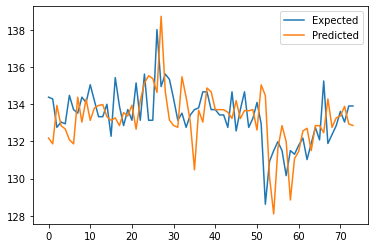

Shape of the array =  (246, 2)
>expected=134.4, predicted=133.4
>expected=134.3, predicted=132.7
>expected=132.8, predicted=134.1
>expected=133.0, predicted=133.5
>expected=132.9, predicted=133.6
>expected=134.5, predicted=133.4
>expected=133.7, predicted=131.8
>expected=133.5, predicted=133.8
>expected=134.4, predicted=133.3
>expected=134.1, predicted=132.8
>expected=135.0, predicted=133.0
>expected=134.2, predicted=134.0
>expected=133.3, predicted=134.2
>expected=133.3, predicted=134.2
>expected=134.0, predicted=131.5
>expected=132.3, predicted=133.8
>expected=135.4, predicted=133.5
>expected=133.9, predicted=136.1
>expected=132.8, predicted=132.9
>expected=133.7, predicted=133.5
>expected=133.1, predicted=133.2
>expected=135.1, predicted=133.7
>expected=133.1, predicted=134.1
>expected=135.6, predicted=133.5
>expected=133.1, predicted=133.6
>expected=133.1, predicted=134.8
>expected=138.0, predicted=133.9
>expected=135.0, predicted=135.8
>expected=135.6, predicted=136.2
>expected=13

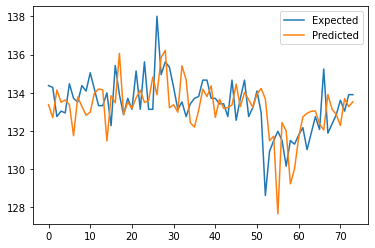

In [31]:
generate_all_news_result(nestle_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=134.4, predicted=132.2
>expected=134.3, predicted=131.9
>expected=132.8, predicted=133.9
>expected=133.0, predicted=132.8
>expected=132.9, predicted=132.7
>expected=134.5, predicted=132.1
>expected=133.7, predicted=131.9
>expected=133.5, predicted=134.4
>expected=134.4, predicted=133.0
>expected=134.1, predicted=134.3
>expected=135.0, predicted=133.1
>expected=134.2, predicted=133.8
>expected=133.3, predicted=133.9
>expected=133.3, predicted=134.0
>expected=134.0, predicted=133.3
>expected=132.3, predicted=133.1
>expected=135.4, predicted=133.3
>expected=133.9, predicted=132.8
>expected=132.8, predicted=133.5
>expected=133.7, predicted=133.4
>expected=133.1, predicted=133.9
>expected=135.1, predicted=132.7
>expected=133.1, predicted=134.2
>expected=135.6, predicted=135.1
>expected=133.1, predicted=135.5
>expected=133.1, predicted=135.4
>expected=138.0, predicted=134.6
>expected=135.0, predicted=138.7
>expected=135.6, predicted=134.7
>expected=13

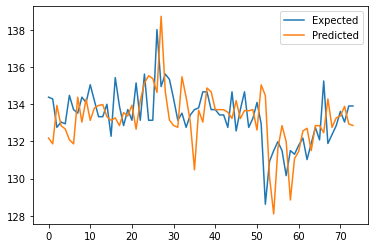

Shape of the array =  (246, 2)
>expected=134.4, predicted=132.4
>expected=134.3, predicted=133.2
>expected=132.8, predicted=133.6
>expected=133.0, predicted=132.9
>expected=132.9, predicted=132.7
>expected=134.5, predicted=131.4
>expected=133.7, predicted=133.1
>expected=133.5, predicted=133.6
>expected=134.4, predicted=132.9
>expected=134.1, predicted=132.3
>expected=135.0, predicted=133.4
>expected=134.2, predicted=133.6
>expected=133.3, predicted=132.9
>expected=133.3, predicted=133.4
>expected=134.0, predicted=132.5
>expected=132.3, predicted=133.8
>expected=135.4, predicted=133.4
>expected=133.9, predicted=133.4
>expected=132.8, predicted=133.6
>expected=133.7, predicted=132.1
>expected=133.1, predicted=135.4
>expected=135.1, predicted=131.9
>expected=133.1, predicted=133.5
>expected=135.6, predicted=133.4
>expected=133.1, predicted=133.4
>expected=133.1, predicted=135.0
>expected=138.0, predicted=133.7
>expected=135.0, predicted=136.3
>expected=135.6, predicted=135.2
>expected=13

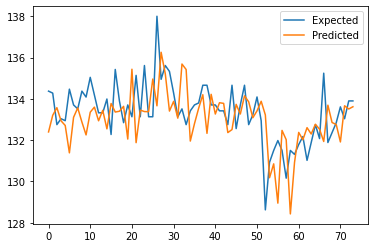

In [32]:
generate_covid_news_result(nestle_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=18.0, predicted=17.8
>expected=18.4, predicted=18.0
>expected=18.1, predicted=18.8
>expected=18.4, predicted=18.1
>expected=18.5, predicted=18.4
>expected=18.4, predicted=18.3
>expected=18.2, predicted=18.8
>expected=17.7, predicted=18.0
>expected=18.8, predicted=17.6
>expected=18.1, predicted=18.8
>expected=18.3, predicted=18.4
>expected=18.0, predicted=18.7
>expected=18.0, predicted=18.2
>expected=18.1, predicted=18.1
>expected=18.1, predicted=17.9
>expected=17.8, predicted=18.1
>expected=18.2, predicted=17.8
>expected=18.5, predicted=17.7
>expected=18.5, predicted=17.3
>expected=18.6, predicted=18.5
>expected=18.8, predicted=18.6
>expected=18.8, predicted=18.8
>expected=18.4, predicted=18.6
>expected=18.3, predicted=18.1
>expected=18.1, predicted=18.3
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.1
>expected=18.3, predicted=18.1
>expected=18.4, predicted=18.0
>expected=18.4, predicted=18.2
>expected=18.5, predicted=18.3
>expecte

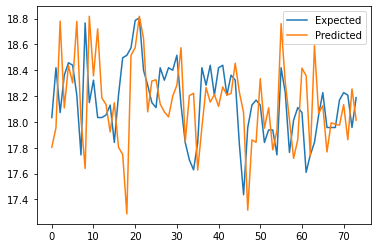

Shape of the array =  (246, 2)
>expected=18.0, predicted=18.0
>expected=18.4, predicted=18.0
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.3
>expected=18.5, predicted=18.1
>expected=18.4, predicted=18.6
>expected=18.2, predicted=18.7
>expected=17.7, predicted=18.3
>expected=18.8, predicted=17.7
>expected=18.1, predicted=17.9
>expected=18.3, predicted=18.2
>expected=18.0, predicted=18.2
>expected=18.0, predicted=18.2
>expected=18.1, predicted=18.2
>expected=18.1, predicted=17.9
>expected=17.8, predicted=18.1
>expected=18.2, predicted=18.3
>expected=18.5, predicted=18.1
>expected=18.5, predicted=17.8
>expected=18.6, predicted=18.1
>expected=18.8, predicted=18.6
>expected=18.8, predicted=18.7
>expected=18.4, predicted=18.6
>expected=18.3, predicted=18.3
>expected=18.1, predicted=18.4
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.2
>expected=18.3, predicted=18.0
>expected=18.4, predicted=18.5
>expected=18.4, predicted=18.6
>expected=18.5, predicted=18.4
>expecte

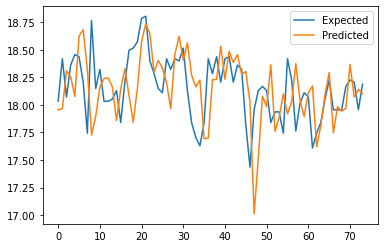

In [33]:
generate_all_news_result(ppb_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=18.0, predicted=17.8
>expected=18.4, predicted=18.0
>expected=18.1, predicted=18.8
>expected=18.4, predicted=18.1
>expected=18.5, predicted=18.4
>expected=18.4, predicted=18.3
>expected=18.2, predicted=18.8
>expected=17.7, predicted=18.0
>expected=18.8, predicted=17.6
>expected=18.1, predicted=18.8
>expected=18.3, predicted=18.4
>expected=18.0, predicted=18.7
>expected=18.0, predicted=18.2
>expected=18.1, predicted=18.1
>expected=18.1, predicted=17.9
>expected=17.8, predicted=18.1
>expected=18.2, predicted=17.8
>expected=18.5, predicted=17.7
>expected=18.5, predicted=17.3
>expected=18.6, predicted=18.5
>expected=18.8, predicted=18.6
>expected=18.8, predicted=18.8
>expected=18.4, predicted=18.6
>expected=18.3, predicted=18.1
>expected=18.1, predicted=18.3
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.1
>expected=18.3, predicted=18.1
>expected=18.4, predicted=18.0
>expected=18.4, predicted=18.2
>expected=18.5, predicted=18.3
>expecte

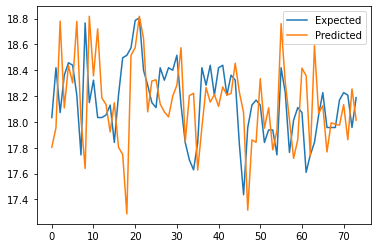

Shape of the array =  (246, 2)
>expected=18.0, predicted=18.0
>expected=18.4, predicted=17.8
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.1
>expected=18.5, predicted=18.1
>expected=18.4, predicted=18.5
>expected=18.2, predicted=18.3
>expected=17.7, predicted=18.3
>expected=18.8, predicted=17.7
>expected=18.1, predicted=18.1
>expected=18.3, predicted=17.9
>expected=18.0, predicted=18.4
>expected=18.0, predicted=18.1
>expected=18.1, predicted=18.0
>expected=18.1, predicted=18.0
>expected=17.8, predicted=18.1
>expected=18.2, predicted=18.3
>expected=18.5, predicted=17.9
>expected=18.5, predicted=18.1
>expected=18.6, predicted=18.3
>expected=18.8, predicted=18.0
>expected=18.8, predicted=18.7
>expected=18.4, predicted=18.6
>expected=18.3, predicted=18.0
>expected=18.1, predicted=18.2
>expected=18.1, predicted=18.3
>expected=18.4, predicted=18.3
>expected=18.3, predicted=18.3
>expected=18.4, predicted=18.5
>expected=18.4, predicted=18.3
>expected=18.5, predicted=18.4
>expecte

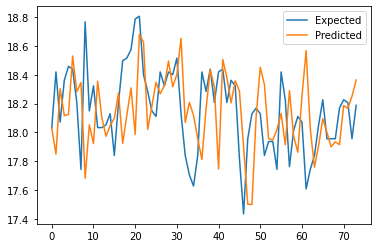

In [34]:
generate_covid_news_result(ppb_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.7
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.6
>expected=6.7, predicted=6.5
>expected=6.7, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.

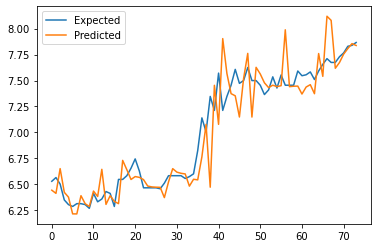

Shape of the array =  (246, 2)
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.6
>expected=6.4, predicted=6.5
>expected=6.3, predicted=6.5
>expected=6.3, predicted=6.6
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.5
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.3, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.6
>expected=6.7, predicted=6.5
>expected=6.7, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.7
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.7
>expected=6.

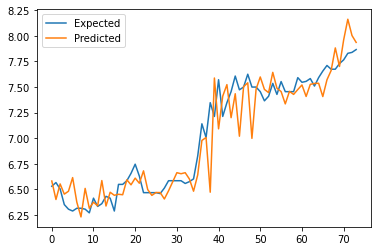

In [35]:
generate_all_news_result(hapseng_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.7
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.6
>expected=6.7, predicted=6.5
>expected=6.7, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.

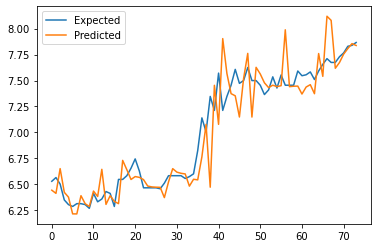

Shape of the array =  (246, 2)
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.5
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.5
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.3, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.6, predicted=6.8
>expected=6.7, predicted=6.6
>expected=6.7, predicted=6.6
>expected=6.6, predicted=6.8
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.9
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.

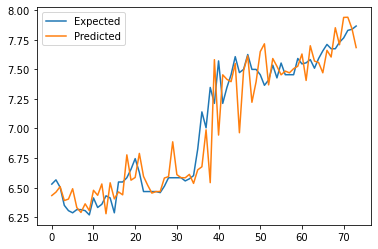

In [36]:
generate_covid_news_result(hapseng_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.2
>expected=6.5, predicted=6.4
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.4, predicted=6.1
>expected=6.2, predicted=6.4
>expected=6.1, predicted=6.1
>expected=6.

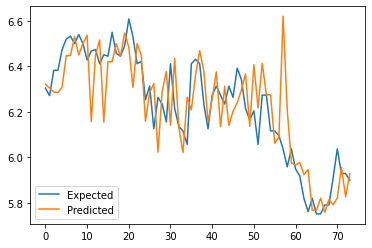

Shape of the array =  (246, 2)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.2
>expected=6.4, predicted=6.5
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.0
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.3, predicted=6.1
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.

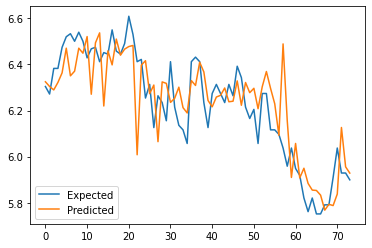

In [37]:
generate_all_news_result(ql_resource_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.2
>expected=6.5, predicted=6.4
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.6, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.4, predicted=6.1
>expected=6.2, predicted=6.4
>expected=6.1, predicted=6.1
>expected=6.

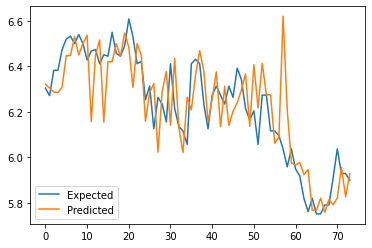

Shape of the array =  (246, 2)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.4, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.3
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.1
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.

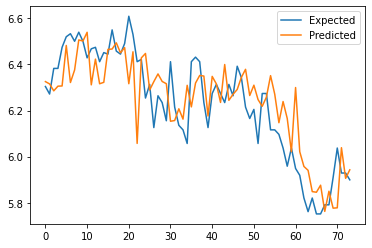

In [38]:
generate_covid_news_result(ql_resource_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=30.8, predicted=30.8
>expected=31.4, predicted=30.8
>expected=31.5, predicted=31.4
>expected=31.1, predicted=30.7
>expected=31.1, predicted=30.8
>expected=31.0, predicted=31.1
>expected=30.8, predicted=30.6
>expected=31.3, predicted=30.8
>expected=31.3, predicted=30.5
>expected=31.4, predicted=30.7
>expected=30.7, predicted=31.2
>expected=31.3, predicted=30.3
>expected=31.3, predicted=31.2
>expected=31.2, predicted=31.3
>expected=31.1, predicted=31.5
>expected=30.6, predicted=30.7
>expected=31.9, predicted=30.9
>expected=31.5, predicted=31.1
>expected=30.9, predicted=31.1
>expected=31.9, predicted=31.3
>expected=31.5, predicted=31.5
>expected=31.0, predicted=31.0
>expected=30.3, predicted=31.1
>expected=30.2, predicted=28.9
>expected=29.7, predicted=30.0
>expected=29.8, predicted=30.2
>expected=29.7, predicted=29.8
>expected=30.1, predicted=30.0
>expected=30.8, predicted=30.4
>expected=30.6, predicted=31.0
>expected=30.6, predicted=31.0
>expecte

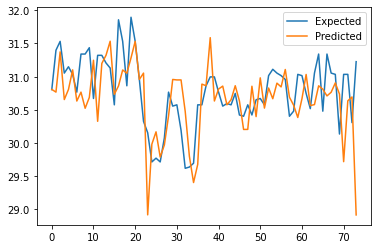

Shape of the array =  (246, 2)
>expected=30.8, predicted=30.7
>expected=31.4, predicted=30.7
>expected=31.5, predicted=31.3
>expected=31.1, predicted=31.3
>expected=31.1, predicted=30.9
>expected=31.0, predicted=30.9
>expected=30.8, predicted=30.9
>expected=31.3, predicted=31.2
>expected=31.3, predicted=30.9
>expected=31.4, predicted=29.9
>expected=30.7, predicted=31.6
>expected=31.3, predicted=30.2
>expected=31.3, predicted=31.1
>expected=31.2, predicted=31.4
>expected=31.1, predicted=31.4
>expected=30.6, predicted=30.7
>expected=31.9, predicted=31.0
>expected=31.5, predicted=31.4
>expected=30.9, predicted=31.0
>expected=31.9, predicted=31.3
>expected=31.5, predicted=31.7
>expected=31.0, predicted=30.9
>expected=30.3, predicted=31.3
>expected=30.2, predicted=31.2
>expected=29.7, predicted=30.3
>expected=29.8, predicted=30.1
>expected=29.7, predicted=29.6
>expected=30.1, predicted=29.9
>expected=30.8, predicted=30.4
>expected=30.6, predicted=30.9
>expected=30.6, predicted=30.9
>expecte

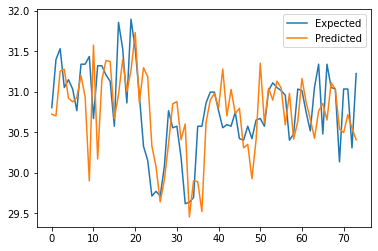

In [39]:
generate_all_news_result(fn_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=30.8, predicted=30.8
>expected=31.4, predicted=30.8
>expected=31.5, predicted=31.4
>expected=31.1, predicted=30.7
>expected=31.1, predicted=30.8
>expected=31.0, predicted=31.1
>expected=30.8, predicted=30.6
>expected=31.3, predicted=30.8
>expected=31.3, predicted=30.5
>expected=31.4, predicted=30.7
>expected=30.7, predicted=31.2
>expected=31.3, predicted=30.3
>expected=31.3, predicted=31.2
>expected=31.2, predicted=31.3
>expected=31.1, predicted=31.5
>expected=30.6, predicted=30.7
>expected=31.9, predicted=30.9
>expected=31.5, predicted=31.1
>expected=30.9, predicted=31.1
>expected=31.9, predicted=31.3
>expected=31.5, predicted=31.5
>expected=31.0, predicted=31.0
>expected=30.3, predicted=31.1
>expected=30.2, predicted=28.9
>expected=29.7, predicted=30.0
>expected=29.8, predicted=30.2
>expected=29.7, predicted=29.8
>expected=30.1, predicted=30.0
>expected=30.8, predicted=30.4
>expected=30.6, predicted=31.0
>expected=30.6, predicted=31.0
>expecte

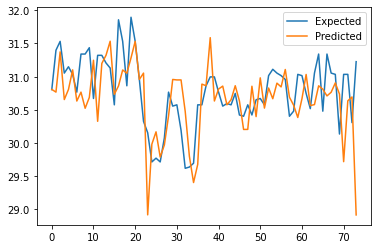

Shape of the array =  (246, 2)
>expected=30.8, predicted=30.6
>expected=31.4, predicted=30.8
>expected=31.5, predicted=31.2
>expected=31.1, predicted=31.3
>expected=31.1, predicted=31.2
>expected=31.0, predicted=31.2
>expected=30.8, predicted=31.0
>expected=31.3, predicted=30.9
>expected=31.3, predicted=30.4
>expected=31.4, predicted=30.3
>expected=30.7, predicted=31.6
>expected=31.3, predicted=30.9
>expected=31.3, predicted=31.0
>expected=31.2, predicted=31.2
>expected=31.1, predicted=31.3
>expected=30.6, predicted=30.8
>expected=31.9, predicted=30.9
>expected=31.5, predicted=30.1
>expected=30.9, predicted=31.0
>expected=31.9, predicted=31.2
>expected=31.5, predicted=31.5
>expected=31.0, predicted=29.9
>expected=30.3, predicted=31.1
>expected=30.2, predicted=30.7
>expected=29.7, predicted=30.4
>expected=29.8, predicted=30.3
>expected=29.7, predicted=29.7
>expected=30.1, predicted=30.0
>expected=30.8, predicted=30.2
>expected=30.6, predicted=30.9
>expected=30.6, predicted=30.9
>expecte

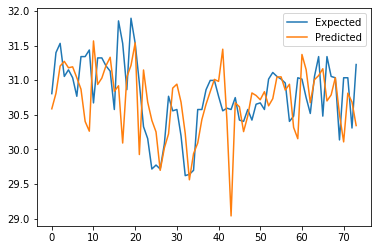

In [40]:
generate_covid_news_result(fn_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.

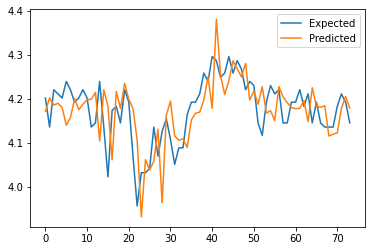

Shape of the array =  (246, 2)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.

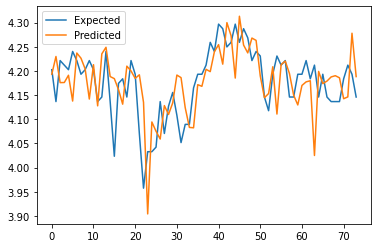

In [41]:
generate_all_news_result(ioi_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.

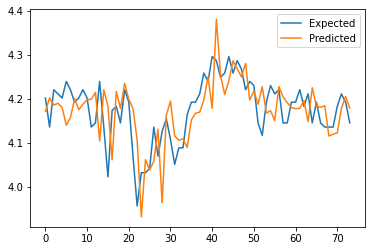

Shape of the array =  (246, 2)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.2
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.0
>expected=4.

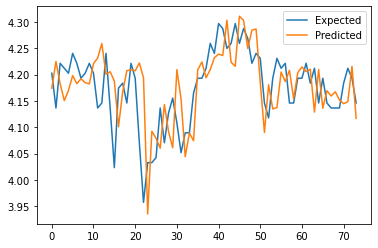

In [42]:
generate_covid_news_result(ioi_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.4, predicted=4.4
>expected=4.6, predicted=4.5
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.5
>expected=4.7, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.4, predicted=4.5
>expected=4.5, predicted=4.2
>expected=4.

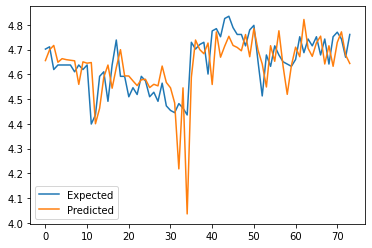

Shape of the array =  (246, 2)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.7
>expected=4.4, predicted=4.6
>expected=4.6, predicted=4.4
>expected=4.6, predicted=4.4
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.5
>expected=4.7, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.6, predicted=4.5
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.5, predicted=4.5
>expected=4.5, predicted=4.5
>expected=4.6, predicted=4.4
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.4, predicted=4.4
>expected=4.5, predicted=4.5
>expected=4.

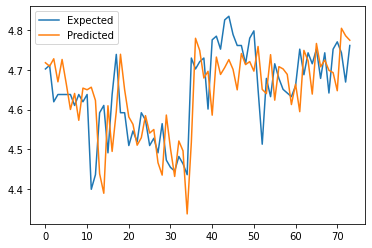

In [43]:
generate_all_news_result(sime_darby_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.4, predicted=4.4
>expected=4.6, predicted=4.5
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.5
>expected=4.7, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.4, predicted=4.5
>expected=4.5, predicted=4.2
>expected=4.

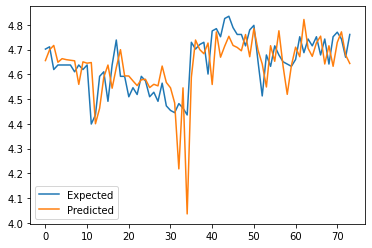

Shape of the array =  (246, 2)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.4, predicted=4.5
>expected=4.6, predicted=4.4
>expected=4.6, predicted=4.4
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.5
>expected=4.7, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.6, predicted=4.5
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.5
>expected=4.6, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.4, predicted=4.5
>expected=4.5, predicted=4.4
>expected=4.

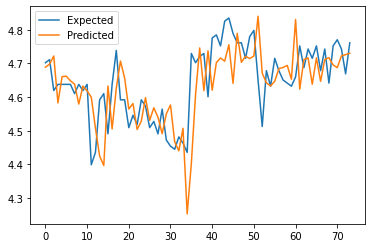

In [44]:
generate_covid_news_result(sime_darby_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.0, predicted=9.2
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.5, predicted=9.1
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=8.8, predicted=9.1
>expected=9.

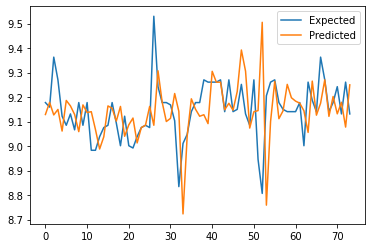

Shape of the array =  (246, 2)
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.2
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.3
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.2
>expected=9.0, predicted=9.2
>expected=9.1, predicted=8.9
>expected=9.1, predicted=9.3
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.0, predicted=9.2
>expected=9.1, predicted=8.9
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.5, predicted=9.0
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.4
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.4
>expected=8.8, predicted=9.2
>expected=9.

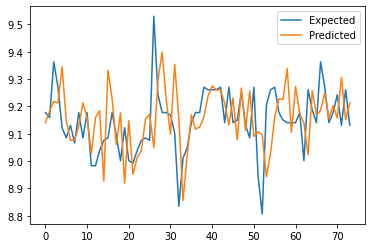

In [45]:
generate_all_news_result(genting_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.0, predicted=9.2
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.5, predicted=9.1
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=8.8, predicted=9.1
>expected=9.

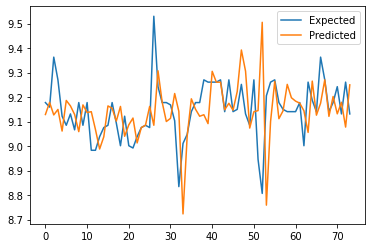

Shape of the array =  (246, 2)
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.3
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.0
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.3
>expected=9.0, predicted=9.1
>expected=9.1, predicted=9.0
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.2
>expected=9.1, predicted=8.9
>expected=9.0, predicted=9.2
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.5, predicted=9.0
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.4
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.3
>expected=8.8, predicted=9.1
>expected=9.

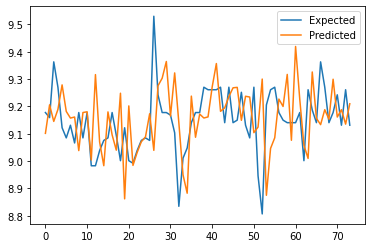

In [46]:
generate_covid_news_result(genting_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.4
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.

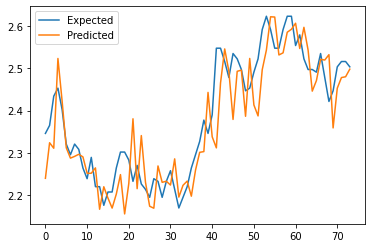

Shape of the array =  (246, 2)
>expected=2.3, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.3, predicted=2.4
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.1
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.1
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.

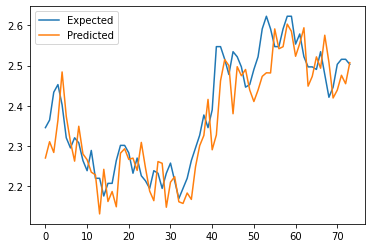

In [47]:
generate_all_news_result(sarawak_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.4
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.

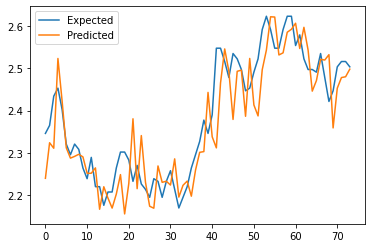

Shape of the array =  (246, 2)
>expected=2.3, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.3, predicted=2.4
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.

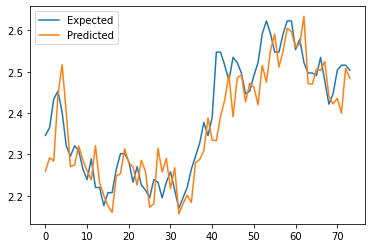

In [48]:
generate_covid_news_result(sarawak_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

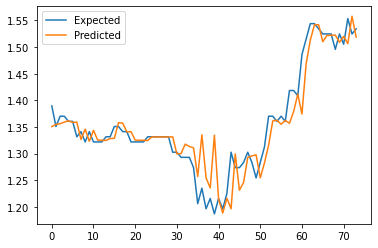

Shape of the array =  (246, 2)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

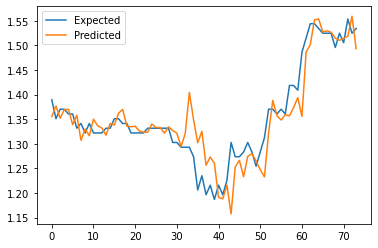

In [49]:
generate_all_news_result(sunway_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

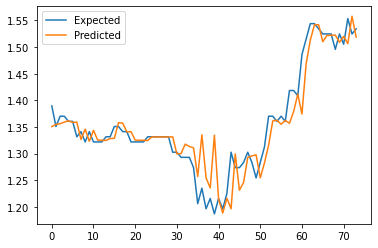

Shape of the array =  (246, 2)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

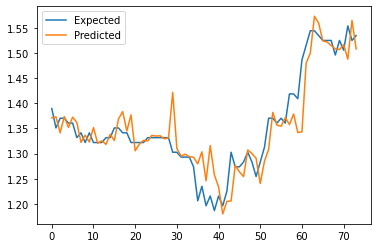

In [50]:
generate_covid_news_result(sunway_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.

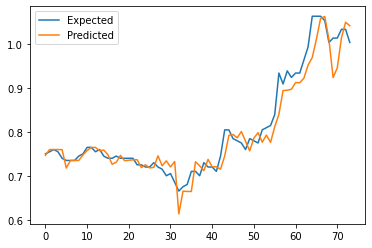

Shape of the array =  (246, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.

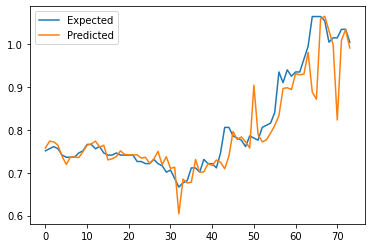

In [51]:
generate_all_news_result(sp_setia_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.

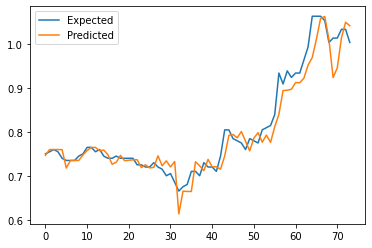

Shape of the array =  (246, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.

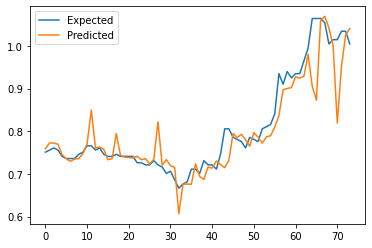

In [52]:
generate_covid_news_result(sp_setia_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

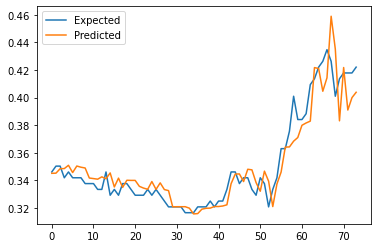

Shape of the array =  (246, 2)
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

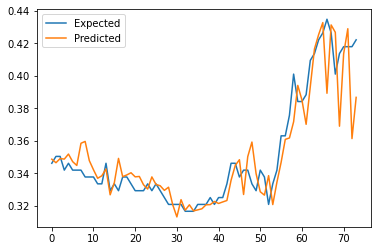

In [53]:
generate_all_news_result(ecoworld_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

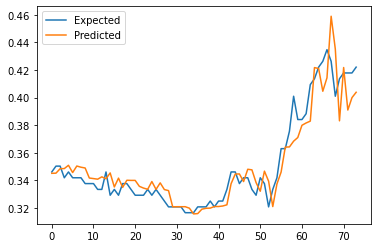

Shape of the array =  (246, 2)
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

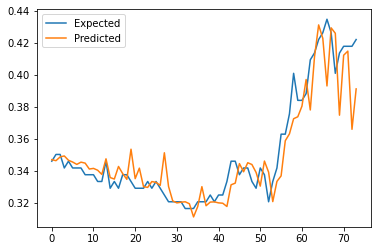

In [54]:
generate_covid_news_result(ecoworld_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.

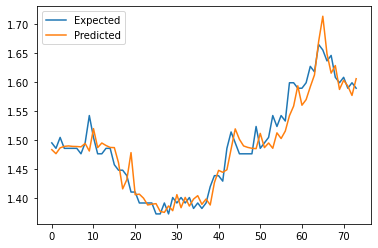

Shape of the array =  (246, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.

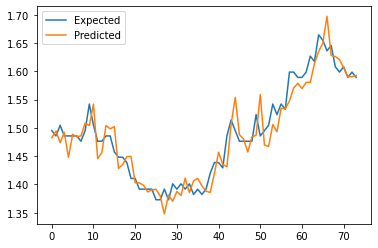

In [55]:
generate_all_news_result(uoa_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.

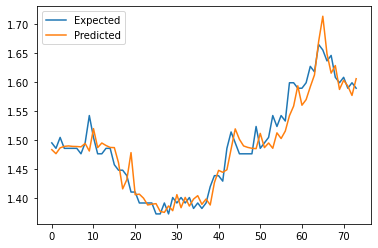

Shape of the array =  (246, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.

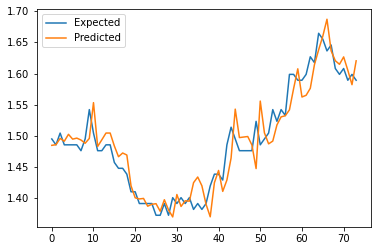

In [56]:
generate_covid_news_result(uoa_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=7.1
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.1
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=7.0, predicted=6.9
>expected=6.8, predicted=7.0
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=6.

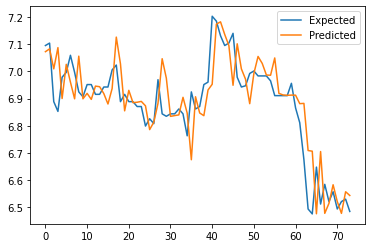

Shape of the array =  (246, 2)
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.1
>expected=6.9, predicted=7.1
>expected=7.0, predicted=7.0
>expected=7.0, predicted=7.2
>expected=7.1, predicted=7.0
>expected=7.0, predicted=7.0
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.0
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.8, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.9
>expected=6.

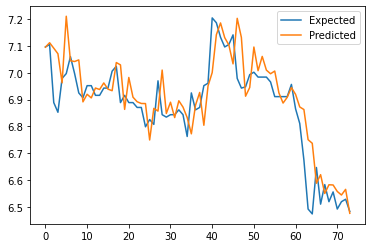

In [57]:
generate_all_news_result(klcc_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=7.1
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.1
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=7.0, predicted=6.9
>expected=6.8, predicted=7.0
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=6.

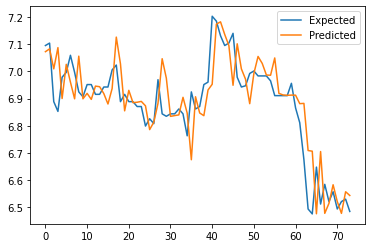

Shape of the array =  (246, 2)
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.1
>expected=6.9, predicted=7.1
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.2
>expected=7.1, predicted=7.0
>expected=7.0, predicted=7.0
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=6.

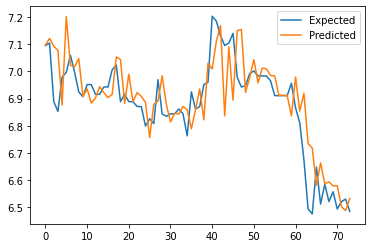

In [58]:
generate_covid_news_result(klcc_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.

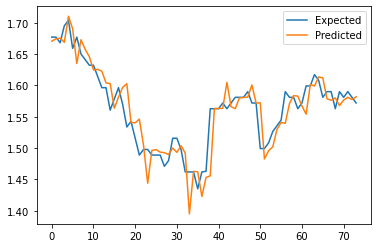

Shape of the array =  (246, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.

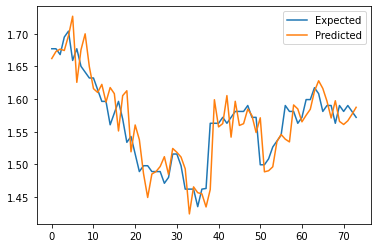

In [59]:
generate_all_news_result(igb_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.

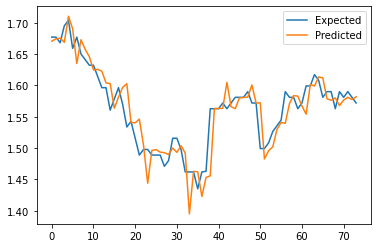

Shape of the array =  (246, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.

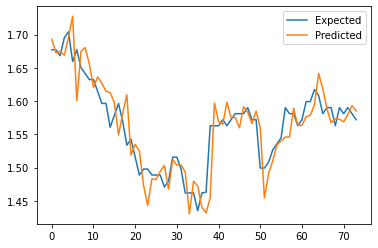

In [60]:
generate_covid_news_result(igb_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

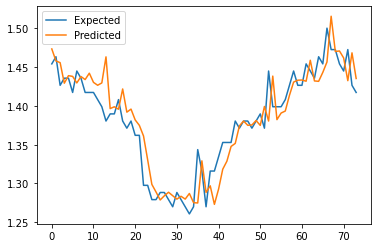

Shape of the array =  (246, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

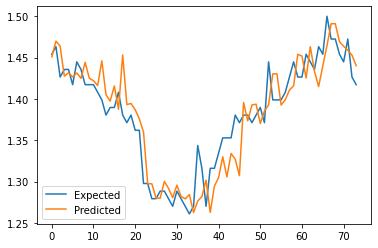

In [61]:
generate_all_news_result(pavilion_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

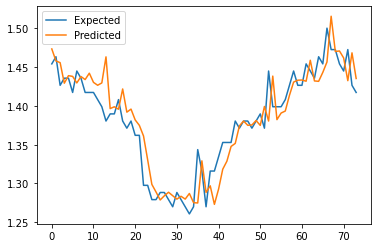

Shape of the array =  (246, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.

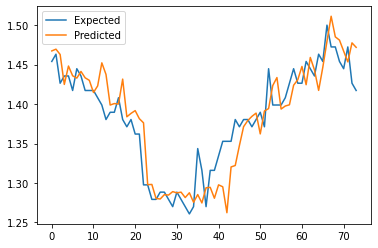

In [62]:
generate_covid_news_result(pavilion_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.

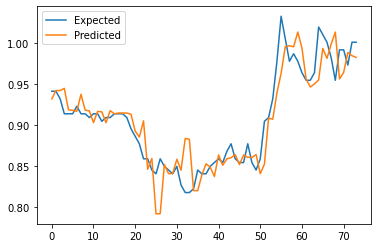

Shape of the array =  (246, 2)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.

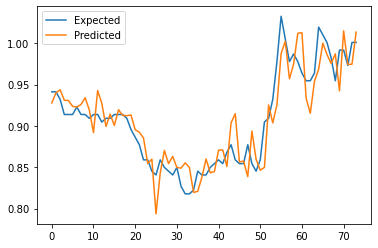

In [63]:
generate_all_news_result(kerjaya_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.

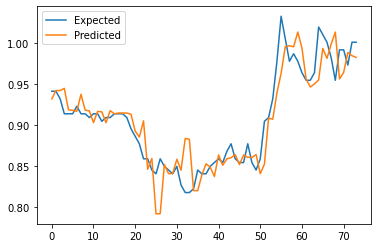

Shape of the array =  (246, 2)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.

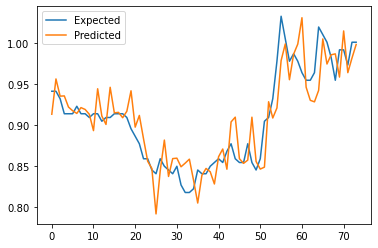

In [64]:
generate_covid_news_result(kerjaya_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.

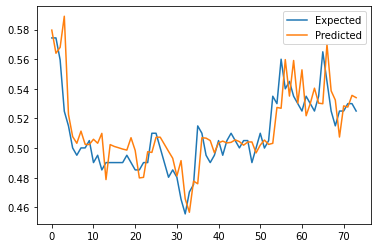

Shape of the array =  (246, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.

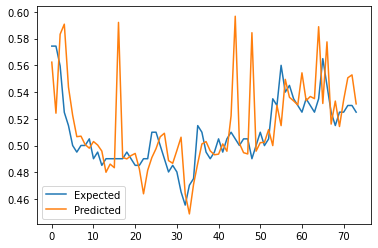

In [65]:
generate_all_news_result(ekovest_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.

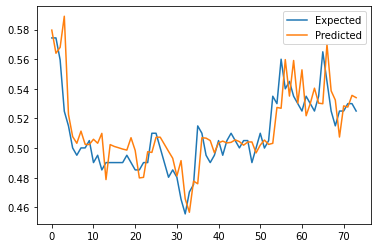

Shape of the array =  (246, 2)
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.

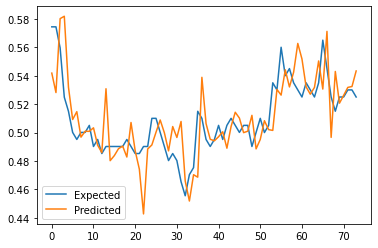

In [66]:
generate_covid_news_result(ekovest_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

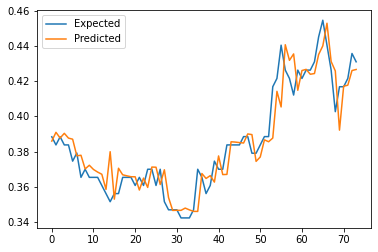

Shape of the array =  (246, 2)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.

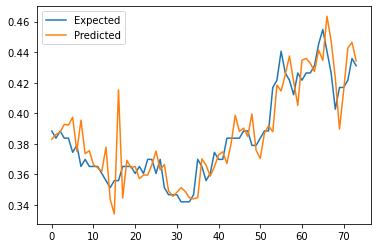

In [67]:
generate_all_news_result(gadang_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

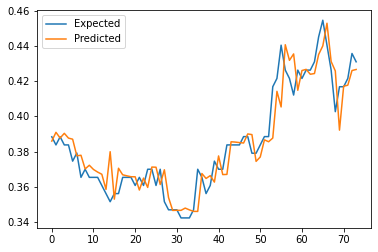

Shape of the array =  (246, 2)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.

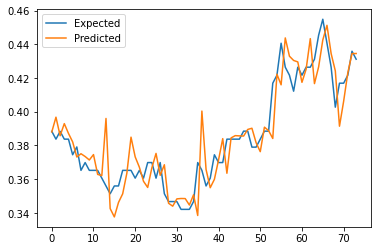

In [68]:
generate_covid_news_result(gadang_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.

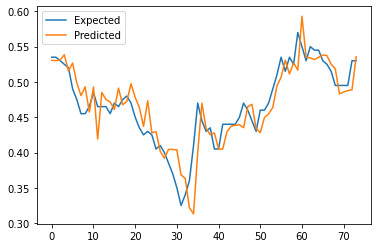

Shape of the array =  (246, 2)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.

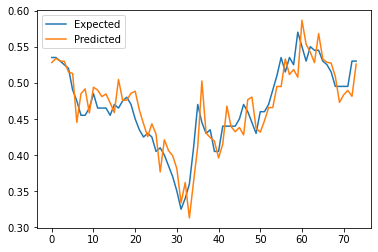

In [69]:
generate_all_news_result(econpile_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.

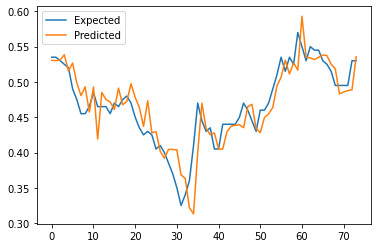

Shape of the array =  (246, 2)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.

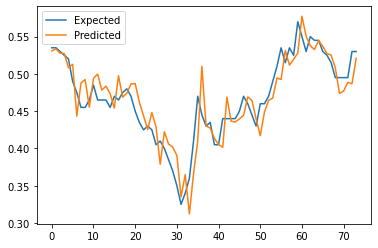

In [70]:
generate_covid_news_result(econpile_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.0, predicted=2.1
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.

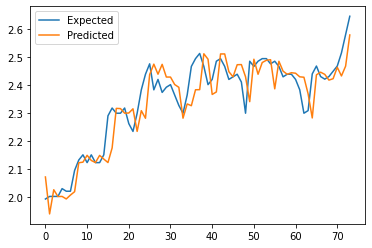

Shape of the array =  (246, 2)
>expected=2.0, predicted=2.1
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.2
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.

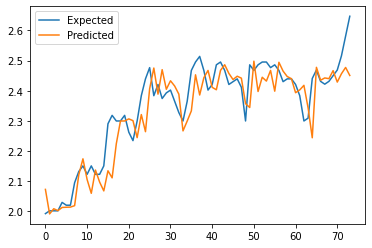

In [71]:
generate_all_news_result(inari_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.0, predicted=2.1
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.

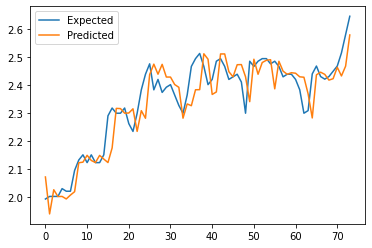

Shape of the array =  (246, 2)
>expected=2.0, predicted=2.1
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.0
>expected=2.1, predicted=2.2
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.1
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.3, predicted=2.2
>expected=2.4, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.

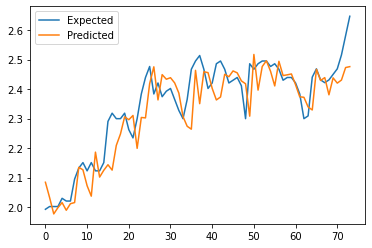

In [72]:
generate_covid_news_result(inari_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.

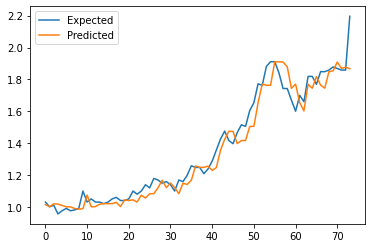

Shape of the array =  (246, 2)
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.2
>expected=1.

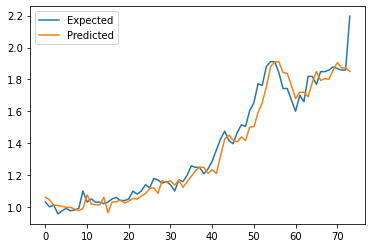

In [73]:
generate_all_news_result(greentech_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.

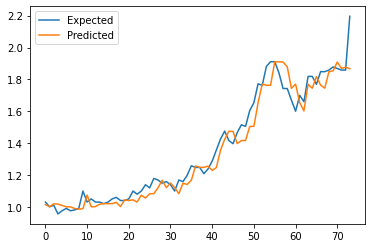

Shape of the array =  (246, 2)
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.2
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.

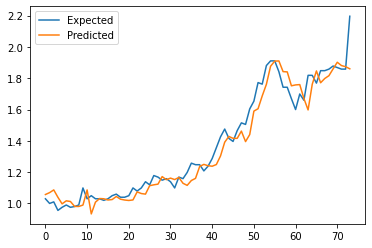

In [74]:
generate_covid_news_result(greentech_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.

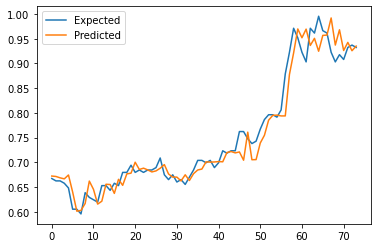

Shape of the array =  (246, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.

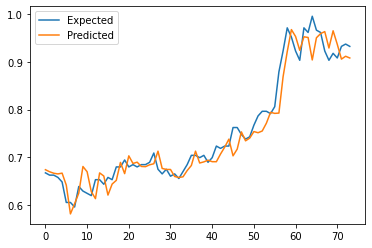

In [75]:
generate_all_news_result(myeg_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.

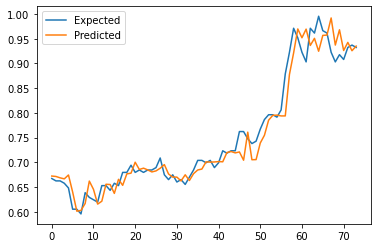

Shape of the array =  (246, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.

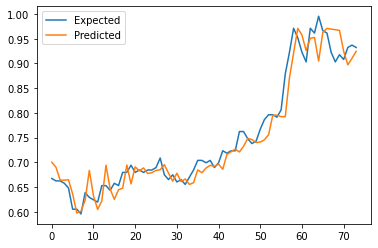

In [76]:
generate_covid_news_result(myeg_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.6
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.0, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.7, predicted=6.2
>expected=6.8, predicted=6.2
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=7.0, predicted=6.9
>expected=7.2, predicted=7.0
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.0, predicted=7.2
>expected=6.9, predicted=7.2
>expected=7.

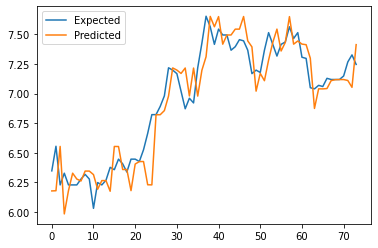

Shape of the array =  (246, 2)
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.5
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.0, predicted=6.4
>expected=6.2, predicted=6.1
>expected=6.2, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.7, predicted=6.2
>expected=6.8, predicted=6.3
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=7.0, predicted=6.9
>expected=7.2, predicted=6.9
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.0, predicted=7.2
>expected=6.9, predicted=7.2
>expected=7.

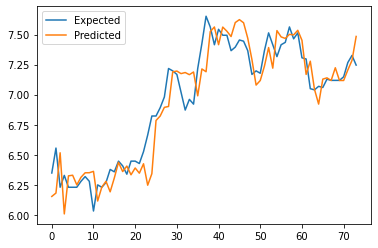

In [77]:
generate_all_news_result(vitrox_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.6
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.0, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.6
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.7, predicted=6.2
>expected=6.8, predicted=6.2
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=7.0, predicted=6.9
>expected=7.2, predicted=7.0
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.0, predicted=7.2
>expected=6.9, predicted=7.2
>expected=7.

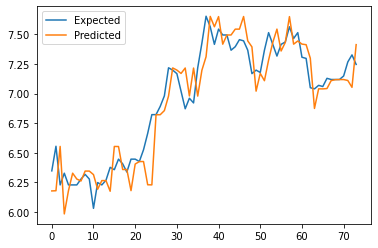

Shape of the array =  (246, 2)
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.5
>expected=6.3, predicted=6.1
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.0, predicted=6.3
>expected=6.2, predicted=5.9
>expected=6.2, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.2
>expected=6.4, predicted=6.4
>expected=6.4, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.7, predicted=6.3
>expected=6.8, predicted=6.4
>expected=6.8, predicted=6.8
>expected=6.9, predicted=6.8
>expected=7.0, predicted=6.9
>expected=7.2, predicted=6.9
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.0, predicted=7.2
>expected=6.9, predicted=7.0
>expected=7.

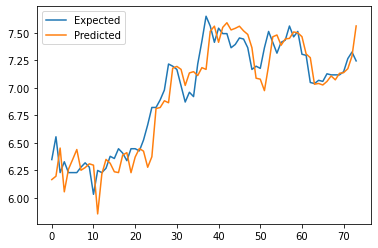

In [78]:
generate_covid_news_result(vitrox_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.4, predicted=2.1
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.5, predicted=2.5
>expected=2.6, predicted=2.5
>expected=2.

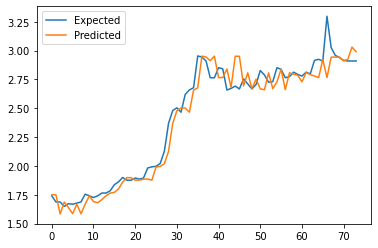

Shape of the array =  (246, 2)
>expected=1.7, predicted=1.8
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.7
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.4, predicted=2.1
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.5, predicted=2.5
>expected=2.6, predicted=2.5
>expected=2.

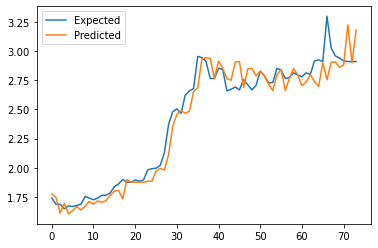

In [79]:
generate_all_news_result(unisem_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.4, predicted=2.1
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.5, predicted=2.5
>expected=2.6, predicted=2.5
>expected=2.

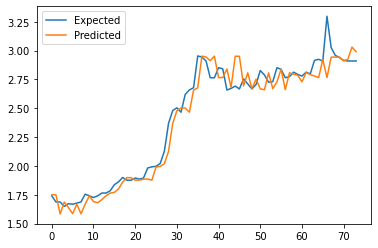

Shape of the array =  (246, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.4, predicted=2.1
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.5, predicted=2.5
>expected=2.6, predicted=2.5
>expected=2.

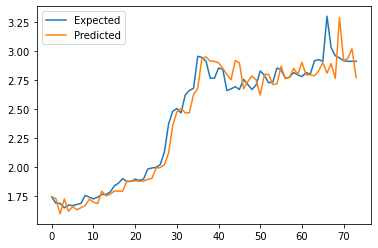

In [80]:
generate_covid_news_result(unisem_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.

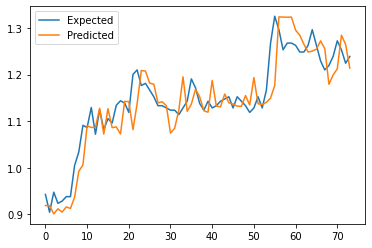

Shape of the array =  (246, 2)
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.

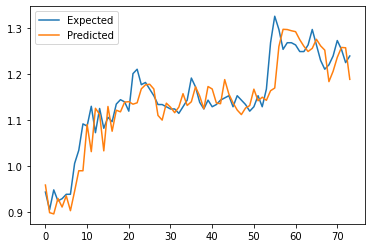

In [81]:
generate_all_news_result(vs_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.

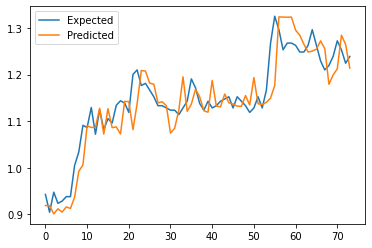

Shape of the array =  (246, 2)
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.1
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.

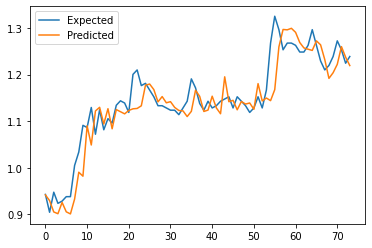

In [82]:
generate_covid_news_result(vs_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.

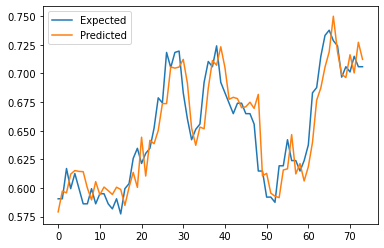

Shape of the array =  (246, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.

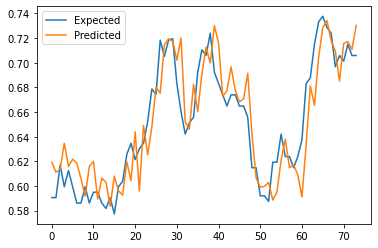

In [83]:
generate_all_news_result(ytl_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.

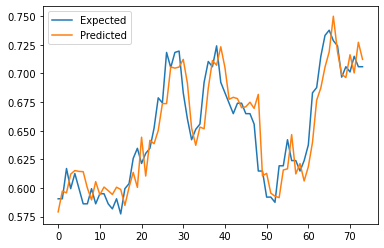

Shape of the array =  (246, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.

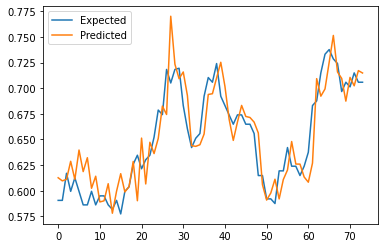

In [84]:
generate_covid_news_result(ytl_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=9.7, predicted=10.2
>expected=9.8, predicted=9.8
>expected=9.6, predicted=9.9
>expected=9.6, predicted=10.2
>expected=9.7, predicted=9.6
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.5
>expected=9.6, predicted=10.2
>expected=9.6, predicted=9.5
>expected=9.5, predicted=9.6
>expected=9.4, predicted=9.7
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.3
>expected=9.5, predicted=9.3
>expected=9.2, predicted=9.7
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.3
>expected=9.2, predicted=9.5
>expected=9.2, predicted=9.3
>expected=9.1, predicted=9.2
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.1
>expected=8.9, predicted=9.0
>expected=8.8, predicted=8.9
>expected=8.6, predicted=8.8
>expected=8.7, predicted=8.6
>expected

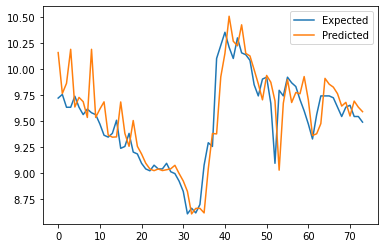

Shape of the array =  (246, 2)
>expected=9.7, predicted=9.9
>expected=9.8, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=10.1
>expected=9.7, predicted=9.9
>expected=9.6, predicted=9.8
>expected=9.6, predicted=9.8
>expected=9.6, predicted=9.6
>expected=9.6, predicted=9.9
>expected=9.6, predicted=9.7
>expected=9.5, predicted=9.7
>expected=9.4, predicted=9.6
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.4
>expected=9.5, predicted=9.3
>expected=9.2, predicted=9.6
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.4
>expected=9.2, predicted=9.4
>expected=9.2, predicted=9.4
>expected=9.1, predicted=9.3
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=8.9, predicted=9.1
>expected=8.8, predicted=9.0
>expected=8.6, predicted=8.8
>expected=8.7, predicted=8.6
>expected=8

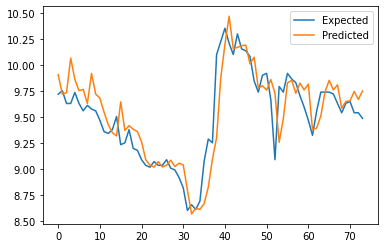

In [85]:
generate_all_news_result(tenaga_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=9.7, predicted=10.2
>expected=9.8, predicted=9.8
>expected=9.6, predicted=9.9
>expected=9.6, predicted=10.2
>expected=9.7, predicted=9.6
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.5
>expected=9.6, predicted=10.2
>expected=9.6, predicted=9.5
>expected=9.5, predicted=9.6
>expected=9.4, predicted=9.7
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.3
>expected=9.5, predicted=9.3
>expected=9.2, predicted=9.7
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.3
>expected=9.2, predicted=9.5
>expected=9.2, predicted=9.3
>expected=9.1, predicted=9.2
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.0
>expected=9.0, predicted=9.1
>expected=8.9, predicted=9.0
>expected=8.8, predicted=8.9
>expected=8.6, predicted=8.8
>expected=8.7, predicted=8.6
>expected

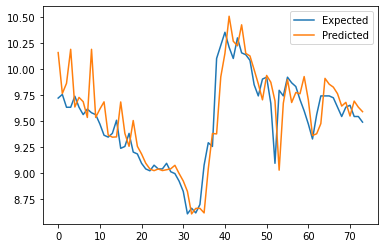

Shape of the array =  (246, 2)
>expected=9.7, predicted=9.9
>expected=9.8, predicted=9.8
>expected=9.6, predicted=9.7
>expected=9.6, predicted=10.0
>expected=9.7, predicted=9.8
>expected=9.6, predicted=9.8
>expected=9.6, predicted=9.8
>expected=9.6, predicted=9.7
>expected=9.6, predicted=10.1
>expected=9.6, predicted=9.7
>expected=9.5, predicted=9.7
>expected=9.4, predicted=9.6
>expected=9.3, predicted=9.4
>expected=9.4, predicted=9.3
>expected=9.5, predicted=9.4
>expected=9.2, predicted=9.5
>expected=9.3, predicted=9.3
>expected=9.4, predicted=9.4
>expected=9.2, predicted=9.4
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=9.1, predicted=9.0
>expected=9.0, predicted=9.1
>expected=9.0, predicted=9.0
>expected=8.9, predicted=9.5
>expected=8.8, predicted=8.9
>expected=8.6, predicted=8.8
>expected=8.7, predicted=8.6
>expected=

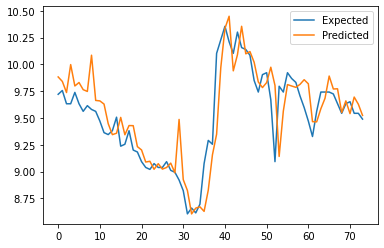

In [86]:
generate_covid_news_result(tenaga_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

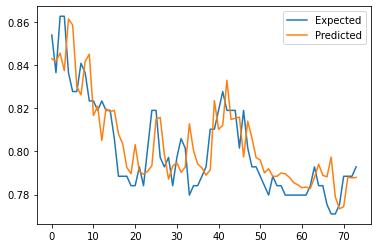

Shape of the array =  (246, 2)
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

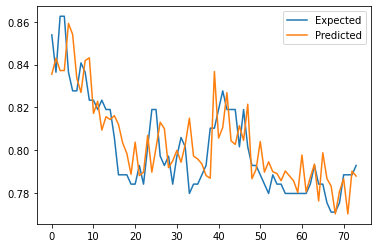

In [87]:
generate_all_news_result(malakoff_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

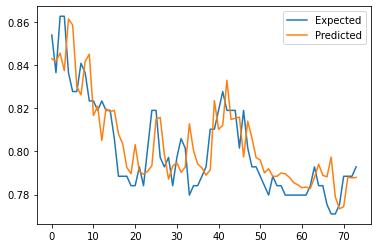

Shape of the array =  (246, 2)
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

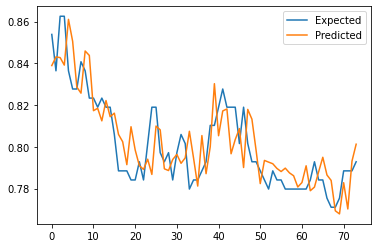

In [88]:
generate_covid_news_result(malakoff_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=5.0, predicted=5.3
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.1
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=5.1
>expected=5.1, predicted=5.1
>expected=4.9, predicted=5.0
>expected=4.8, predicted=4.9
>expected=4.8, predicted=5.0
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.8
>expected=4.7, predicted=5.0
>expected=4.6, predicted=4.4
>expected=4.6, predicted=4.0
>expected=4.4, predicted=4.6
>expected=4.6, predicted=4.3
>expected=4.4, predicted=4.6
>expected=4.3, predicted=4.6
>expected=4.2, predicted=4.8
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.7
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.4
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.3, predicted=4.4
>expected=4.2, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.5, predicted=4.2
>expected=4.2, predicted=4.0
>expected=4.2, predicted=4.3
>expected=4.

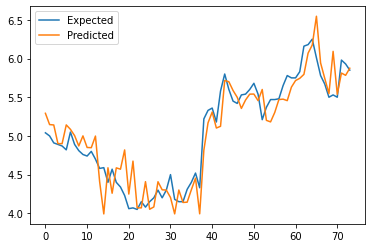

Shape of the array =  (246, 2)
>expected=5.0, predicted=5.2
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.2
>expected=4.9, predicted=4.9
>expected=4.9, predicted=5.0
>expected=4.8, predicted=4.9
>expected=5.1, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.8, predicted=5.0
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.7
>expected=4.7, predicted=5.0
>expected=4.6, predicted=4.4
>expected=4.6, predicted=4.2
>expected=4.4, predicted=4.5
>expected=4.6, predicted=4.2
>expected=4.4, predicted=4.5
>expected=4.3, predicted=4.6
>expected=4.2, predicted=4.8
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.5
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.3, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.5, predicted=4.3
>expected=4.2, predicted=4.4
>expected=4.2, predicted=4.5
>expected=4.

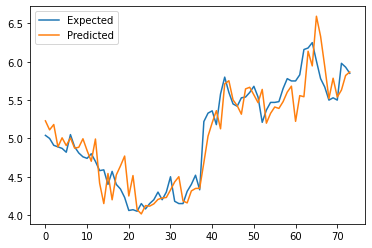

In [89]:
generate_all_news_result(my_airport_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=5.0, predicted=5.3
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.1
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=5.1
>expected=5.1, predicted=5.1
>expected=4.9, predicted=5.0
>expected=4.8, predicted=4.9
>expected=4.8, predicted=5.0
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.8
>expected=4.7, predicted=5.0
>expected=4.6, predicted=4.4
>expected=4.6, predicted=4.0
>expected=4.4, predicted=4.6
>expected=4.6, predicted=4.3
>expected=4.4, predicted=4.6
>expected=4.3, predicted=4.6
>expected=4.2, predicted=4.8
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.7
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.4
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.3, predicted=4.4
>expected=4.2, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.5, predicted=4.2
>expected=4.2, predicted=4.0
>expected=4.2, predicted=4.3
>expected=4.

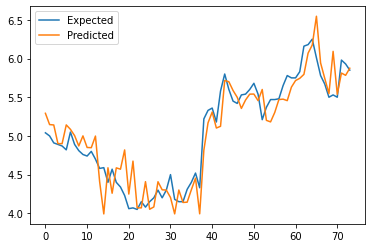

Shape of the array =  (246, 2)
>expected=5.0, predicted=5.3
>expected=5.0, predicted=5.2
>expected=4.9, predicted=5.1
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.8
>expected=4.8, predicted=5.0
>expected=5.1, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.8
>expected=4.8, predicted=5.0
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.7, predicted=5.0
>expected=4.6, predicted=4.5
>expected=4.6, predicted=4.2
>expected=4.4, predicted=4.7
>expected=4.6, predicted=4.2
>expected=4.4, predicted=4.6
>expected=4.3, predicted=4.6
>expected=4.2, predicted=4.9
>expected=4.1, predicted=4.3
>expected=4.1, predicted=4.5
>expected=4.1, predicted=4.3
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.3, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.3, predicted=5.0
>expected=4.5, predicted=4.2
>expected=4.2, predicted=4.5
>expected=4.2, predicted=4.5
>expected=4.

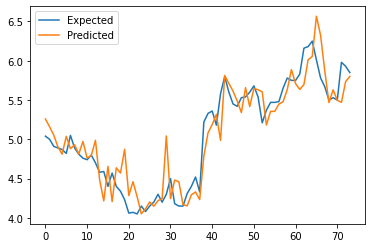

In [90]:
generate_covid_news_result(my_airport_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.4
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

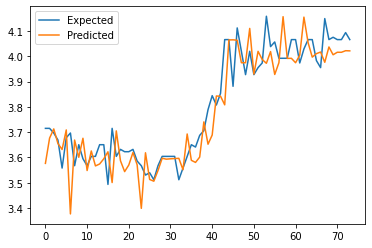

Shape of the array =  (246, 2)
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.7
>expected=3.

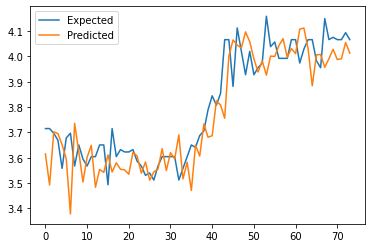

In [91]:
generate_all_news_result(westport_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.4
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

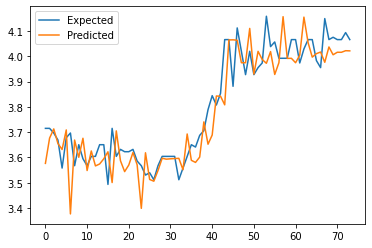

Shape of the array =  (246, 2)
>expected=3.7, predicted=3.5
>expected=3.7, predicted=3.5
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.4
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

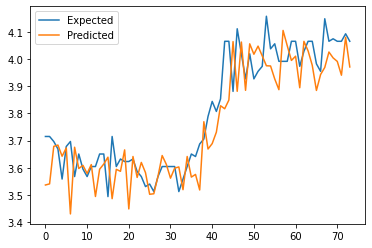

In [92]:
generate_covid_news_result(westport_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.0, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
>expected=6.8, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.4, predicted=6.5
>expected=6.2, predicted=6.4
>expected=6.2, predicted=6.6
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.2
>expected=6.2, predicted=6.4
>expected=6.0, predicted=6.6
>expected=5.9, predicted=6.0
>expected=5.9, predicted=6.2
>expected=5.9, predicted=5.9
>expected=5.8, predicted=6.2
>expected=5.8, predicted=5.8
>expected=6.0, predicted=5.8
>expected=6.3, predicted=5.9
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=5.9, predicted=6.1
>expected=5.9, predicted=5.9
>expected=5.

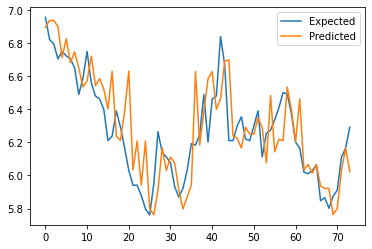

Shape of the array =  (246, 2)
>expected=7.0, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.7, predicted=6.6
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.8
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.5
>expected=6.8, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.6
>expected=6.5, predicted=5.9
>expected=6.4, predicted=6.5
>expected=6.2, predicted=6.6
>expected=6.2, predicted=6.5
>expected=6.4, predicted=6.5
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.4
>expected=6.0, predicted=6.3
>expected=5.9, predicted=6.3
>expected=5.9, predicted=6.0
>expected=5.9, predicted=6.3
>expected=5.8, predicted=6.0
>expected=5.8, predicted=6.1
>expected=6.0, predicted=5.8
>expected=6.3, predicted=6.0
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.9
>expected=5.

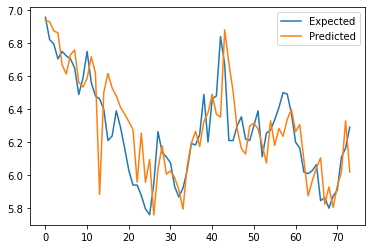

In [93]:
generate_all_news_result(misc_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.0, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
>expected=6.8, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.4, predicted=6.5
>expected=6.2, predicted=6.4
>expected=6.2, predicted=6.6
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.2
>expected=6.2, predicted=6.4
>expected=6.0, predicted=6.6
>expected=5.9, predicted=6.0
>expected=5.9, predicted=6.2
>expected=5.9, predicted=5.9
>expected=5.8, predicted=6.2
>expected=5.8, predicted=5.8
>expected=6.0, predicted=5.8
>expected=6.3, predicted=5.9
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=5.9, predicted=6.1
>expected=5.9, predicted=5.9
>expected=5.

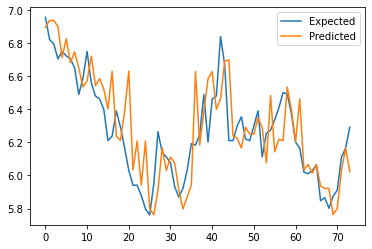

Shape of the array =  (246, 2)
>expected=7.0, predicted=6.8
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.5
>expected=6.8, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.6
>expected=6.5, predicted=5.9
>expected=6.4, predicted=6.6
>expected=6.2, predicted=6.5
>expected=6.2, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.3
>expected=6.0, predicted=6.3
>expected=5.9, predicted=6.3
>expected=5.9, predicted=6.2
>expected=5.9, predicted=6.4
>expected=5.8, predicted=5.9
>expected=5.8, predicted=6.1
>expected=6.0, predicted=5.8
>expected=6.3, predicted=6.1
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=5.9, predicted=6.1
>expected=5.9, predicted=5.9
>expected=5.

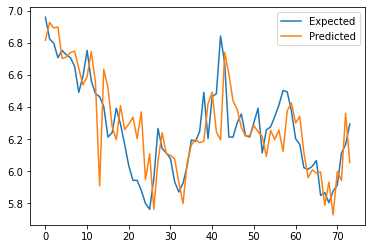

In [94]:
generate_covid_news_result(misc_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=19.3, predicted=19.1
>expected=19.0, predicted=19.0
>expected=19.8, predicted=19.1
>expected=19.1, predicted=19.9
>expected=19.2, predicted=19.3
>expected=18.9, predicted=19.1
>expected=18.8, predicted=18.9
>expected=18.5, predicted=18.6
>expected=18.6, predicted=18.0
>expected=18.3, predicted=18.7
>expected=18.5, predicted=18.7
>expected=18.5, predicted=18.6
>expected=18.5, predicted=18.5
>expected=18.9, predicted=18.0
>expected=18.7, predicted=19.6
>expected=17.9, predicted=18.6
>expected=18.4, predicted=18.1
>expected=18.1, predicted=18.9
>expected=18.3, predicted=18.6
>expected=18.7, predicted=18.5
>expected=18.6, predicted=17.9
>expected=18.6, predicted=18.7
>expected=17.8, predicted=18.0
>expected=17.7, predicted=18.6
>expected=16.8, predicted=18.6
>expected=16.7, predicted=17.7
>expected=17.0, predicted=16.7
>expected=16.4, predicted=16.7
>expected=16.0, predicted=17.0
>expected=16.2, predicted=16.0
>expected=16.2, predicted=16.2
>expecte

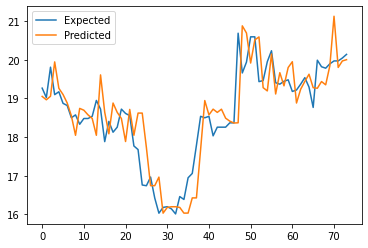

Shape of the array =  (246, 2)
>expected=19.3, predicted=19.0
>expected=19.0, predicted=19.5
>expected=19.8, predicted=20.0
>expected=19.1, predicted=19.4
>expected=19.2, predicted=19.3
>expected=18.9, predicted=19.0
>expected=18.8, predicted=19.5
>expected=18.5, predicted=19.0
>expected=18.6, predicted=18.5
>expected=18.3, predicted=17.8
>expected=18.5, predicted=18.3
>expected=18.5, predicted=18.6
>expected=18.5, predicted=18.3
>expected=18.9, predicted=18.2
>expected=18.7, predicted=18.6
>expected=17.9, predicted=19.1
>expected=18.4, predicted=18.2
>expected=18.1, predicted=18.6
>expected=18.3, predicted=18.6
>expected=18.7, predicted=18.5
>expected=18.6, predicted=18.6
>expected=18.6, predicted=18.1
>expected=17.8, predicted=17.9
>expected=17.7, predicted=18.2
>expected=16.8, predicted=18.5
>expected=16.7, predicted=17.3
>expected=17.0, predicted=17.2
>expected=16.4, predicted=16.9
>expected=16.0, predicted=16.9
>expected=16.2, predicted=16.8
>expected=16.2, predicted=16.2
>expecte

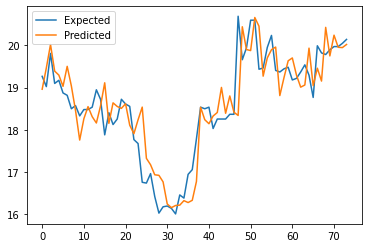

In [95]:
generate_all_news_result(petronas_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=19.3, predicted=19.1
>expected=19.0, predicted=19.0
>expected=19.8, predicted=19.1
>expected=19.1, predicted=19.9
>expected=19.2, predicted=19.3
>expected=18.9, predicted=19.1
>expected=18.8, predicted=18.9
>expected=18.5, predicted=18.6
>expected=18.6, predicted=18.0
>expected=18.3, predicted=18.7
>expected=18.5, predicted=18.7
>expected=18.5, predicted=18.6
>expected=18.5, predicted=18.5
>expected=18.9, predicted=18.0
>expected=18.7, predicted=19.6
>expected=17.9, predicted=18.6
>expected=18.4, predicted=18.1
>expected=18.1, predicted=18.9
>expected=18.3, predicted=18.6
>expected=18.7, predicted=18.5
>expected=18.6, predicted=17.9
>expected=18.6, predicted=18.7
>expected=17.8, predicted=18.0
>expected=17.7, predicted=18.6
>expected=16.8, predicted=18.6
>expected=16.7, predicted=17.7
>expected=17.0, predicted=16.7
>expected=16.4, predicted=16.7
>expected=16.0, predicted=17.0
>expected=16.2, predicted=16.0
>expected=16.2, predicted=16.2
>expecte

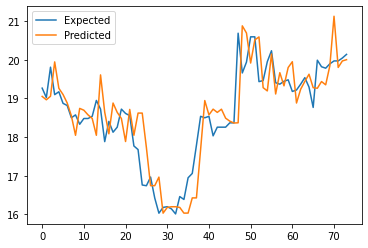

Shape of the array =  (246, 2)
>expected=19.3, predicted=19.1
>expected=19.0, predicted=19.2
>expected=19.8, predicted=19.7
>expected=19.1, predicted=19.2
>expected=19.2, predicted=19.2
>expected=18.9, predicted=19.2
>expected=18.8, predicted=19.1
>expected=18.5, predicted=18.9
>expected=18.6, predicted=18.5
>expected=18.3, predicted=17.9
>expected=18.5, predicted=18.3
>expected=18.5, predicted=18.4
>expected=18.5, predicted=17.8
>expected=18.9, predicted=18.4
>expected=18.7, predicted=18.7
>expected=17.9, predicted=19.4
>expected=18.4, predicted=17.8
>expected=18.1, predicted=18.6
>expected=18.3, predicted=18.5
>expected=18.7, predicted=19.1
>expected=18.6, predicted=18.7
>expected=18.6, predicted=18.4
>expected=17.8, predicted=18.0
>expected=17.7, predicted=18.2
>expected=16.8, predicted=18.6
>expected=16.7, predicted=17.3
>expected=17.0, predicted=17.3
>expected=16.4, predicted=17.0
>expected=16.0, predicted=17.0
>expected=16.2, predicted=16.8
>expected=16.2, predicted=16.2
>expecte

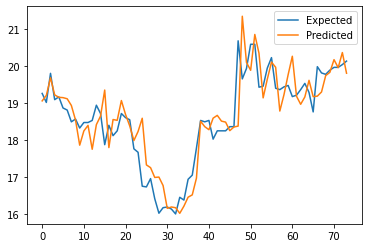

In [96]:
generate_covid_news_result(petronas_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.3, predicted=2.7
>expected=2.3, predicted=2.5
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.

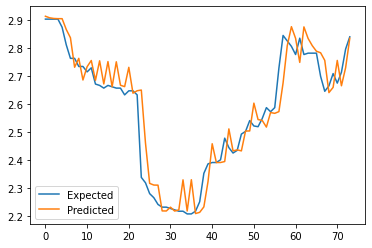

Shape of the array =  (246, 2)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.3, predicted=2.6
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.

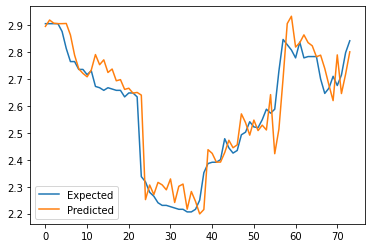

In [97]:
generate_all_news_result(yinson_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.3, predicted=2.7
>expected=2.3, predicted=2.5
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.

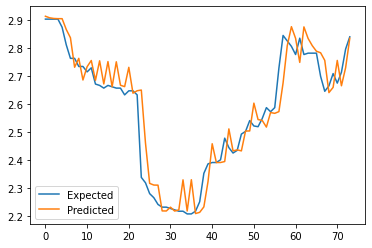

Shape of the array =  (246, 2)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.7
>expected=2.3, predicted=2.7
>expected=2.3, predicted=2.2
>expected=2.3, predicted=2.3
>expected=2.3, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.4
>expected=2.2, predicted=2.3
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.3
>expected=2.

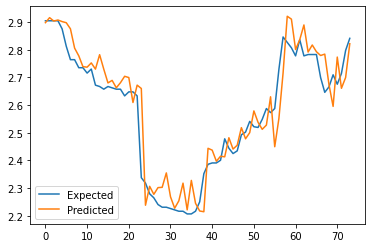

In [98]:
generate_covid_news_result(yinson_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.

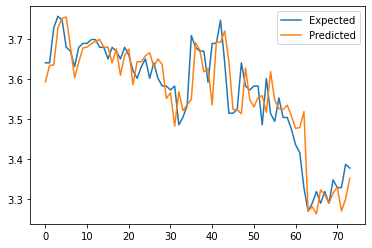

Shape of the array =  (246, 2)
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.

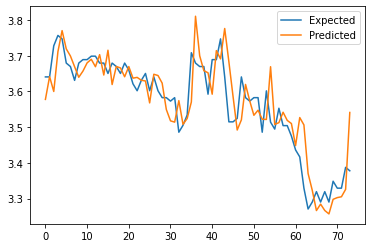

In [99]:
generate_all_news_result(dialog_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.

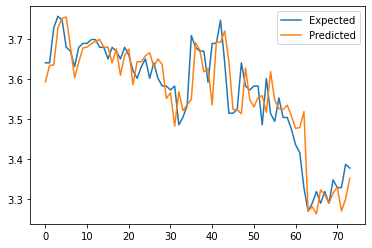

Shape of the array =  (246, 2)
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.8
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.

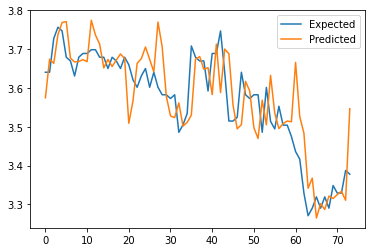

In [100]:
generate_covid_news_result(dialog_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.

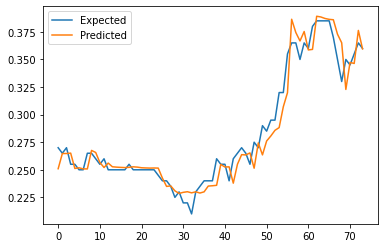

Shape of the array =  (246, 2)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.

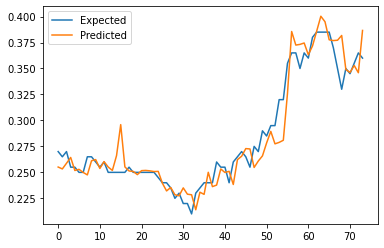

In [101]:
generate_all_news_result(bumi_armada_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.

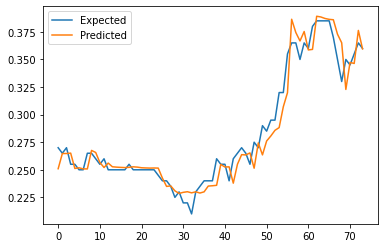

Shape of the array =  (246, 2)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.

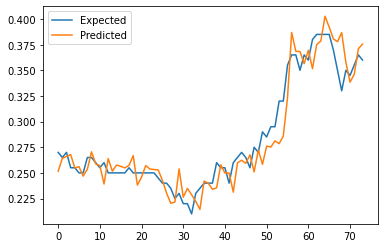

In [102]:
generate_covid_news_result(bumi_armada_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.2
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.

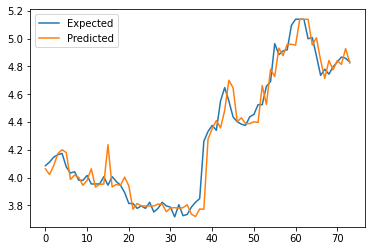

Shape of the array =  (246, 2)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.

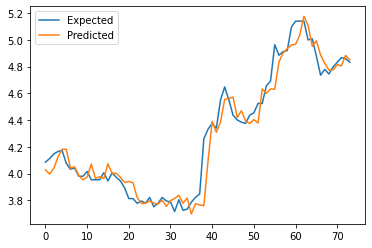

In [103]:
generate_all_news_result(rhb_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.2
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.

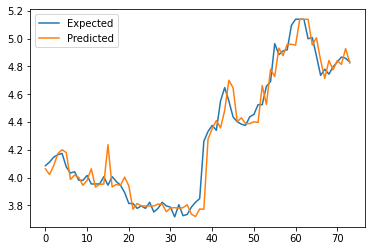

Shape of the array =  (246, 2)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=4.0
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.

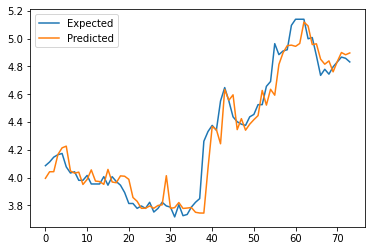

In [104]:
generate_covid_news_result(rhb_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=13.8, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.8
>expected=13.9, predicted=14.0
>expected=13.9, predicted=13.8
>expected=13.9, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.1, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=13.9
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=13.9, predicted=14.0
>expected=14.2, predicted=13.9
>expected=14.1, predicted=14.2
>expected=14.0, predicted=14.2
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expecte

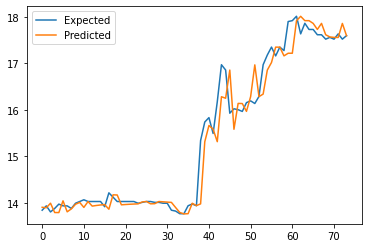

Shape of the array =  (246, 2)
>expected=13.8, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.9
>expected=13.9, predicted=14.2
>expected=13.9, predicted=13.9
>expected=13.9, predicted=13.9
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.1
>expected=14.1, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=13.4
>expected=14.0, predicted=13.5
>expected=13.9, predicted=13.5
>expected=14.2, predicted=14.0
>expected=14.1, predicted=14.0
>expected=14.0, predicted=14.1
>expected=14.0, predicted=14.1
>expected=14.0, predicted=13.4
>expected=14.0, predicted=13.7
>expected=14.0, predicted=13.8
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.2
>expecte

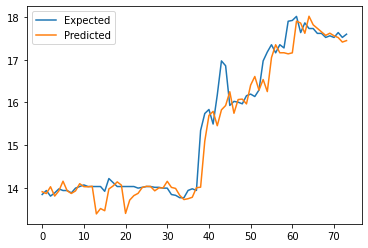

In [105]:
generate_all_news_result(hongleong_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=13.8, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.8
>expected=13.9, predicted=14.0
>expected=13.9, predicted=13.8
>expected=13.9, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.1, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=13.9
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=13.9, predicted=14.0
>expected=14.2, predicted=13.9
>expected=14.1, predicted=14.2
>expected=14.0, predicted=14.2
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expecte

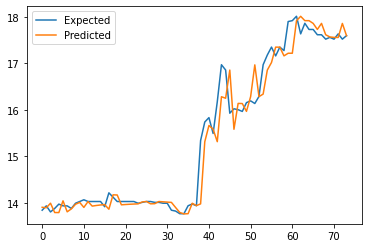

Shape of the array =  (246, 2)
>expected=13.8, predicted=13.8
>expected=13.9, predicted=14.0
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.8
>expected=13.9, predicted=14.1
>expected=13.9, predicted=14.0
>expected=13.9, predicted=13.9
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.1, predicted=14.1
>expected=14.0, predicted=13.8
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=13.9, predicted=14.0
>expected=14.2, predicted=14.0
>expected=14.1, predicted=14.2
>expected=14.0, predicted=14.1
>expected=14.0, predicted=14.0
>expected=14.0, predicted=13.4
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.9
>expected=14.0, predicted=14.0
>expecte

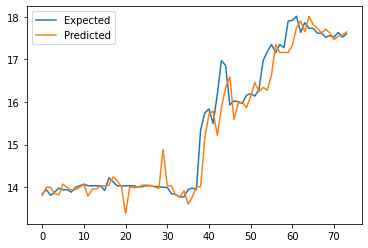

In [106]:
generate_covid_news_result(hongleong_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.0, predicted=3.4
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.4
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.

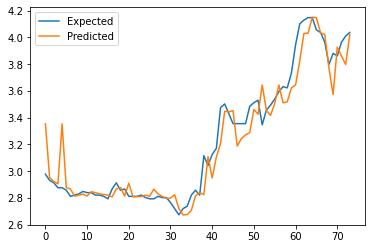

Shape of the array =  (246, 2)
>expected=3.0, predicted=3.2
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.2
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.

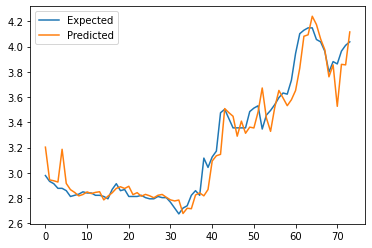

In [107]:
generate_all_news_result(cimb_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.0, predicted=3.4
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.4
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.

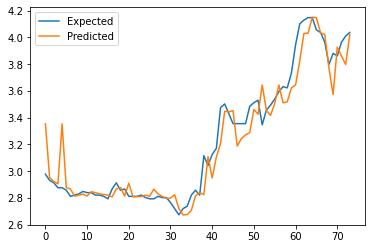

Shape of the array =  (246, 2)
>expected=3.0, predicted=3.2
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.2
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
>expected=2.

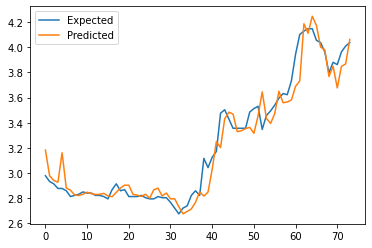

In [108]:
generate_covid_news_result(cimb_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.7, predicted=2.7
>expected=2.

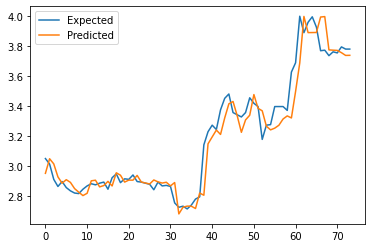

Shape of the array =  (246, 2)
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.7, predicted=2.8
>expected=2.

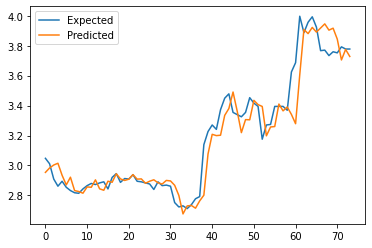

In [109]:
generate_all_news_result(public_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.7, predicted=2.7
>expected=2.

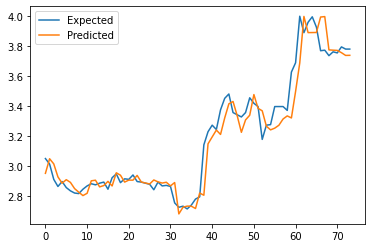

Shape of the array =  (246, 2)
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.7, predicted=2.8
>expected=2.

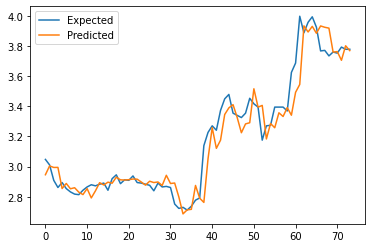

In [110]:
generate_covid_news_result(public_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.1, predicted=6.4
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=5.9
>expected=6.0, predicted=5.9
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.2, predicted=6.1
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=5.9
>expected=5.

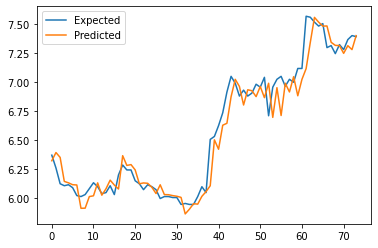

Shape of the array =  (246, 2)
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.1, predicted=6.3
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.0
>expected=6.0, predicted=6.2
>expected=6.2, predicted=6.0
>expected=6.3, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=5.9
>expected=5.

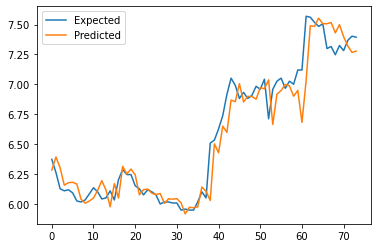

In [111]:
generate_all_news_result(maybank_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.1, predicted=6.4
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=5.9
>expected=6.0, predicted=5.9
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.2, predicted=6.1
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=5.9
>expected=5.

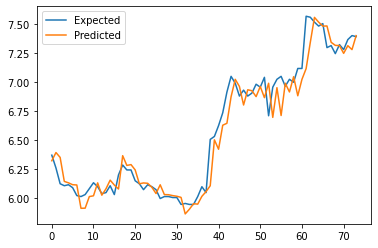

Shape of the array =  (246, 2)
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.1, predicted=6.3
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.2, predicted=6.1
>expected=6.3, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.3
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=5.9
>expected=5.

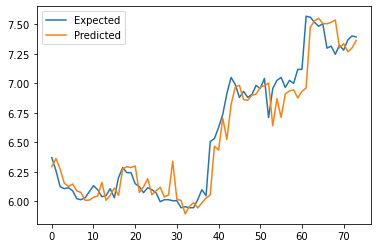

In [112]:
generate_covid_news_result(maybank_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.1
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.1
>expected=4.8, predicted=4.9
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.0
>expected=4.9, predicted=4.9
>expected=5.0, predicted=5.0
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.6
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.0, predicted=5.1
>expected=5.0, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.6
>expected=5.

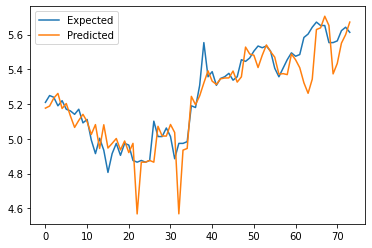

Shape of the array =  (246, 2)
>expected=5.2, predicted=5.0
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.2
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.2
>expected=4.9, predicted=5.1
>expected=4.8, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.2
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.9
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.0, predicted=5.0
>expected=5.0, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.9
>expected=5.

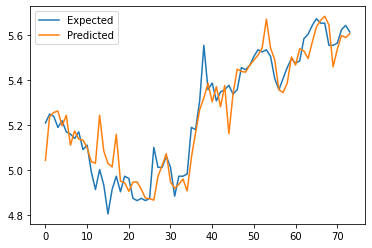

In [113]:
generate_all_news_result(ihh_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.1
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.1
>expected=4.8, predicted=4.9
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.0
>expected=4.9, predicted=4.9
>expected=5.0, predicted=5.0
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.6
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.0, predicted=5.1
>expected=5.0, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.6
>expected=5.

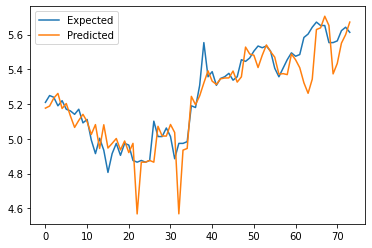

Shape of the array =  (246, 2)
>expected=5.2, predicted=5.0
>expected=5.2, predicted=5.4
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.1, predicted=5.3
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.2
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.1
>expected=4.8, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.1
>expected=4.9, predicted=4.9
>expected=5.0, predicted=5.1
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.0, predicted=4.9
>expected=5.0, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.8
>expected=5.

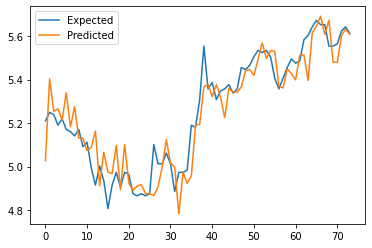

In [114]:
generate_covid_news_result(ihh_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

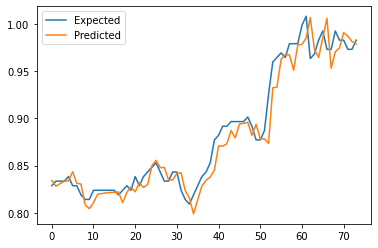

Shape of the array =  (246, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

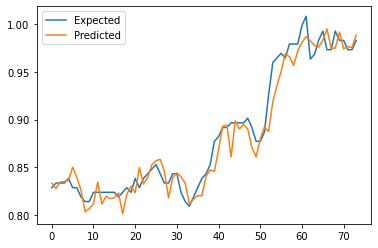

In [115]:
generate_all_news_result(kpj_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

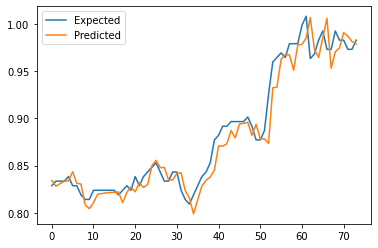

Shape of the array =  (246, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.

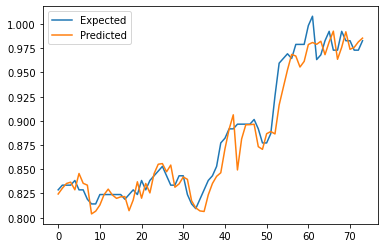

In [116]:
generate_covid_news_result(kpj_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.5, predicted=7.9
>expected=6.9, predicted=7.8
>expected=7.1, predicted=7.6
>expected=7.1, predicted=6.9
>expected=7.1, predicted=6.9
>expected=7.1, predicted=7.0
>expected=7.6, predicted=7.1
>expected=7.8, predicted=7.5
>expected=7.8, predicted=7.8
>expected=7.5, predicted=7.8
>expected=7.4, predicted=7.8
>expected=7.5, predicted=7.3
>expected=7.8, predicted=6.9
>expected=7.9, predicted=7.9
>expected=7.7, predicted=8.4
>expected=7.8, predicted=7.9
>expected=7.8, predicted=7.8
>expected=7.8, predicted=7.8
>expected=8.0, predicted=7.8
>expected=8.1, predicted=8.4
>expected=8.4, predicted=7.3
>expected=8.3, predicted=8.3
>expected=8.3, predicted=8.3
>expected=8.6, predicted=8.3
>expected=8.5, predicted=8.3
>expected=8.0, predicted=8.3
>expected=8.0, predicted=8.4
>expected=7.8, predicted=8.1
>expected=7.8, predicted=7.8
>expected=8.0, predicted=7.8
>expected=7.9, predicted=7.8
>expected=7.7, predicted=7.7
>expected=7.5, predicted=7.8
>expected=7.

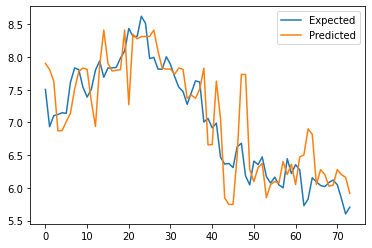

Shape of the array =  (246, 2)
>expected=7.5, predicted=8.0
>expected=6.9, predicted=7.7
>expected=7.1, predicted=6.5
>expected=7.1, predicted=6.8
>expected=7.1, predicted=6.7
>expected=7.1, predicted=6.6
>expected=7.6, predicted=6.9
>expected=7.8, predicted=7.4
>expected=7.8, predicted=7.6
>expected=7.5, predicted=7.8
>expected=7.4, predicted=7.8
>expected=7.5, predicted=7.3
>expected=7.8, predicted=7.2
>expected=7.9, predicted=7.4
>expected=7.7, predicted=8.3
>expected=7.8, predicted=7.9
>expected=7.8, predicted=7.5
>expected=7.8, predicted=7.7
>expected=8.0, predicted=7.8
>expected=8.1, predicted=8.3
>expected=8.4, predicted=7.5
>expected=8.3, predicted=8.0
>expected=8.3, predicted=8.1
>expected=8.6, predicted=8.3
>expected=8.5, predicted=8.4
>expected=8.0, predicted=8.2
>expected=8.0, predicted=8.2
>expected=7.8, predicted=8.2
>expected=7.8, predicted=7.9
>expected=8.0, predicted=7.6
>expected=7.9, predicted=7.9
>expected=7.7, predicted=7.8
>expected=7.5, predicted=7.6
>expected=7.

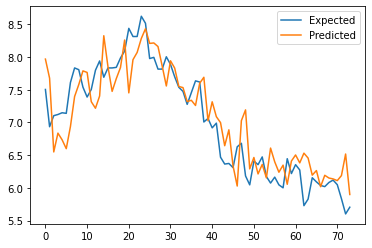

In [117]:
generate_all_news_result(topglove_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=7.5, predicted=7.9
>expected=6.9, predicted=7.8
>expected=7.1, predicted=7.6
>expected=7.1, predicted=6.9
>expected=7.1, predicted=6.9
>expected=7.1, predicted=7.0
>expected=7.6, predicted=7.1
>expected=7.8, predicted=7.5
>expected=7.8, predicted=7.8
>expected=7.5, predicted=7.8
>expected=7.4, predicted=7.8
>expected=7.5, predicted=7.3
>expected=7.8, predicted=6.9
>expected=7.9, predicted=7.9
>expected=7.7, predicted=8.4
>expected=7.8, predicted=7.9
>expected=7.8, predicted=7.8
>expected=7.8, predicted=7.8
>expected=8.0, predicted=7.8
>expected=8.1, predicted=8.4
>expected=8.4, predicted=7.3
>expected=8.3, predicted=8.3
>expected=8.3, predicted=8.3
>expected=8.6, predicted=8.3
>expected=8.5, predicted=8.3
>expected=8.0, predicted=8.3
>expected=8.0, predicted=8.4
>expected=7.8, predicted=8.1
>expected=7.8, predicted=7.8
>expected=8.0, predicted=7.8
>expected=7.9, predicted=7.8
>expected=7.7, predicted=7.7
>expected=7.5, predicted=7.8
>expected=7.

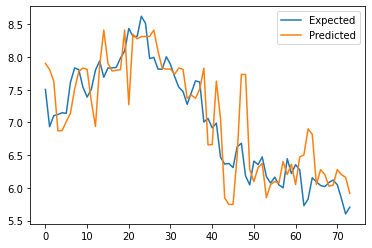

Shape of the array =  (246, 2)
>expected=7.5, predicted=7.9
>expected=6.9, predicted=7.7
>expected=7.1, predicted=6.5
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.6, predicted=7.1
>expected=7.8, predicted=7.6
>expected=7.8, predicted=7.8
>expected=7.5, predicted=7.8
>expected=7.4, predicted=7.7
>expected=7.5, predicted=7.0
>expected=7.8, predicted=7.1
>expected=7.9, predicted=8.1
>expected=7.7, predicted=8.2
>expected=7.8, predicted=7.6
>expected=7.8, predicted=7.8
>expected=7.8, predicted=7.9
>expected=8.0, predicted=7.7
>expected=8.1, predicted=8.0
>expected=8.4, predicted=7.3
>expected=8.3, predicted=8.3
>expected=8.3, predicted=8.1
>expected=8.6, predicted=8.4
>expected=8.5, predicted=8.4
>expected=8.0, predicted=8.2
>expected=8.0, predicted=8.2
>expected=7.8, predicted=8.2
>expected=7.8, predicted=8.0
>expected=8.0, predicted=7.6
>expected=7.9, predicted=8.0
>expected=7.7, predicted=7.8
>expected=7.5, predicted=7.8
>expected=7.

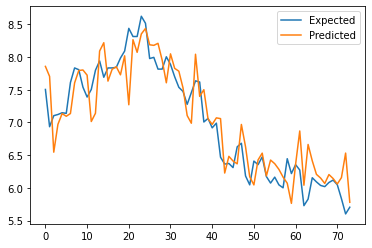

In [118]:
generate_covid_news_result(topglove_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=11.7, predicted=11.1
>expected=11.7, predicted=11.5
>expected=11.8, predicted=11.7
>expected=11.6, predicted=11.7
>expected=11.7, predicted=11.5
>expected=12.1, predicted=11.7
>expected=13.2, predicted=12.5
>expected=14.1, predicted=13.7
>expected=14.5, predicted=13.0
>expected=14.1, predicted=15.0
>expected=13.5, predicted=13.7
>expected=13.5, predicted=13.8
>expected=14.6, predicted=13.5
>expected=14.6, predicted=13.7
>expected=14.2, predicted=14.3
>expected=14.1, predicted=14.9
>expected=14.1, predicted=13.7
>expected=14.5, predicted=14.1
>expected=14.6, predicted=14.1
>expected=14.6, predicted=14.6
>expected=15.1, predicted=14.2
>expected=15.0, predicted=15.0
>expected=15.3, predicted=14.6
>expected=15.8, predicted=15.2
>expected=15.8, predicted=15.3
>expected=14.8, predicted=15.8
>expected=14.8, predicted=14.1
>expected=14.4, predicted=14.8
>expected=14.7, predicted=15.0
>expected=15.2, predicted=15.2
>expected=15.0, predicted=15.0
>expecte

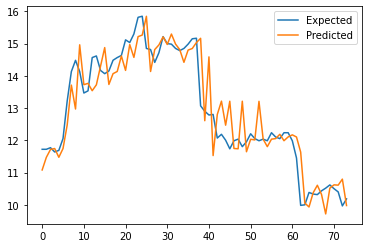

Shape of the array =  (246, 2)
>expected=11.7, predicted=11.4
>expected=11.7, predicted=11.3
>expected=11.8, predicted=11.6
>expected=11.6, predicted=11.8
>expected=11.7, predicted=11.9
>expected=12.1, predicted=11.2
>expected=13.2, predicted=12.8
>expected=14.1, predicted=13.5
>expected=14.5, predicted=13.8
>expected=14.1, predicted=14.7
>expected=13.5, predicted=14.0
>expected=13.5, predicted=13.1
>expected=14.6, predicted=13.2
>expected=14.6, predicted=14.0
>expected=14.2, predicted=14.7
>expected=14.1, predicted=13.9
>expected=14.1, predicted=11.9
>expected=14.5, predicted=14.3
>expected=14.6, predicted=14.4
>expected=14.6, predicted=14.5
>expected=15.1, predicted=14.3
>expected=15.0, predicted=16.4
>expected=15.3, predicted=14.6
>expected=15.8, predicted=16.0
>expected=15.8, predicted=14.3
>expected=14.8, predicted=15.7
>expected=14.8, predicted=14.0
>expected=14.4, predicted=14.5
>expected=14.7, predicted=13.7
>expected=15.2, predicted=14.2
>expected=15.0, predicted=16.1
>expecte

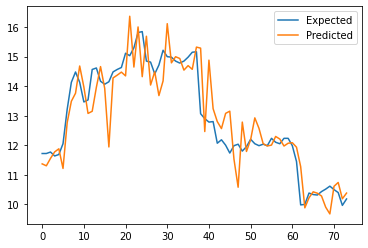

In [119]:
generate_all_news_result(harta_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=11.7, predicted=11.1
>expected=11.7, predicted=11.5
>expected=11.8, predicted=11.7
>expected=11.6, predicted=11.7
>expected=11.7, predicted=11.5
>expected=12.1, predicted=11.7
>expected=13.2, predicted=12.5
>expected=14.1, predicted=13.7
>expected=14.5, predicted=13.0
>expected=14.1, predicted=15.0
>expected=13.5, predicted=13.7
>expected=13.5, predicted=13.8
>expected=14.6, predicted=13.5
>expected=14.6, predicted=13.7
>expected=14.2, predicted=14.3
>expected=14.1, predicted=14.9
>expected=14.1, predicted=13.7
>expected=14.5, predicted=14.1
>expected=14.6, predicted=14.1
>expected=14.6, predicted=14.6
>expected=15.1, predicted=14.2
>expected=15.0, predicted=15.0
>expected=15.3, predicted=14.6
>expected=15.8, predicted=15.2
>expected=15.8, predicted=15.3
>expected=14.8, predicted=15.8
>expected=14.8, predicted=14.1
>expected=14.4, predicted=14.8
>expected=14.7, predicted=15.0
>expected=15.2, predicted=15.2
>expected=15.0, predicted=15.0
>expecte

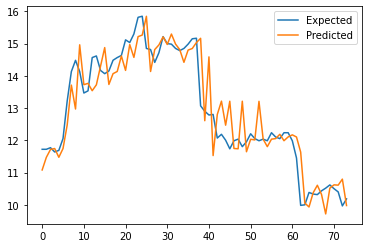

Shape of the array =  (246, 2)
>expected=11.7, predicted=12.2
>expected=11.7, predicted=11.4
>expected=11.8, predicted=11.3
>expected=11.6, predicted=11.8
>expected=11.7, predicted=12.0
>expected=12.1, predicted=11.5
>expected=13.2, predicted=12.8
>expected=14.1, predicted=13.8
>expected=14.5, predicted=13.6
>expected=14.1, predicted=14.8
>expected=13.5, predicted=13.7
>expected=13.5, predicted=13.1
>expected=14.6, predicted=13.4
>expected=14.6, predicted=14.7
>expected=14.2, predicted=14.8
>expected=14.1, predicted=14.6
>expected=14.1, predicted=13.7
>expected=14.5, predicted=14.2
>expected=14.6, predicted=14.2
>expected=14.6, predicted=14.5
>expected=15.1, predicted=13.7
>expected=15.0, predicted=15.4
>expected=15.3, predicted=14.6
>expected=15.8, predicted=15.7
>expected=15.8, predicted=15.0
>expected=14.8, predicted=15.6
>expected=14.8, predicted=14.0
>expected=14.4, predicted=14.8
>expected=14.7, predicted=14.8
>expected=15.2, predicted=14.3
>expected=15.0, predicted=15.3
>expecte

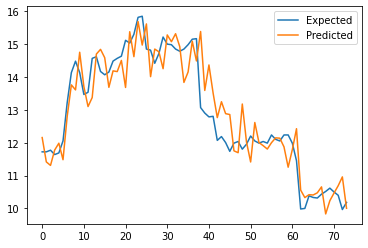

In [120]:
generate_covid_news_result(harta_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.8, predicted=4.0
>expected=4.9, predicted=5.1
>expected=4.9, predicted=5.5
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.3, predicted=4.9
>expected=5.6, predicted=5.3
>expected=5.8, predicted=6.8
>expected=5.7, predicted=5.9
>expected=5.6, predicted=5.5
>expected=5.5, predicted=6.5
>expected=6.0, predicted=5.5
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.2
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.7
>expected=6.1, predicted=5.9
>expected=6.1, predicted=6.0
>expected=6.5, predicted=6.0
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.0, predicted=6.7
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.5
>expected=6.0, predicted=6.1
>expected=5.

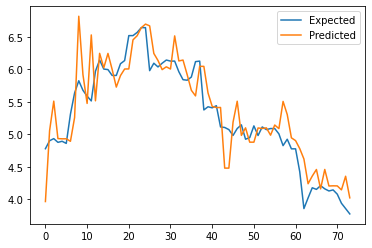

Shape of the array =  (246, 2)
>expected=4.8, predicted=4.5
>expected=4.9, predicted=5.1
>expected=4.9, predicted=5.2
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.3, predicted=4.9
>expected=5.6, predicted=5.1
>expected=5.8, predicted=6.2
>expected=5.7, predicted=5.7
>expected=5.6, predicted=5.8
>expected=5.5, predicted=5.6
>expected=6.0, predicted=5.4
>expected=6.1, predicted=5.5
>expected=6.0, predicted=5.9
>expected=6.0, predicted=5.9
>expected=5.9, predicted=5.8
>expected=5.9, predicted=5.7
>expected=6.1, predicted=5.8
>expected=6.1, predicted=6.2
>expected=6.5, predicted=6.0
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.7
>expected=6.0, predicted=6.5
>expected=6.1, predicted=5.7
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.2
>expected=6.1, predicted=5.9
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.1
>expected=6.0, predicted=5.9
>expected=5.

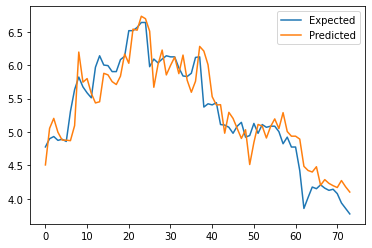

In [121]:
generate_all_news_result(kossan_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.8, predicted=4.0
>expected=4.9, predicted=5.1
>expected=4.9, predicted=5.5
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.3, predicted=4.9
>expected=5.6, predicted=5.3
>expected=5.8, predicted=6.8
>expected=5.7, predicted=5.9
>expected=5.6, predicted=5.5
>expected=5.5, predicted=6.5
>expected=6.0, predicted=5.5
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.2
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.7
>expected=6.1, predicted=5.9
>expected=6.1, predicted=6.0
>expected=6.5, predicted=6.0
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.7
>expected=6.0, predicted=6.7
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.5
>expected=6.0, predicted=6.1
>expected=5.

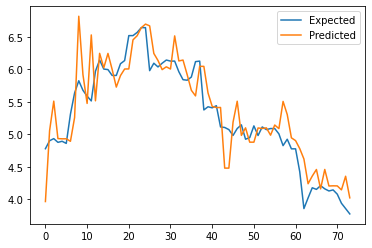

Shape of the array =  (246, 2)
>expected=4.8, predicted=4.5
>expected=4.9, predicted=5.0
>expected=4.9, predicted=5.3
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=5.0
>expected=5.3, predicted=4.9
>expected=5.6, predicted=5.3
>expected=5.8, predicted=6.0
>expected=5.7, predicted=5.9
>expected=5.6, predicted=5.6
>expected=5.5, predicted=5.6
>expected=6.0, predicted=5.2
>expected=6.1, predicted=6.0
>expected=6.0, predicted=5.9
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.7
>expected=6.1, predicted=5.8
>expected=6.1, predicted=5.9
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.7
>expected=6.6, predicted=6.7
>expected=6.0, predicted=6.6
>expected=6.1, predicted=5.7
>expected=6.0, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=5.8
>expected=6.1, predicted=6.0
>expected=6.1, predicted=6.0
>expected=6.0, predicted=6.1
>expected=5.

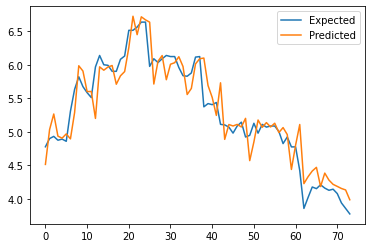

In [122]:
generate_covid_news_result(kossan_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.7
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.9, predicted=3.8
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.

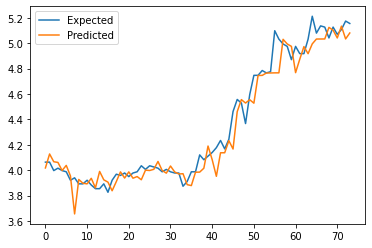

Shape of the array =  (246, 2)
>expected=4.1, predicted=3.9
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.8
>expected=3.9, predicted=3.8
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.8
>expected=3.9, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.9, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.

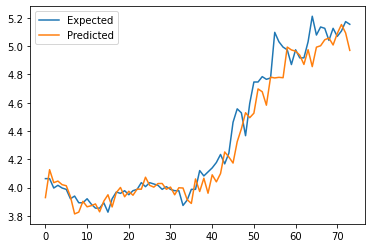

In [123]:
generate_all_news_result(tm_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.7
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.9, predicted=3.8
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=3.9
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.

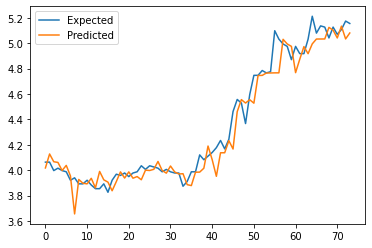

Shape of the array =  (246, 2)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.8, predicted=3.9
>expected=3.9, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.7
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.

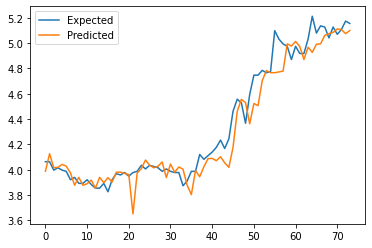

In [124]:
generate_covid_news_result(tm_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.8
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.5, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.9, predicted=2.6
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.

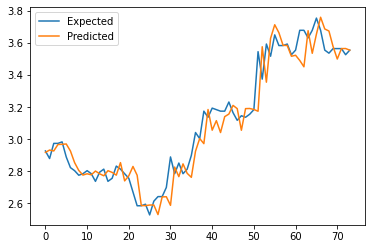

Shape of the array =  (246, 2)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.7
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.5, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.7
>expected=2.9, predicted=2.7
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.7
>expected=2.

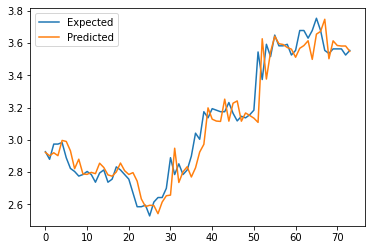

In [125]:
generate_all_news_result(axiata_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.8
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.5, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.9, predicted=2.6
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.

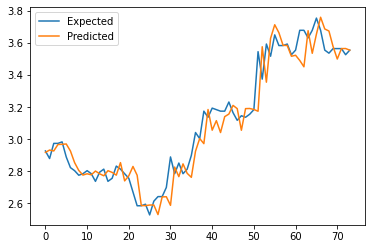

Shape of the array =  (246, 2)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.8
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.5, predicted=2.6
>expected=2.6, predicted=2.6
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.9, predicted=2.6
>expected=2.8, predicted=3.0
>expected=2.9, predicted=2.8
>expected=2.

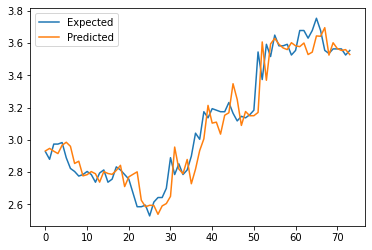

In [126]:
generate_covid_news_result(axiata_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

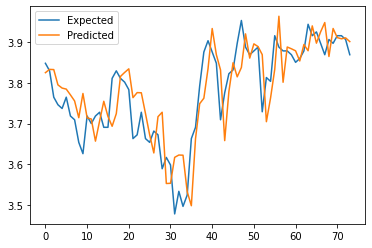

Shape of the array =  (246, 2)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

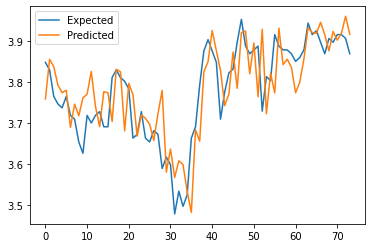

In [127]:
generate_all_news_result(digi_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

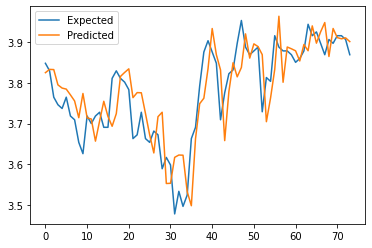

Shape of the array =  (246, 2)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.9
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.8
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.

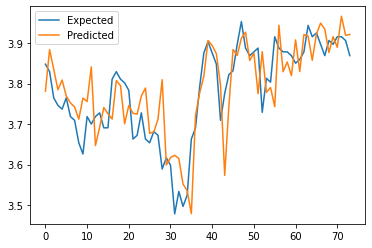

In [128]:
generate_covid_news_result(digi_data, covid_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.7, predicted=4.5
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.5, predicted=4.7
>expected=4.

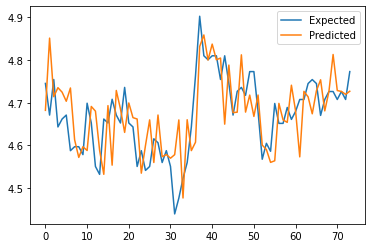

Shape of the array =  (246, 2)
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.4
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.

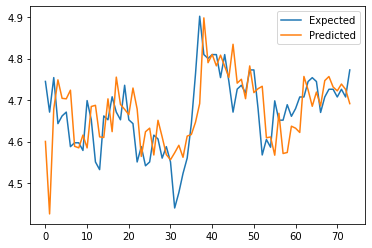

In [129]:
generate_all_news_result(maxis_data, all_news_strong_sentiment)

Shape of the array =  (246, 1)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.7, predicted=4.5
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.5
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.4, predicted=4.6
>expected=4.5, predicted=4.7
>expected=4.

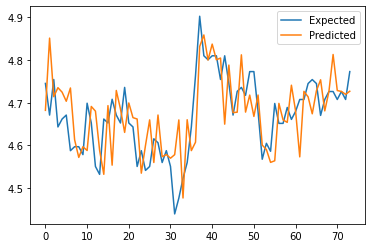

Shape of the array =  (246, 2)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.5
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.5
>expected=4.4, predicted=4.6
>expected=4.5, predicted=4.7
>expected=4.

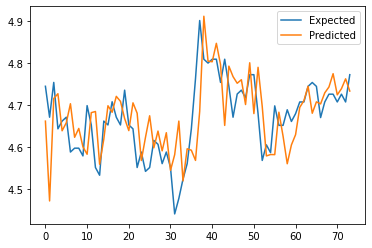

In [130]:
generate_covid_news_result(maxis_data, covid_news_strong_sentiment)

In [131]:
def evaluate_covid_news_split4(data1,data2,data3,data4):
    generate_covid_news_result(data1, covid_news_strong_sentiment1)
    generate_covid_news_result(data2, covid_news_strong_sentiment2)
    generate_covid_news_result(data3, covid_news_strong_sentiment3)
    generate_covid_news_result(data4, covid_news_strong_sentiment4)

In [132]:
ioi_data_act1 = get_stock_info('1961.KL', start_act1, end_act1)
ioi_data_act2 = get_stock_info('1961.KL', start_act2, end_act2)
ioi_data_act3 = get_stock_info('1961.KL', start_act3, end_act3)
ioi_data_act4 = get_stock_info('1961.KL', start_act4, end_act4)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Shape of the array =  (62, 1)
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.5, predicted=3.7
>expected=3.4, predicted=3.6
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
MAE: 0.096


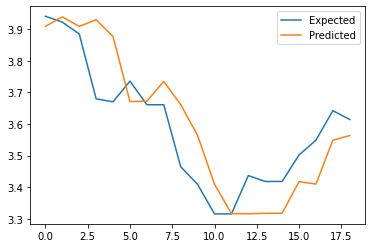

Shape of the array =  (62, 2)
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.5, predicted=3.7
>expected=3.4, predicted=3.5
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.3
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
MAE: 0.090


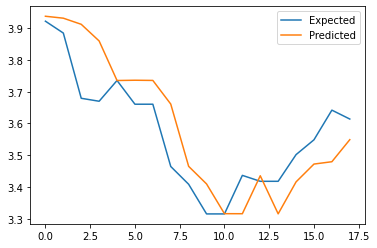

Shape of the array =  (57, 1)
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.2
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.0
MAE: 0.052


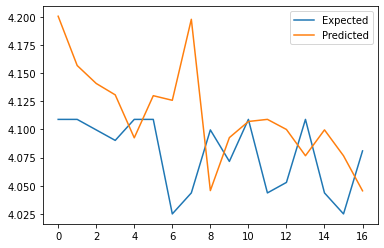

Shape of the array =  (57, 2)
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
MAE: 0.035


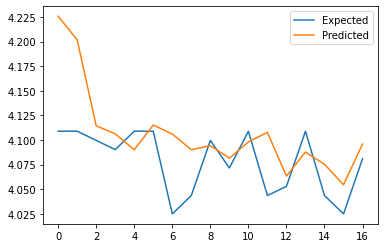

Shape of the array =  (61, 1)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.029


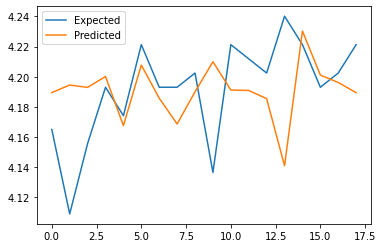

Shape of the array =  (61, 2)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.042


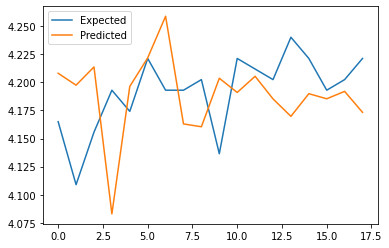

Shape of the array =  (63, 1)
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.3
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
MAE: 0.043


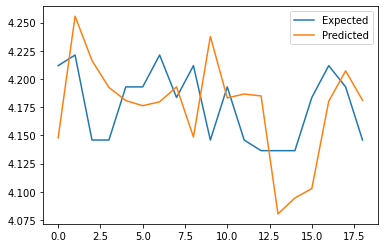

Shape of the array =  (63, 2)
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
MAE: 0.041


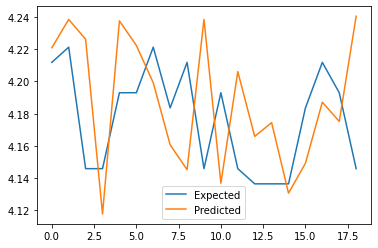

In [133]:
evaluate_covid_news_split4(ioi_data_act1,ioi_data_act2,ioi_data_act3,ioi_data_act4)

In [134]:
def process_prediction(quotes):
    for quote in quotes:
        data1 = get_stock_info(quote, start_act1, end_act1)
        data2 = get_stock_info(quote, start_act2, end_act2)
        data3 = get_stock_info(quote, start_act3, end_act3)
        data4 = get_stock_info(quote, start_act4, end_act4)
        evaluate_covid_news_split4(data1,data2,data3,data4)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=132.9, predicted=132.3
>expected=132.6, predicted=133.6
>expected=131.7, predicted=132.9
>expected=132.4, predicted=132.3
>expected=132.6, predicted=132.9
>expected=131.9, predicted=131.7
>expected=130.9, predicted=132.3
>expected=130.9, predicted=132.4
>expected=125.3, predicted=130.9
>expected=127.4, predicted=128.1
>expected=130.0, predicted=127.4
>expected=128.9, predicted=128.1
>expected=127.0, predicted=128.9
>expected=126.1, predicted=130.0
>expected=126.5, predicted=126.1
>expected=127.4, predicted=126.5
>expected=128.9, predicted=130.0
>expected=127.9, predicted=127.0
>expected=127.9, predicted=129.4
MAE: 1.390


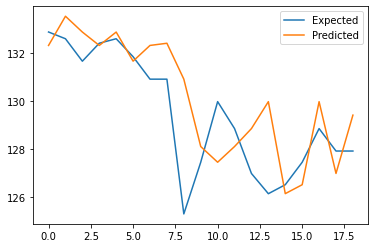

Shape of the array =  (62, 2)
>expected=132.6, predicted=133.5
>expected=131.7, predicted=132.7
>expected=132.4, predicted=132.5
>expected=132.6, predicted=132.9
>expected=131.9, predicted=132.1
>expected=130.9, predicted=132.4
>expected=130.9, predicted=132.6
>expected=125.3, predicted=130.9
>expected=127.4, predicted=125.3
>expected=130.0, predicted=127.4
>expected=128.9, predicted=128.3
>expected=127.0, predicted=127.5
>expected=126.1, predicted=127.3
>expected=126.5, predicted=127.9
>expected=127.4, predicted=126.5
>expected=128.9, predicted=128.5
>expected=127.9, predicted=128.8
>expected=127.9, predicted=127.1
MAE: 1.258


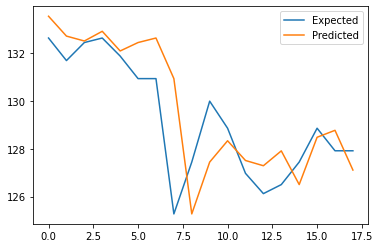

Shape of the array =  (57, 1)
>expected=133.4, predicted=131.3
>expected=130.5, predicted=133.0
>expected=133.0, predicted=132.1
>expected=133.0, predicted=131.7
>expected=132.7, predicted=132.4
>expected=131.9, predicted=132.4
>expected=131.6, predicted=134.0
>expected=132.3, predicted=132.3
>expected=132.6, predicted=132.4
>expected=132.5, predicted=131.9
>expected=132.1, predicted=132.4
>expected=132.1, predicted=132.3
>expected=132.9, predicted=132.2
>expected=132.4, predicted=132.5
>expected=132.1, predicted=132.4
>expected=131.8, predicted=132.3
>expected=131.9, predicted=132.8
MAE: 0.812


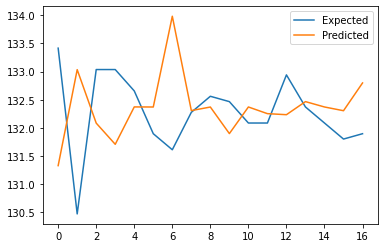

Shape of the array =  (57, 2)
>expected=133.4, predicted=132.2
>expected=130.5, predicted=132.7
>expected=133.0, predicted=130.2
>expected=133.0, predicted=132.8
>expected=132.7, predicted=133.1
>expected=131.9, predicted=132.6
>expected=131.6, predicted=133.6
>expected=132.3, predicted=131.9
>expected=132.6, predicted=132.4
>expected=132.5, predicted=130.7
>expected=132.1, predicted=133.7
>expected=132.1, predicted=132.4
>expected=132.9, predicted=133.1
>expected=132.4, predicted=132.7
>expected=132.1, predicted=132.0
>expected=131.8, predicted=132.3
>expected=131.9, predicted=132.6
MAE: 0.912


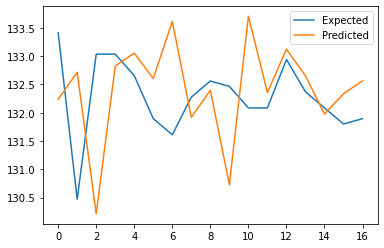

Shape of the array =  (61, 1)
>expected=132.8, predicted=134.7
>expected=132.7, predicted=133.7
>expected=134.0, predicted=132.8
>expected=135.0, predicted=132.7
>expected=133.8, predicted=134.7
>expected=133.8, predicted=132.2
>expected=132.3, predicted=133.8
>expected=133.7, predicted=133.4
>expected=134.4, predicted=132.2
>expected=134.3, predicted=133.7
>expected=132.8, predicted=134.3
>expected=133.0, predicted=133.3
>expected=132.9, predicted=132.8
>expected=134.5, predicted=132.8
>expected=133.7, predicted=133.7
>expected=133.5, predicted=134.4
>expected=134.4, predicted=133.0
>expected=134.1, predicted=134.3
MAE: 1.084


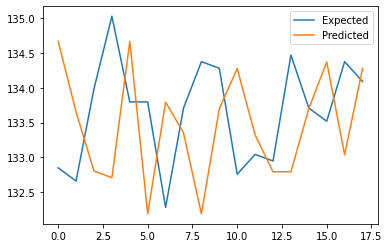

Shape of the array =  (61, 2)
>expected=132.8, predicted=134.7
>expected=132.7, predicted=132.7
>expected=134.0, predicted=133.3
>expected=135.0, predicted=133.1
>expected=133.8, predicted=134.4
>expected=133.8, predicted=132.7
>expected=132.3, predicted=133.4
>expected=133.7, predicted=132.7
>expected=134.4, predicted=133.2
>expected=134.3, predicted=132.7
>expected=132.8, predicted=133.5
>expected=133.0, predicted=132.5
>expected=132.9, predicted=132.8
>expected=134.5, predicted=132.5
>expected=133.7, predicted=133.0
>expected=133.5, predicted=133.1
>expected=134.4, predicted=133.4
>expected=134.1, predicted=132.8
MAE: 1.003


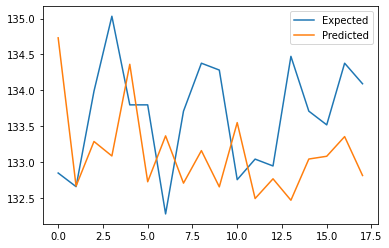

Shape of the array =  (63, 1)
>expected=132.0, predicted=131.5
>expected=131.5, predicted=135.4
>expected=130.2, predicted=132.0
>expected=131.5, predicted=131.5
>expected=131.3, predicted=131.1
>expected=131.8, predicted=131.2
>expected=132.2, predicted=131.5
>expected=131.0, predicted=135.4
>expected=131.9, predicted=131.5
>expected=132.8, predicted=132.2
>expected=132.1, predicted=133.8
>expected=135.2, predicted=131.0
>expected=131.9, predicted=134.3
>expected=132.4, predicted=132.7
>expected=132.8, predicted=135.4
>expected=133.6, predicted=133.7
>expected=133.0, predicted=133.7
>expected=133.9, predicted=128.6
>expected=133.9, predicted=132.8
MAE: 1.660


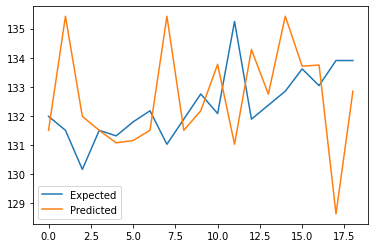

Shape of the array =  (63, 2)
>expected=132.0, predicted=131.6
>expected=131.5, predicted=132.7
>expected=130.2, predicted=131.8
>expected=131.5, predicted=130.9
>expected=131.3, predicted=132.0
>expected=131.8, predicted=131.6
>expected=132.2, predicted=131.5
>expected=131.0, predicted=132.5
>expected=131.9, predicted=130.5
>expected=132.8, predicted=132.2
>expected=132.1, predicted=133.3
>expected=135.2, predicted=131.9
>expected=131.9, predicted=132.2
>expected=132.4, predicted=134.3
>expected=132.8, predicted=132.4
>expected=133.6, predicted=134.5
>expected=133.0, predicted=133.5
>expected=133.9, predicted=129.8
>expected=133.9, predicted=133.1
MAE: 1.173


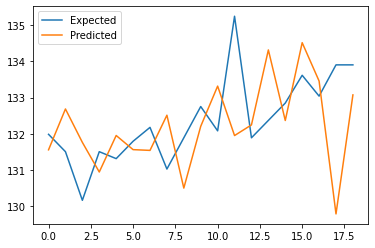

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=5.4, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.3, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.3, predicted=5.2
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.3
>expected=4.7, predicted=5.3
>expected=4.7, predicted=5.3
>expected=4.8, predicted=4.7
>expected=4.5, predicted=4.8
>expected=4.6, predicted=4.8
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.8
>expected=4.6, predicted=4.8
>expected=4.8, predicted=4.7
MAE: 0.125


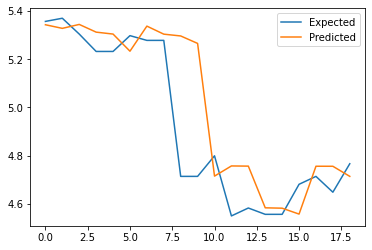

Shape of the array =  (62, 2)
>expected=5.4, predicted=5.3
>expected=5.3, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.3, predicted=5.2
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.3
>expected=4.7, predicted=5.3
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.9
>expected=4.5, predicted=4.8
>expected=4.6, predicted=4.8
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.8
>expected=4.6, predicted=4.8
>expected=4.8, predicted=4.8
MAE: 0.117


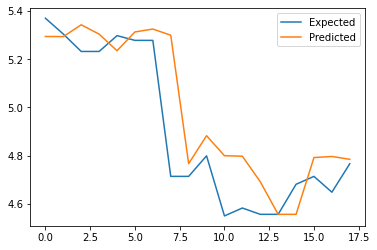

Shape of the array =  (57, 1)
>expected=6.2, predicted=6.6
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.2
>expected=6.4, predicted=6.0
>expected=6.2, predicted=6.1
>expected=6.1, predicted=6.6
>expected=6.0, predicted=6.1
>expected=6.0, predicted=5.9
>expected=6.2, predicted=6.1
>expected=6.2, predicted=6.1
MAE: 0.178


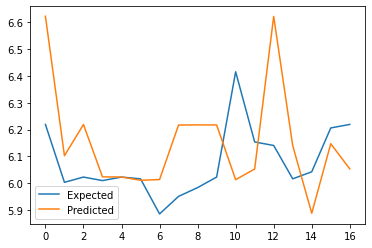

Shape of the array =  (57, 2)
>expected=6.2, predicted=6.6
>expected=6.0, predicted=6.6
>expected=6.0, predicted=6.6
>expected=6.0, predicted=5.9
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.0, predicted=5.9
>expected=6.0, predicted=5.9
>expected=6.4, predicted=6.0
>expected=6.2, predicted=6.0
>expected=6.1, predicted=6.6
>expected=6.0, predicted=6.6
>expected=6.0, predicted=5.9
>expected=6.2, predicted=6.0
>expected=6.2, predicted=6.1
MAE: 0.243


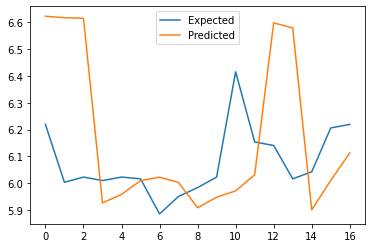

Shape of the array =  (61, 1)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
MAE: 0.050


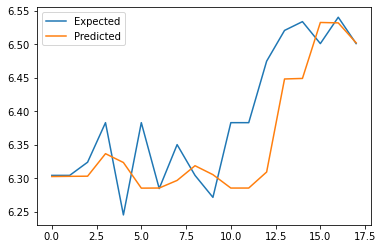

Shape of the array =  (61, 2)
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.4, predicted=6.3
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
MAE: 0.054


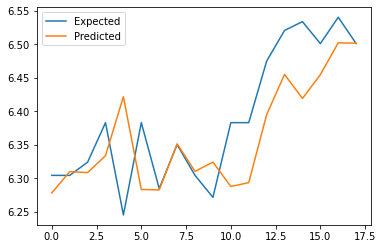

Shape of the array =  (63, 1)
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.3
>expected=6.0, predicted=6.0
>expected=5.9, predicted=6.0
>expected=5.9, predicted=6.0
>expected=5.8, predicted=5.9
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.9, predicted=5.8
>expected=6.0, predicted=5.8
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.8
>expected=5.9, predicted=5.9
MAE: 0.083


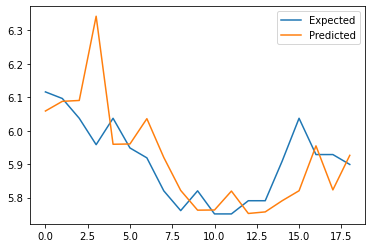

Shape of the array =  (63, 2)
>expected=6.1, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.2
>expected=6.0, predicted=5.9
>expected=5.9, predicted=6.2
>expected=5.9, predicted=6.1
>expected=5.8, predicted=6.0
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.7
>expected=5.8, predicted=5.8
>expected=5.9, predicted=5.8
>expected=6.0, predicted=5.8
>expected=5.9, predicted=6.0
>expected=5.9, predicted=6.0
>expected=5.9, predicted=5.8
MAE: 0.119


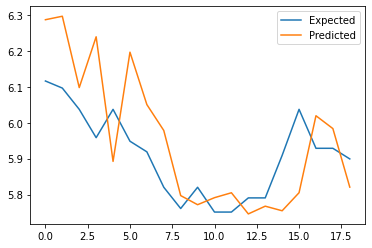

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=29.7, predicted=29.4
>expected=30.3, predicted=29.5
>expected=28.9, predicted=31.3
>expected=28.9, predicted=28.7
>expected=27.9, predicted=28.9
>expected=28.3, predicted=29.7
>expected=28.1, predicted=29.7
>expected=28.1, predicted=28.1
>expected=26.2, predicted=28.1
>expected=26.5, predicted=28.3
>expected=26.9, predicted=26.5
>expected=26.8, predicted=26.9
>expected=28.4, predicted=26.8
>expected=26.5, predicted=28.1
>expected=28.4, predicted=26.9
>expected=28.1, predicted=26.5
>expected=28.4, predicted=27.2
>expected=28.5, predicted=27.3
>expected=28.9, predicted=28.5
MAE: 1.115


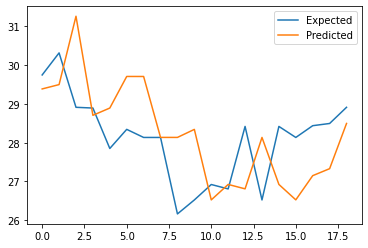

Shape of the array =  (62, 2)
>expected=30.3, predicted=29.6
>expected=28.9, predicted=31.1
>expected=28.9, predicted=29.1
>expected=27.9, predicted=29.3
>expected=28.3, predicted=28.6
>expected=28.1, predicted=28.4
>expected=28.1, predicted=28.4
>expected=26.2, predicted=28.1
>expected=26.5, predicted=26.2
>expected=26.9, predicted=26.7
>expected=26.8, predicted=26.9
>expected=28.4, predicted=26.8
>expected=26.5, predicted=28.2
>expected=28.4, predicted=28.4
>expected=28.1, predicted=26.7
>expected=28.4, predicted=28.1
>expected=28.5, predicted=27.3
>expected=28.9, predicted=29.2
MAE: 0.800


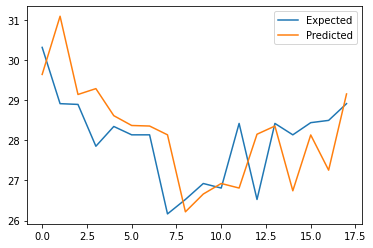

Shape of the array =  (57, 1)
>expected=31.1, predicted=31.1
>expected=30.1, predicted=31.1
>expected=30.8, predicted=30.2
>expected=31.0, predicted=30.6
>expected=31.1, predicted=30.6
>expected=31.1, predicted=30.6
>expected=31.1, predicted=30.7
>expected=30.9, predicted=31.1
>expected=31.1, predicted=31.1
>expected=30.6, predicted=30.8
>expected=31.1, predicted=30.1
>expected=31.1, predicted=30.9
>expected=31.1, predicted=31.1
>expected=31.0, predicted=30.8
>expected=30.5, predicted=30.8
>expected=30.6, predicted=30.4
>expected=30.6, predicted=30.6
MAE: 0.335


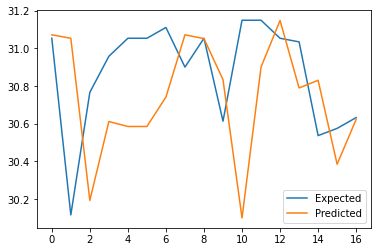

Shape of the array =  (57, 2)
>expected=31.1, predicted=30.7
>expected=30.1, predicted=31.1
>expected=30.8, predicted=29.7
>expected=31.0, predicted=30.5
>expected=31.1, predicted=30.2
>expected=31.1, predicted=30.1
>expected=31.1, predicted=30.1
>expected=30.9, predicted=30.7
>expected=31.1, predicted=30.9
>expected=30.6, predicted=31.0
>expected=31.1, predicted=30.2
>expected=31.1, predicted=30.8
>expected=31.1, predicted=31.0
>expected=31.0, predicted=31.0
>expected=30.5, predicted=30.6
>expected=30.6, predicted=31.0
>expected=30.6, predicted=30.7
MAE: 0.471


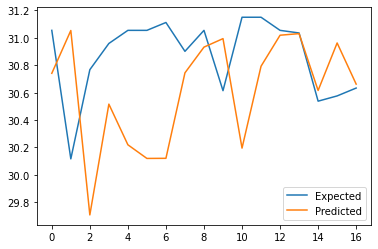

Shape of the array =  (61, 1)
>expected=30.0, predicted=31.5
>expected=29.9, predicted=31.5
>expected=30.2, predicted=29.9
>expected=30.8, predicted=30.0
>expected=30.6, predicted=30.7
>expected=30.7, predicted=30.9
>expected=30.6, predicted=30.7
>expected=31.1, predicted=30.9
>expected=30.8, predicted=30.7
>expected=31.4, predicted=30.6
>expected=31.5, predicted=31.2
>expected=31.1, predicted=30.7
>expected=31.1, predicted=30.7
>expected=31.0, predicted=31.3
>expected=30.8, predicted=30.7
>expected=31.3, predicted=30.6
>expected=31.3, predicted=30.5
>expected=31.4, predicted=30.7
MAE: 0.535


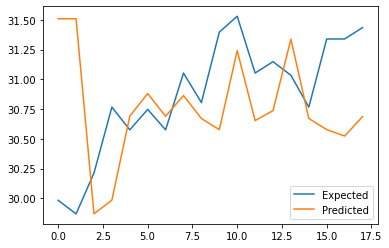

Shape of the array =  (61, 2)
>expected=30.0, predicted=31.4
>expected=29.9, predicted=30.7
>expected=30.2, predicted=29.9
>expected=30.8, predicted=30.5
>expected=30.6, predicted=30.6
>expected=30.7, predicted=30.6
>expected=30.6, predicted=30.7
>expected=31.1, predicted=31.4
>expected=30.8, predicted=30.6
>expected=31.4, predicted=30.9
>expected=31.5, predicted=30.4
>expected=31.1, predicted=30.9
>expected=31.1, predicted=31.2
>expected=31.0, predicted=31.3
>expected=30.8, predicted=30.7
>expected=31.3, predicted=31.2
>expected=31.3, predicted=30.1
>expected=31.4, predicted=30.5
MAE: 0.463


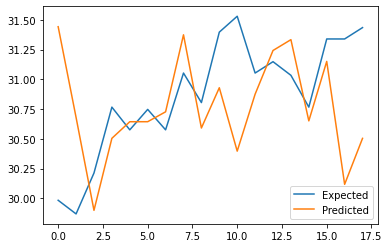

Shape of the array =  (63, 1)
>expected=31.0, predicted=31.1
>expected=31.0, predicted=31.1
>expected=30.4, predicted=30.3
>expected=30.5, predicted=30.6
>expected=31.0, predicted=30.5
>expected=31.0, predicted=31.0
>expected=30.7, predicted=31.0
>expected=30.5, predicted=30.4
>expected=31.1, predicted=30.6
>expected=31.3, predicted=31.0
>expected=30.5, predicted=31.3
>expected=31.3, predicted=31.0
>expected=31.1, predicted=30.5
>expected=31.0, predicted=31.2
>expected=30.1, predicted=31.0
>expected=31.0, predicted=29.7
>expected=31.0, predicted=30.6
>expected=30.3, predicted=30.7
>expected=31.2, predicted=30.2
MAE: 0.423


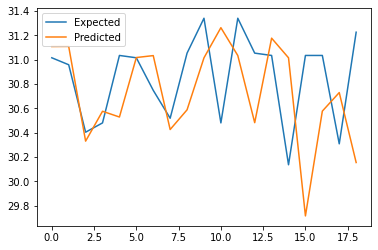

Shape of the array =  (63, 2)
>expected=31.0, predicted=31.0
>expected=31.0, predicted=31.0
>expected=30.4, predicted=30.6
>expected=30.5, predicted=30.6
>expected=31.0, predicted=30.3
>expected=31.0, predicted=31.3
>expected=30.7, predicted=31.0
>expected=30.5, predicted=30.6
>expected=31.1, predicted=30.9
>expected=31.3, predicted=30.7
>expected=30.5, predicted=31.0
>expected=31.3, predicted=31.8
>expected=31.1, predicted=31.0
>expected=31.0, predicted=30.9
>expected=30.1, predicted=30.9
>expected=31.0, predicted=29.8
>expected=31.0, predicted=30.3
>expected=30.3, predicted=30.9
>expected=31.2, predicted=30.5
MAE: 0.416


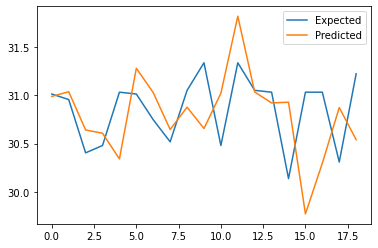

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.5, predicted=3.7
>expected=3.4, predicted=3.6
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.3
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
MAE: 0.091


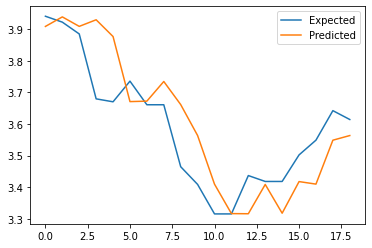

Shape of the array =  (62, 2)
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.5, predicted=3.7
>expected=3.4, predicted=3.5
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.3
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
MAE: 0.089


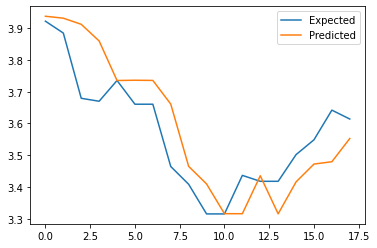

Shape of the array =  (57, 1)
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.2
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.0
MAE: 0.052


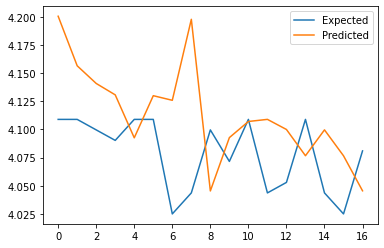

Shape of the array =  (57, 2)
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
MAE: 0.035


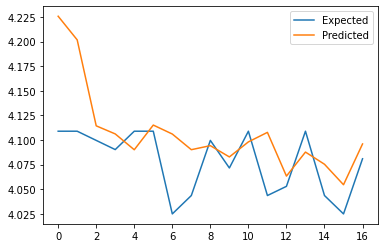

Shape of the array =  (61, 1)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.028


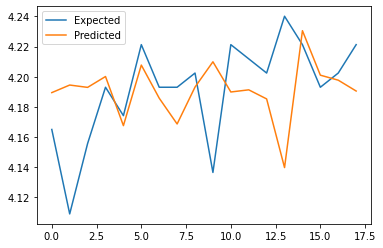

Shape of the array =  (61, 2)
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.041


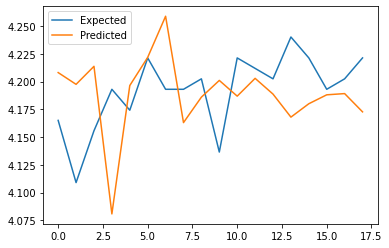

Shape of the array =  (63, 1)
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.3
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
MAE: 0.043


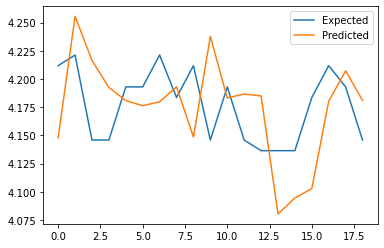

Shape of the array =  (63, 2)
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
MAE: 0.041


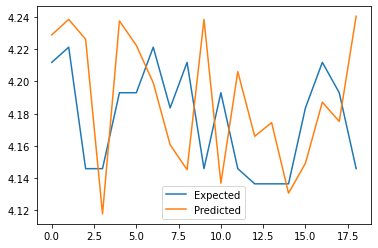

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.0, predicted=9.5
>expected=8.8, predicted=9.0
>expected=8.9, predicted=8.8
>expected=8.7, predicted=8.8
>expected=8.5, predicted=8.9
>expected=8.5, predicted=8.5
>expected=8.5, predicted=8.5
>expected=8.2, predicted=8.5
>expected=8.2, predicted=8.5
>expected=7.8, predicted=8.2
>expected=8.7, predicted=8.2
>expected=8.1, predicted=8.9
>expected=8.4, predicted=8.2
>expected=8.4, predicted=8.5
>expected=8.5, predicted=8.4
>expected=8.8, predicted=8.2
>expected=8.8, predicted=8.9
MAE: 0.264


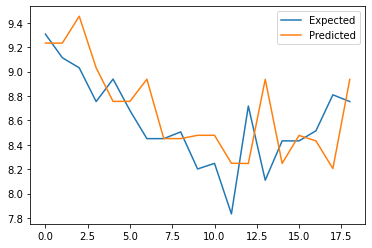

Shape of the array =  (62, 2)
>expected=9.1, predicted=9.3
>expected=9.0, predicted=9.3
>expected=8.8, predicted=9.1
>expected=8.9, predicted=8.8
>expected=8.7, predicted=8.9
>expected=8.5, predicted=8.9
>expected=8.5, predicted=8.5
>expected=8.5, predicted=8.5
>expected=8.2, predicted=8.5
>expected=8.2, predicted=8.5
>expected=7.8, predicted=8.3
>expected=8.7, predicted=7.8
>expected=8.1, predicted=8.0
>expected=8.4, predicted=8.3
>expected=8.4, predicted=8.0
>expected=8.5, predicted=8.5
>expected=8.8, predicted=8.2
>expected=8.8, predicted=8.7
MAE: 0.283


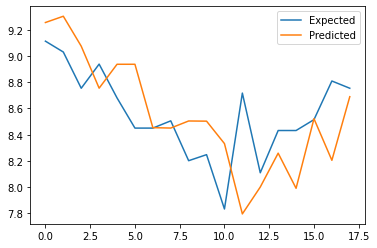

Shape of the array =  (57, 1)
>expected=9.3, predicted=9.3
>expected=9.3, predicted=9.3
>expected=9.4, predicted=9.3
>expected=9.4, predicted=9.4
>expected=9.4, predicted=9.4
>expected=9.2, predicted=9.4
>expected=9.1, predicted=9.3
>expected=9.2, predicted=8.9
>expected=9.2, predicted=9.1
>expected=9.0, predicted=9.1
>expected=9.2, predicted=8.9
>expected=9.2, predicted=9.1
>expected=9.4, predicted=9.0
>expected=9.3, predicted=9.2
>expected=9.0, predicted=9.3
>expected=9.0, predicted=9.2
>expected=9.1, predicted=9.5
MAE: 0.169


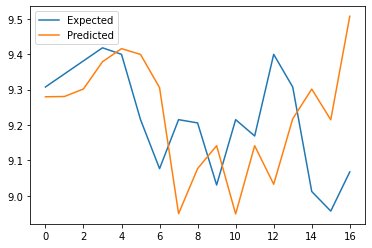

Shape of the array =  (57, 2)
>expected=9.3, predicted=9.3
>expected=9.3, predicted=9.3
>expected=9.4, predicted=9.3
>expected=9.4, predicted=9.4
>expected=9.4, predicted=9.4
>expected=9.2, predicted=9.4
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.3
>expected=9.0, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.2
>expected=9.3, predicted=9.4
>expected=9.0, predicted=9.2
>expected=9.0, predicted=9.2
>expected=9.1, predicted=9.3
MAE: 0.102


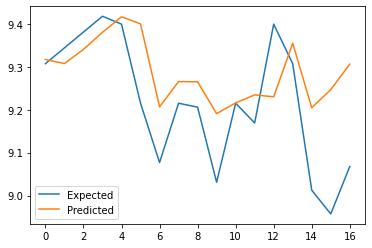

Shape of the array =  (61, 1)
>expected=9.3, predicted=9.3
>expected=9.1, predicted=9.3
>expected=9.1, predicted=9.2
>expected=9.3, predicted=9.2
>expected=9.3, predicted=9.3
>expected=9.1, predicted=9.4
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.2
MAE: 0.085


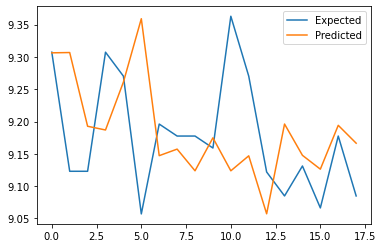

Shape of the array =  (61, 2)
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.3
>expected=9.1, predicted=9.1
>expected=9.3, predicted=9.2
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.1
>expected=9.2, predicted=9.3
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.2
MAE: 0.089


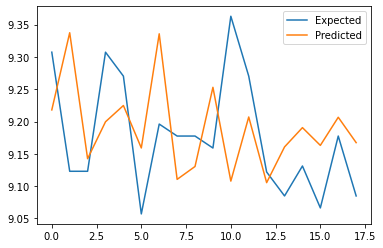

Shape of the array =  (63, 1)
>expected=9.3, predicted=9.3
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.2
>expected=9.0, predicted=9.2
>expected=9.3, predicted=9.1
>expected=9.2, predicted=9.3
>expected=9.1, predicted=9.1
>expected=9.4, predicted=9.2
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.1
>expected=9.2, predicted=9.2
>expected=9.2, predicted=9.1
>expected=9.1, predicted=9.2
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.2
MAE: 0.082


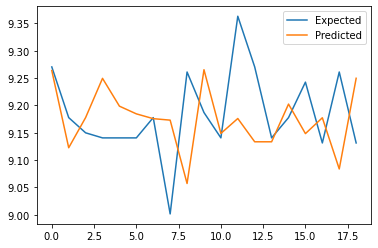

Shape of the array =  (63, 2)
>expected=9.3, predicted=9.2
>expected=9.2, predicted=9.3
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.1, predicted=9.3
>expected=9.2, predicted=9.2
>expected=9.0, predicted=9.1
>expected=9.3, predicted=9.0
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.4, predicted=9.1
>expected=9.3, predicted=9.2
>expected=9.1, predicted=9.2
>expected=9.2, predicted=9.3
>expected=9.2, predicted=9.2
>expected=9.1, predicted=9.3
>expected=9.3, predicted=9.1
>expected=9.1, predicted=9.1
MAE: 0.094


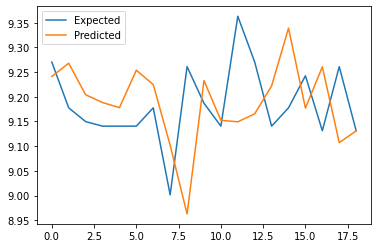

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.7
>expected=1.4, predicted=1.6
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.3, predicted=1.2
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.5, predicted=1.3
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
MAE: 0.079


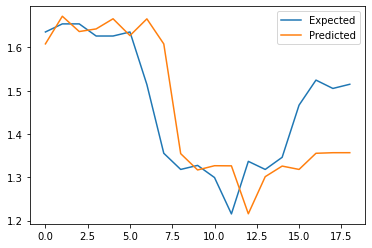

Shape of the array =  (62, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.7
>expected=1.4, predicted=1.6
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.3, predicted=1.2
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.5, predicted=1.3
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
MAE: 0.076


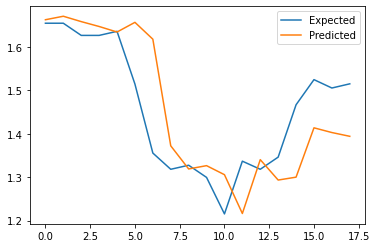

Shape of the array =  (57, 1)
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
MAE: 0.027


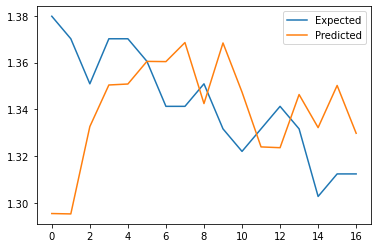

Shape of the array =  (57, 2)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
MAE: 0.021


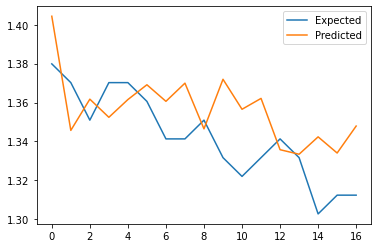

Shape of the array =  (61, 1)
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
MAE: 0.017


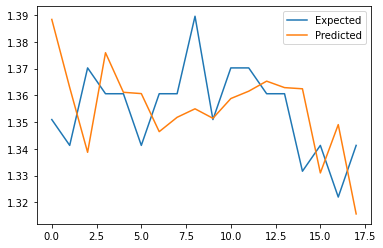

Shape of the array =  (61, 2)
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.3, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.3
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.3, predicted=1.4
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
MAE: 0.021


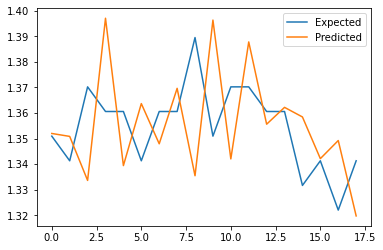

Shape of the array =  (63, 1)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.024


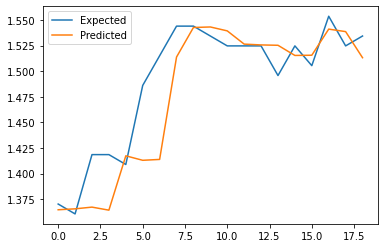

Shape of the array =  (63, 2)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.033


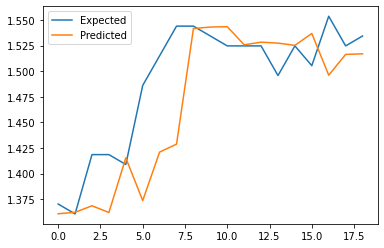

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.1, predicted=1.2
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.1, predicted=1.2
>expected=1.0, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=0.8, predicted=1.0
>expected=0.7, predicted=0.9
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.5
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.066


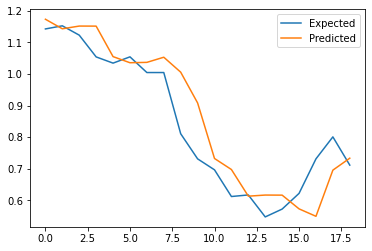

Shape of the array =  (62, 2)
>expected=1.2, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=0.8, predicted=1.0
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.5
>expected=0.7, predicted=0.6
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.063


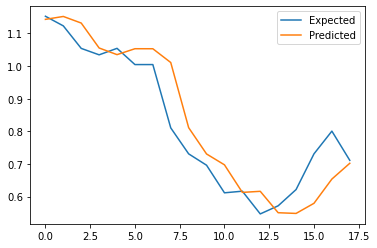

Shape of the array =  (57, 1)
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.021


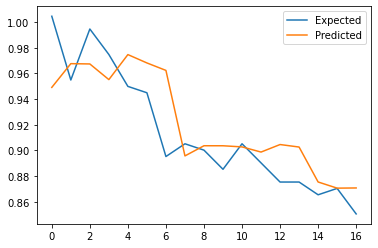

Shape of the array =  (57, 2)
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.025


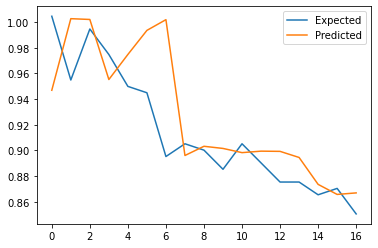

Shape of the array =  (61, 1)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
MAE: 0.008


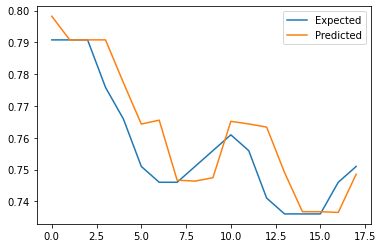

Shape of the array =  (61, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
MAE: 0.010


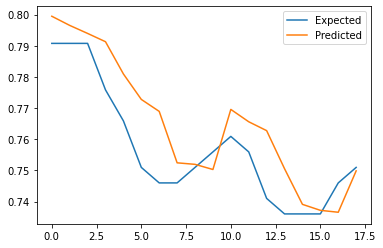

Shape of the array =  (63, 1)
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.032


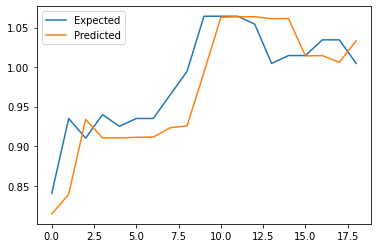

Shape of the array =  (63, 2)
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.032


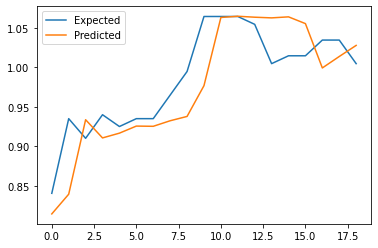

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.033


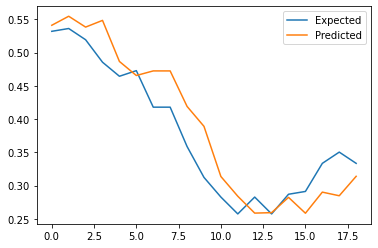

Shape of the array =  (62, 2)
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.029


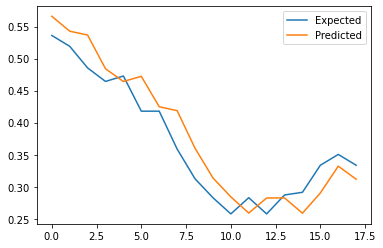

Shape of the array =  (57, 1)
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.015


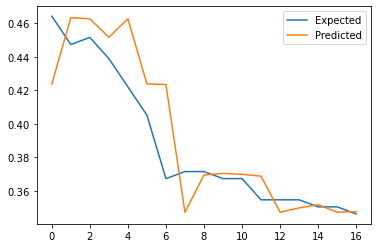

Shape of the array =  (57, 2)
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.014


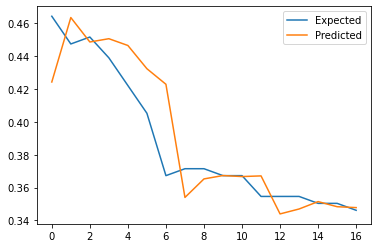

Shape of the array =  (61, 1)
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.005


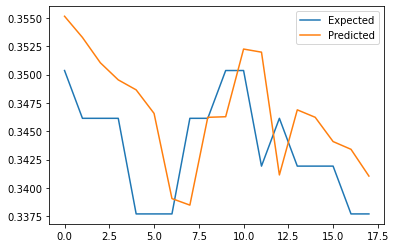

Shape of the array =  (61, 2)
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.005


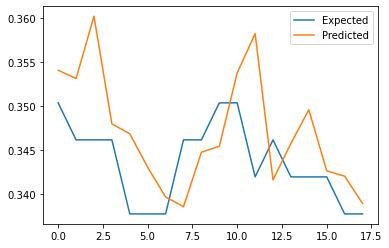

Shape of the array =  (63, 1)
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.015


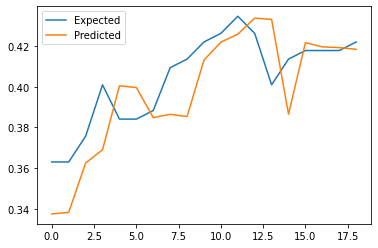

Shape of the array =  (63, 2)
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.012


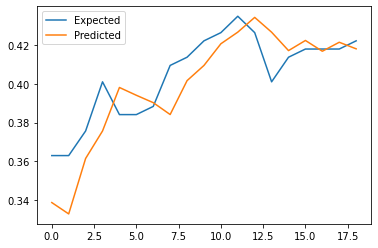

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.7
>expected=1.3, predicted=1.5
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.3, predicted=1.2
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.3, predicted=1.2
>expected=1.3, predicted=1.2
>expected=1.4, predicted=1.2
>expected=1.3, predicted=1.3
MAE: 0.059


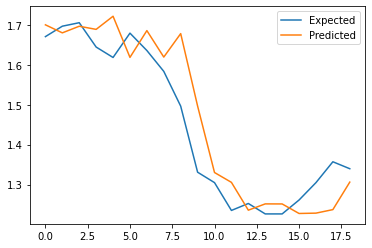

Shape of the array =  (62, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.5, predicted=1.7
>expected=1.3, predicted=1.5
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.3, predicted=1.2
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.2
>expected=1.3, predicted=1.2
>expected=1.3, predicted=1.3
>expected=1.4, predicted=1.3
>expected=1.3, predicted=1.3
MAE: 0.056


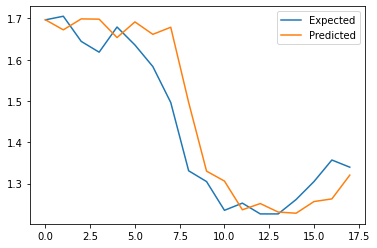

Shape of the array =  (57, 1)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
MAE: 0.020


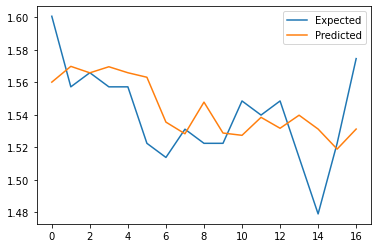

Shape of the array =  (57, 2)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
MAE: 0.022


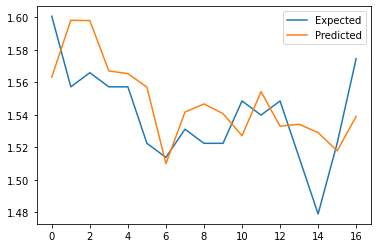

Shape of the array =  (61, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.016


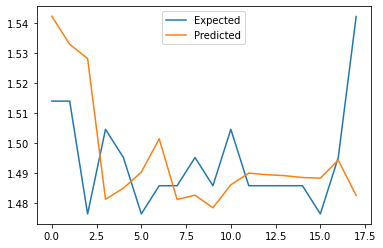

Shape of the array =  (61, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.020


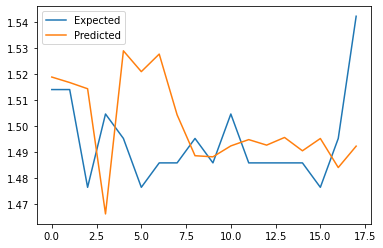

Shape of the array =  (63, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.028


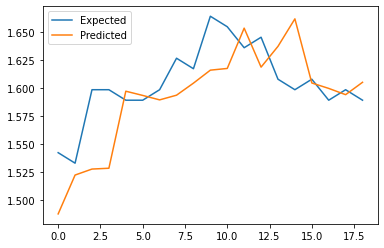

Shape of the array =  (63, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.021


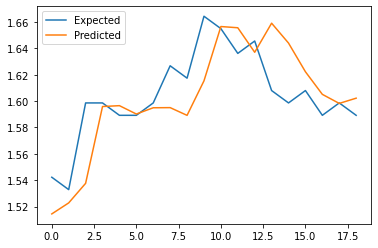

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.3, predicted=7.2
>expected=7.2, predicted=7.3
>expected=7.2, predicted=7.3
>expected=6.8, predicted=7.3
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.8, predicted=6.7
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=7.0
>expected=6.9, predicted=6.9
MAE: 0.066


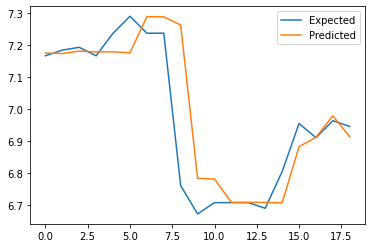

Shape of the array =  (62, 2)
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.2
>expected=7.2, predicted=7.1
>expected=7.3, predicted=7.2
>expected=7.2, predicted=7.3
>expected=7.2, predicted=7.2
>expected=6.8, predicted=7.2
>expected=6.7, predicted=6.6
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.8, predicted=6.7
>expected=7.0, predicted=6.8
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
MAE: 0.076


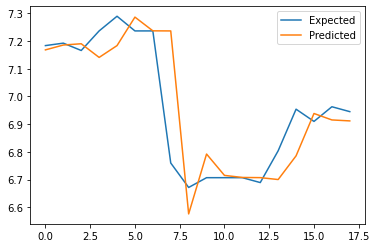

Shape of the array =  (57, 1)
>expected=7.3, predicted=6.9
>expected=7.3, predicted=6.9
>expected=7.3, predicted=7.3
>expected=7.3, predicted=7.3
>expected=7.1, predicted=7.3
>expected=7.3, predicted=6.9
>expected=7.2, predicted=7.1
>expected=7.2, predicted=7.3
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.3
>expected=6.9, predicted=7.1
>expected=7.1, predicted=6.9
>expected=7.1, predicted=7.3
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.3
MAE: 0.183


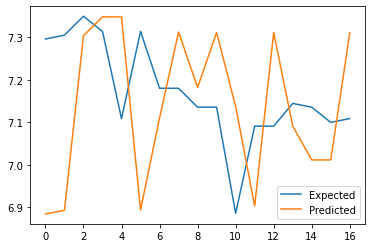

Shape of the array =  (57, 2)
>expected=7.3, predicted=6.9
>expected=7.3, predicted=6.9
>expected=7.3, predicted=7.3
>expected=7.3, predicted=7.3
>expected=7.1, predicted=7.3
>expected=7.3, predicted=7.0
>expected=7.2, predicted=7.3
>expected=7.2, predicted=7.3
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.3
>expected=6.9, predicted=7.2
>expected=7.1, predicted=6.9
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.3
MAE: 0.168


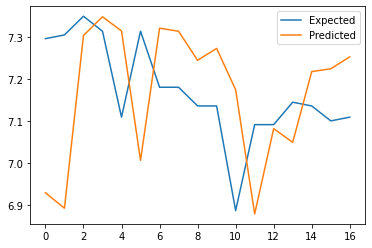

Shape of the array =  (61, 1)
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.0, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=7.0
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.0
>expected=7.1, predicted=7.1
>expected=7.0, predicted=7.0
>expected=6.9, predicted=7.1
>expected=6.9, predicted=6.9
MAE: 0.065


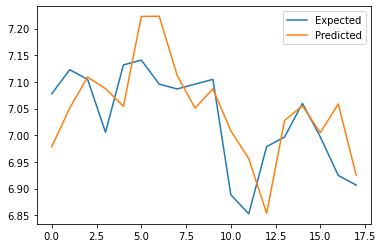

Shape of the array =  (61, 2)
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.1
>expected=7.0, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=6.9, predicted=7.1
>expected=6.9, predicted=7.0
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.1
>expected=7.1, predicted=7.0
>expected=7.0, predicted=7.1
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
MAE: 0.069


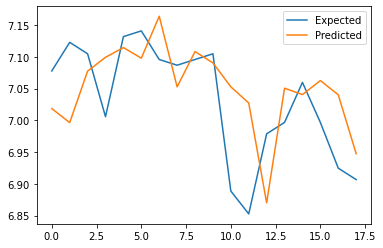

Shape of the array =  (63, 1)
>expected=6.9, predicted=6.8
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.2
>expected=6.8, predicted=6.9
>expected=6.7, predicted=7.0
>expected=6.5, predicted=6.9
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.5
MAE: 0.091


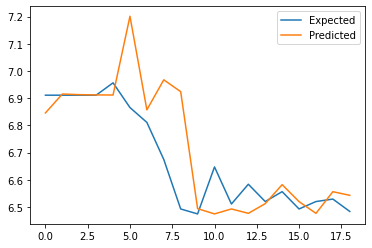

Shape of the array =  (63, 2)
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.5, predicted=6.9
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.6
MAE: 0.087


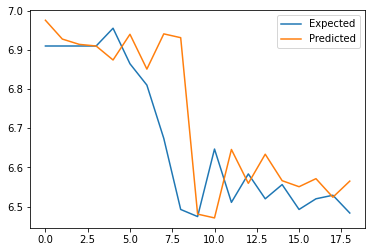

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.4, predicted=1.7
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.5
MAE: 0.049


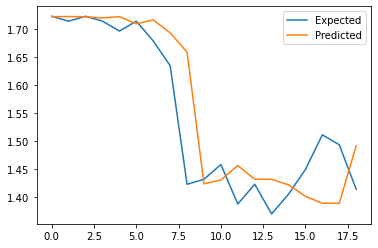

Shape of the array =  (62, 2)
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.4, predicted=1.7
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.5
MAE: 0.054


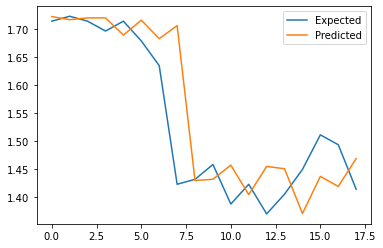

Shape of the array =  (57, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.021


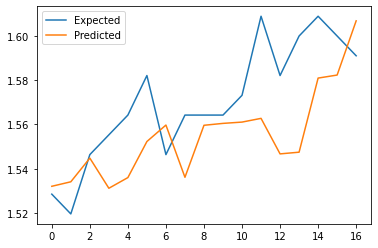

Shape of the array =  (57, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.018


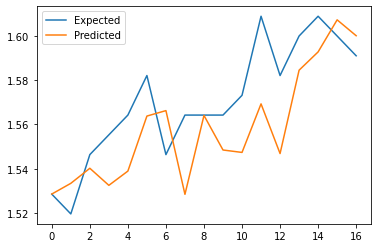

Shape of the array =  (61, 1)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.019


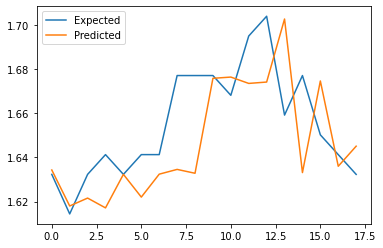

Shape of the array =  (61, 2)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.7
MAE: 0.024


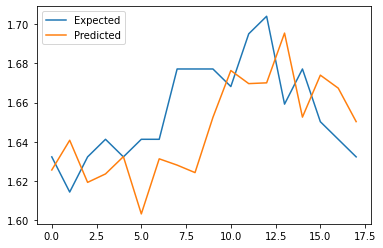

Shape of the array =  (63, 1)
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.017


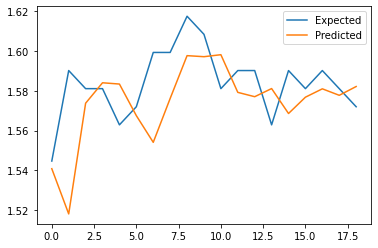

Shape of the array =  (63, 2)
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
MAE: 0.024


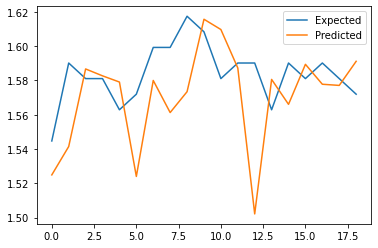

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
MAE: 0.037


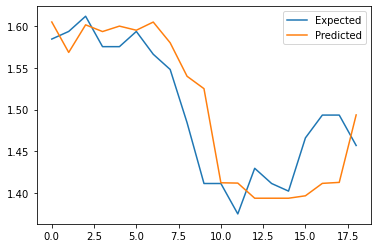

Shape of the array =  (62, 2)
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.043


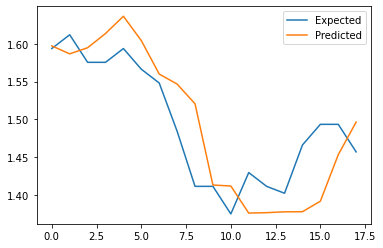

Shape of the array =  (57, 1)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.027


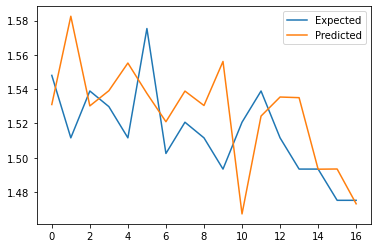

Shape of the array =  (57, 2)
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.028


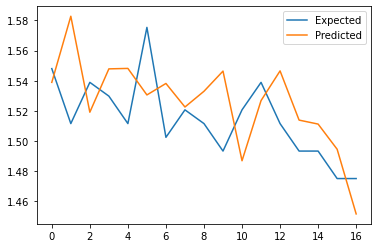

Shape of the array =  (61, 1)
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
MAE: 0.015


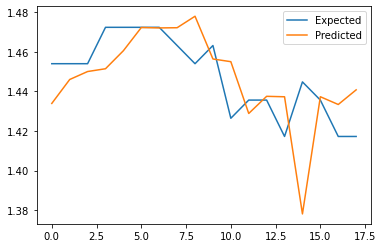

Shape of the array =  (61, 2)
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
MAE: 0.012


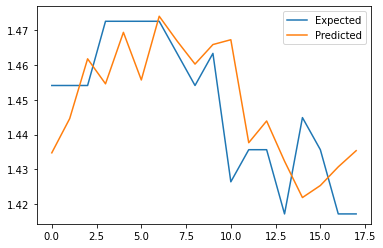

Shape of the array =  (63, 1)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
MAE: 0.026


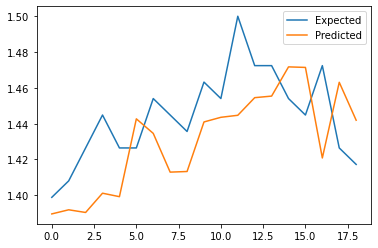

Shape of the array =  (63, 2)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.4, predicted=1.5
>expected=1.5, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.5
MAE: 0.024


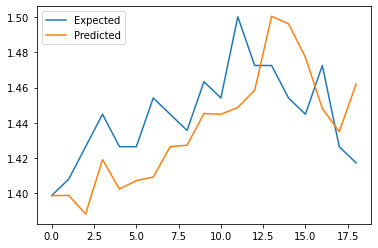

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.2
>expected=1.0, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=0.9, predicted=1.1
>expected=0.9, predicted=1.0
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.7
MAE: 0.047


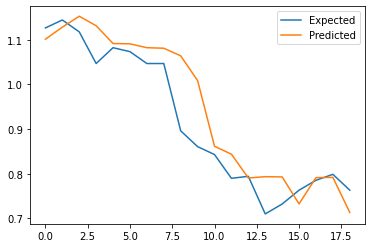

Shape of the array =  (62, 2)
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.7
MAE: 0.046


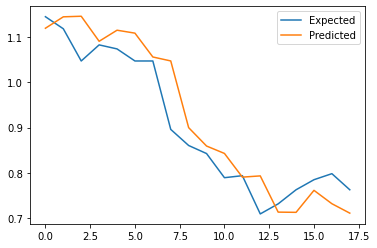

Shape of the array =  (57, 1)
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.031


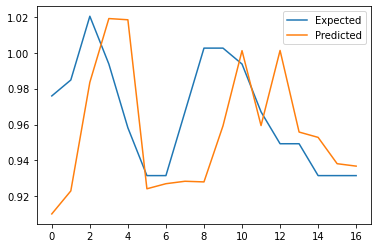

Shape of the array =  (57, 2)
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
MAE: 0.030


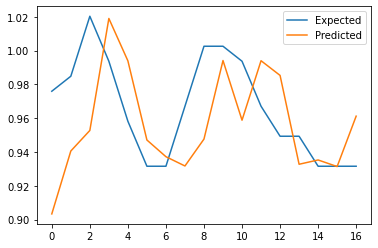

Shape of the array =  (61, 1)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.011


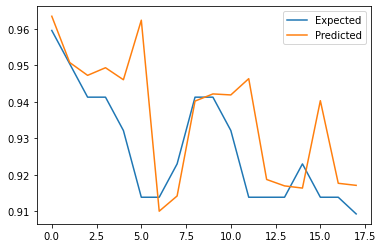

Shape of the array =  (61, 2)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.010


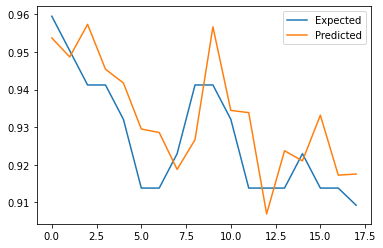

Shape of the array =  (63, 1)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.027


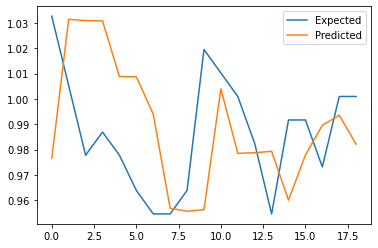

Shape of the array =  (63, 2)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.026


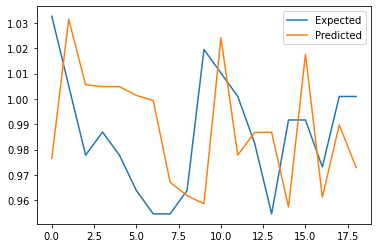

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.3
MAE: 0.031


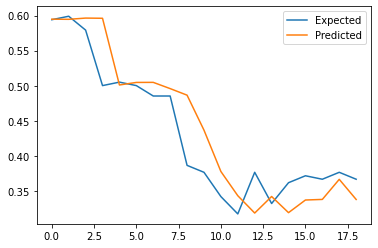

Shape of the array =  (62, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.3, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.032


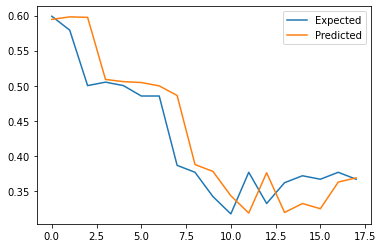

Shape of the array =  (57, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
MAE: 0.012


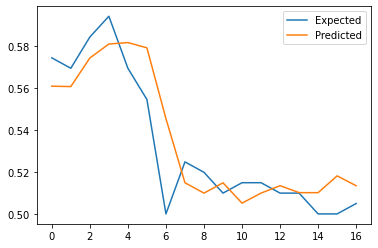

Shape of the array =  (57, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
MAE: 0.012


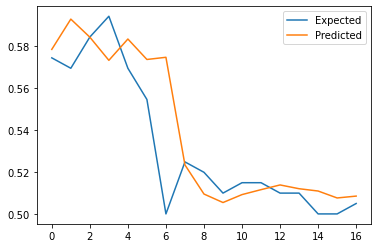

Shape of the array =  (61, 1)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
MAE: 0.020


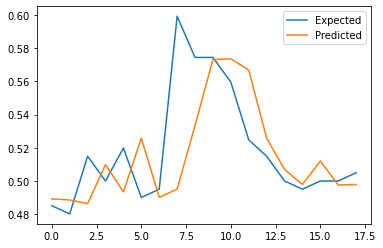

Shape of the array =  (61, 2)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
MAE: 0.023


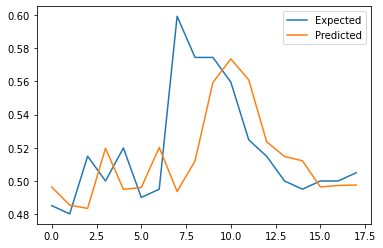

Shape of the array =  (63, 1)
>expected=0.6, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
MAE: 0.012


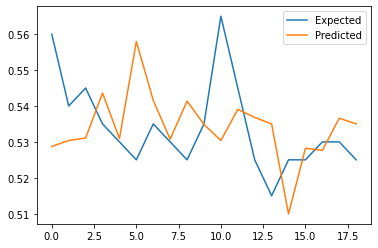

Shape of the array =  (63, 2)
>expected=0.6, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
MAE: 0.018


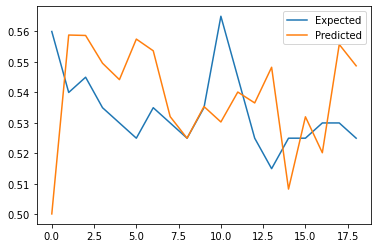

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.027


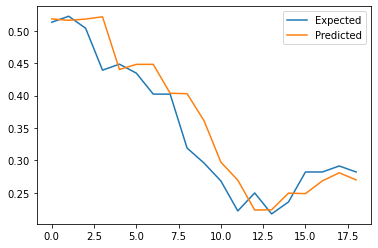

Shape of the array =  (62, 2)
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.031


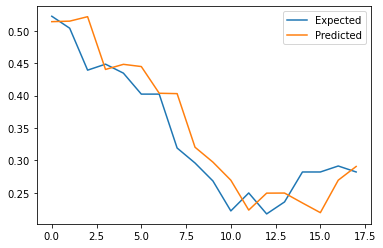

Shape of the array =  (57, 1)
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
MAE: 0.021


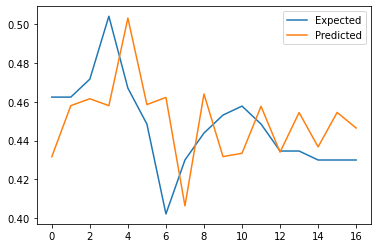

Shape of the array =  (57, 2)
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.015


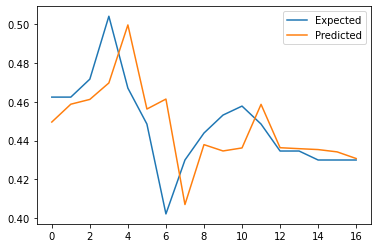

Shape of the array =  (61, 1)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.009


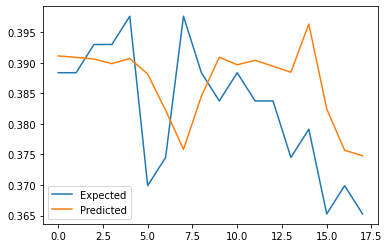

Shape of the array =  (61, 2)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.009


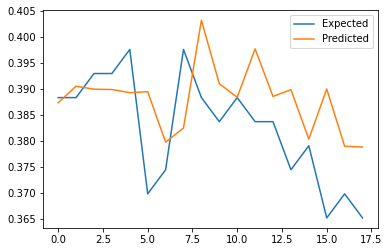

Shape of the array =  (63, 1)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.011


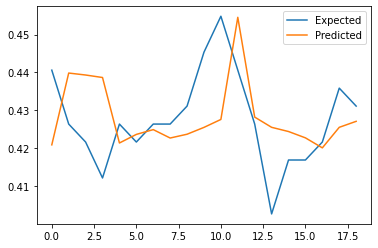

Shape of the array =  (63, 2)
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.011


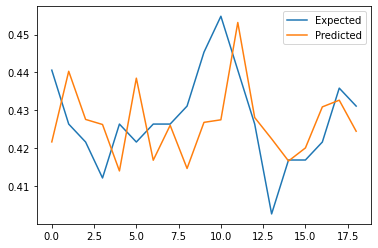

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.0, predicted=1.2
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.048


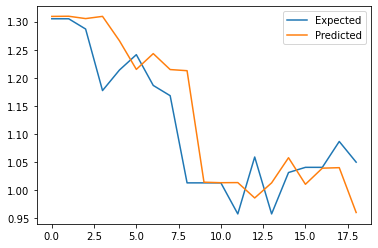

Shape of the array =  (62, 2)
>expected=1.3, predicted=1.3
>expected=1.3, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.3
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.2, predicted=1.2
>expected=1.0, predicted=1.2
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.0, predicted=1.1
MAE: 0.053


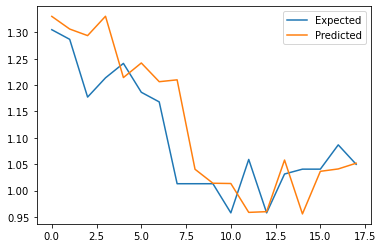

Shape of the array =  (57, 1)
>expected=1.4, predicted=1.4
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.6, predicted=1.4
>expected=1.6, predicted=1.4
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.6, predicted=1.4
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.043


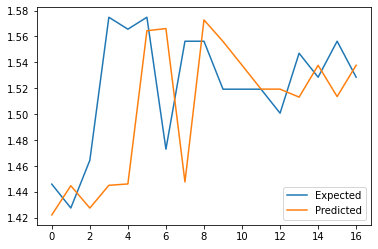

Shape of the array =  (57, 2)
>expected=1.4, predicted=1.5
>expected=1.4, predicted=1.4
>expected=1.5, predicted=1.4
>expected=1.6, predicted=1.4
>expected=1.6, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.5, predicted=1.5
>expected=1.6, predicted=1.5
>expected=1.5, predicted=1.5
MAE: 0.034


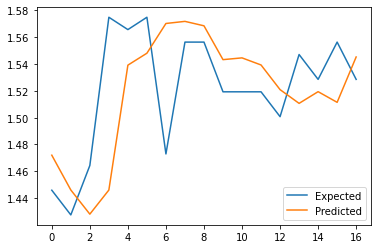

Shape of the array =  (61, 1)
>expected=2.1, predicted=2.2
>expected=2.0, predicted=2.2
>expected=2.0, predicted=2.1
>expected=1.9, predicted=2.0
>expected=1.9, predicted=1.9
>expected=1.9, predicted=2.0
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.1
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.1
>expected=2.2, predicted=2.1
MAE: 0.056


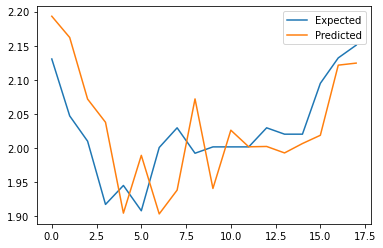

Shape of the array =  (61, 2)
>expected=2.1, predicted=2.1
>expected=2.0, predicted=2.1
>expected=2.0, predicted=1.9
>expected=1.9, predicted=2.1
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=1.9
>expected=2.0, predicted=2.1
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.0, predicted=2.0
>expected=2.1, predicted=2.0
>expected=2.1, predicted=2.2
>expected=2.2, predicted=2.1
MAE: 0.045


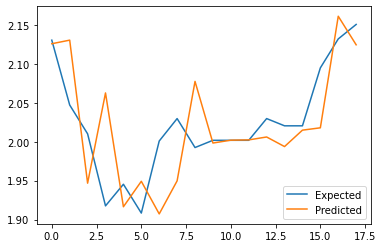

Shape of the array =  (63, 1)
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.5, predicted=2.4
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.6
MAE: 0.049


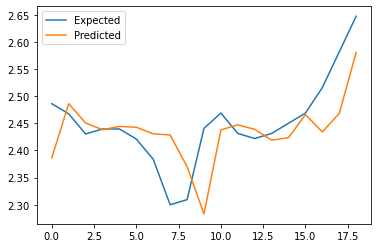

Shape of the array =  (63, 2)
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.4, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.3, predicted=2.4
>expected=2.3, predicted=2.3
>expected=2.4, predicted=2.3
>expected=2.5, predicted=2.5
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.4, predicted=2.4
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.4
>expected=2.5, predicted=2.5
>expected=2.6, predicted=2.5
>expected=2.6, predicted=2.5
MAE: 0.049


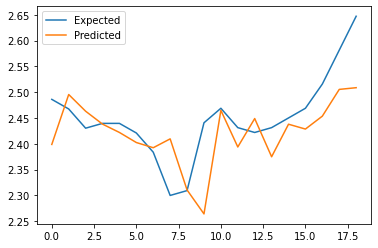

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
MAE: 0.025


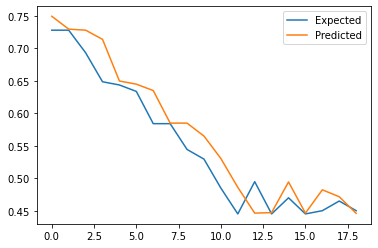

Shape of the array =  (62, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.4
>expected=0.4, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.4
MAE: 0.029


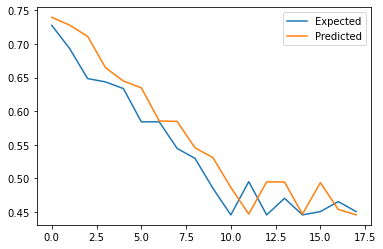

Shape of the array =  (57, 1)
>expected=0.6, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.025


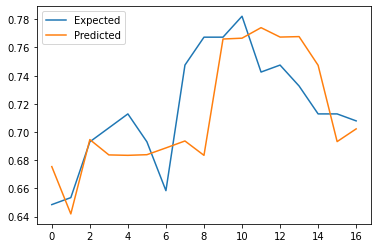

Shape of the array =  (57, 2)
>expected=0.6, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.027


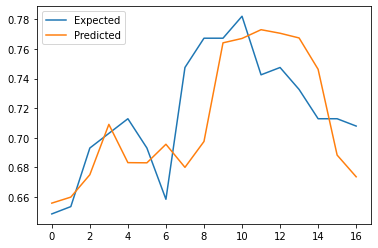

Shape of the array =  (61, 1)
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=0.9, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
MAE: 0.044


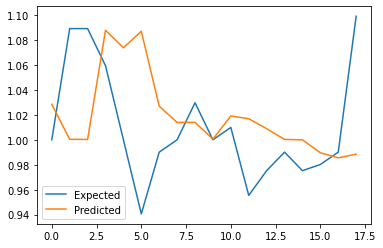

Shape of the array =  (61, 2)
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
>expected=1.1, predicted=1.1
>expected=1.1, predicted=1.1
>expected=1.0, predicted=1.1
>expected=0.9, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.1, predicted=1.0
MAE: 0.046


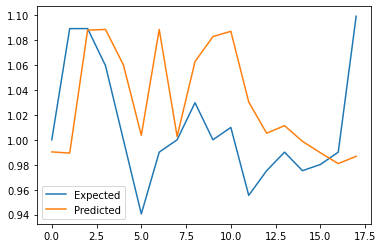

Shape of the array =  (63, 1)
>expected=1.9, predicted=1.9
>expected=1.8, predicted=1.9
>expected=1.7, predicted=1.9
>expected=1.7, predicted=1.9
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.8
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.7
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.7
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.2, predicted=1.9
MAE: 0.080


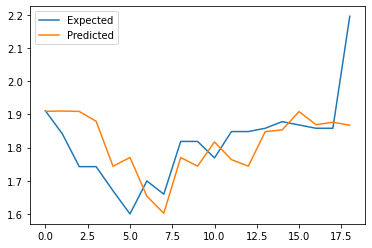

Shape of the array =  (63, 2)
>expected=1.9, predicted=1.9
>expected=1.8, predicted=1.9
>expected=1.7, predicted=1.8
>expected=1.7, predicted=1.9
>expected=1.7, predicted=1.7
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.6
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.8, predicted=1.8
>expected=1.9, predicted=1.8
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=1.9, predicted=1.9
>expected=2.2, predicted=1.9
MAE: 0.077


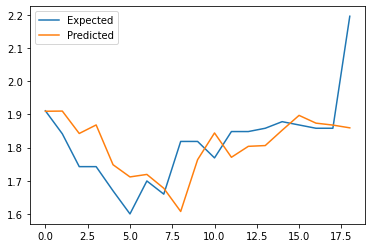

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.5
MAE: 0.027


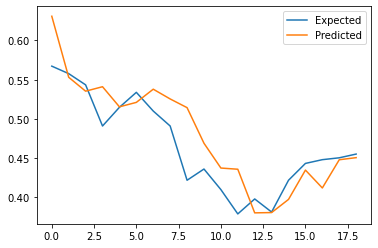

Shape of the array =  (62, 2)
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.5, predicted=0.5
>expected=0.4, predicted=0.5
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.5, predicted=0.4
>expected=0.5, predicted=0.4
MAE: 0.028


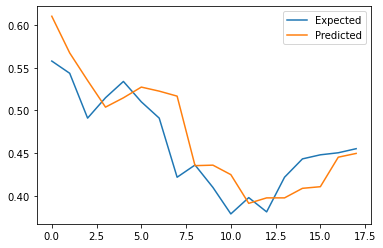

Shape of the array =  (57, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.026


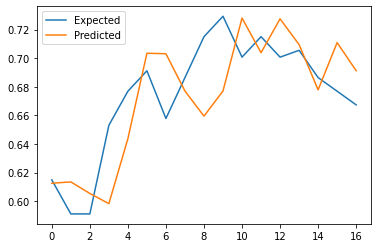

Shape of the array =  (57, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.025


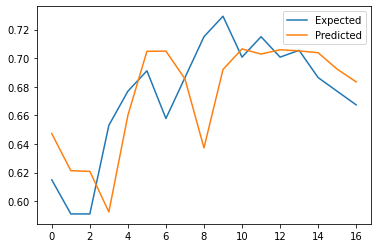

Shape of the array =  (61, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.015


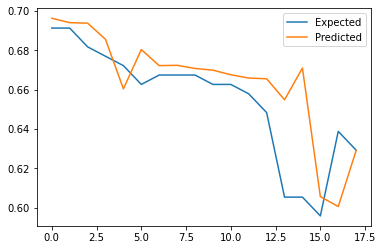

Shape of the array =  (61, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.013


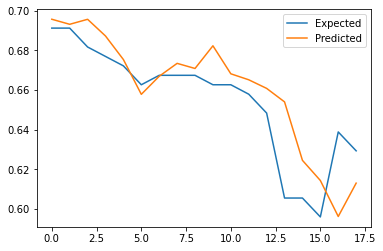

Shape of the array =  (63, 1)
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.032


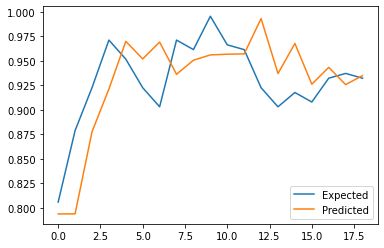

Shape of the array =  (63, 2)
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
MAE: 0.033


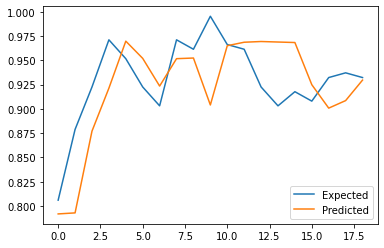

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.2
>expected=3.9, predicted=4.1
>expected=3.9, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.7, predicted=3.9
>expected=3.4, predicted=3.7
>expected=3.7, predicted=3.4
>expected=3.5, predicted=3.4
>expected=3.4, predicted=3.7
>expected=3.4, predicted=3.7
>expected=3.3, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.5, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.5, predicted=3.5
MAE: 0.130


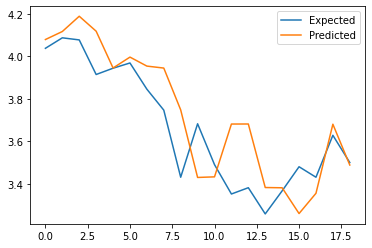

Shape of the array =  (62, 2)
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=3.9, predicted=4.1
>expected=3.9, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.7, predicted=3.9
>expected=3.4, predicted=3.8
>expected=3.7, predicted=3.4
>expected=3.5, predicted=3.7
>expected=3.4, predicted=3.7
>expected=3.4, predicted=3.5
>expected=3.3, predicted=3.5
>expected=3.4, predicted=3.3
>expected=3.5, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.5
MAE: 0.140


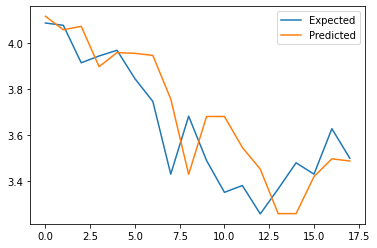

Shape of the array =  (57, 1)
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.0
>expected=4.2, predicted=4.1
>expected=4.4, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.3
>expected=4.5, predicted=4.3
>expected=4.5, predicted=4.3
>expected=4.6, predicted=4.5
>expected=4.5, predicted=4.6
MAE: 0.084


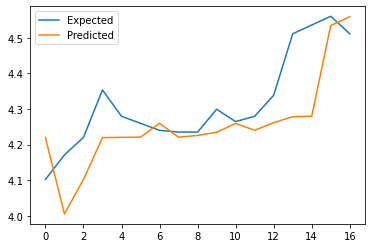

Shape of the array =  (57, 2)
>expected=4.1, predicted=4.2
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.4, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.3
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.5, predicted=4.3
>expected=4.5, predicted=4.5
>expected=4.6, predicted=4.5
>expected=4.5, predicted=4.6
MAE: 0.075


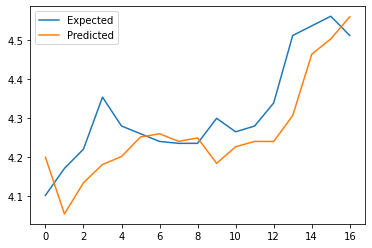

Shape of the array =  (61, 1)
>expected=6.3, predicted=6.2
>expected=6.2, predicted=6.0
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.2
>expected=5.8, predicted=6.0
>expected=6.1, predicted=5.9
>expected=6.3, predicted=6.1
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.6
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
MAE: 0.149


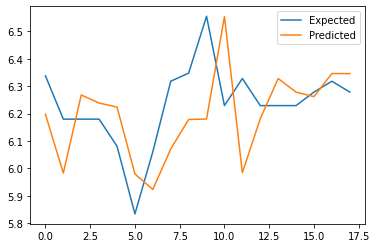

Shape of the array =  (61, 2)
>expected=6.3, predicted=6.2
>expected=6.2, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.2
>expected=6.1, predicted=6.2
>expected=5.8, predicted=5.9
>expected=6.1, predicted=5.7
>expected=6.3, predicted=6.1
>expected=6.3, predicted=6.2
>expected=6.6, predicted=6.2
>expected=6.2, predicted=6.4
>expected=6.3, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
>expected=6.3, predicted=6.3
MAE: 0.137


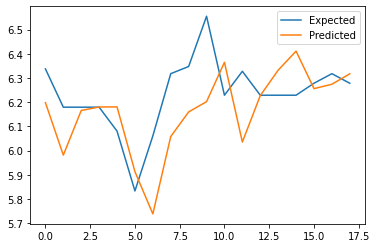

Shape of the array =  (63, 1)
>expected=7.4, predicted=7.4
>expected=7.4, predicted=7.4
>expected=7.6, predicted=7.4
>expected=7.5, predicted=7.4
>expected=7.5, predicted=7.4
>expected=7.3, predicted=7.4
>expected=7.3, predicted=7.4
>expected=7.0, predicted=7.3
>expected=7.0, predicted=6.9
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.1
>expected=7.3, predicted=7.1
>expected=7.3, predicted=7.1
>expected=7.2, predicted=7.4
MAE: 0.094


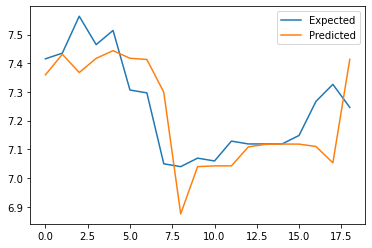

Shape of the array =  (63, 2)
>expected=7.4, predicted=7.4
>expected=7.4, predicted=7.4
>expected=7.6, predicted=7.5
>expected=7.5, predicted=7.3
>expected=7.5, predicted=7.5
>expected=7.3, predicted=7.4
>expected=7.3, predicted=7.3
>expected=7.0, predicted=7.3
>expected=7.0, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.1
>expected=7.1, predicted=7.0
>expected=7.1, predicted=7.2
>expected=7.1, predicted=7.1
>expected=7.3, predicted=7.2
>expected=7.3, predicted=7.3
>expected=7.2, predicted=7.4
MAE: 0.070


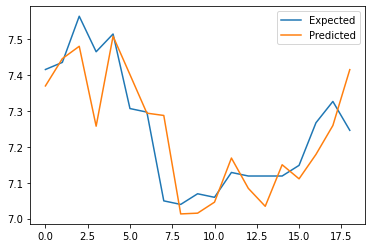

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.046


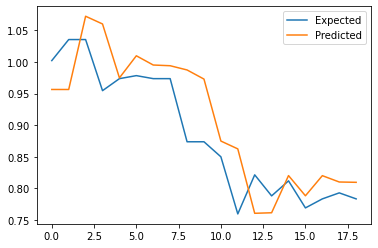

Shape of the array =  (62, 2)
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.1
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.034


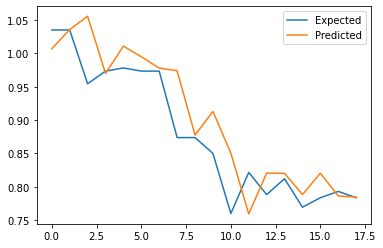

Shape of the array =  (57, 1)
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.021


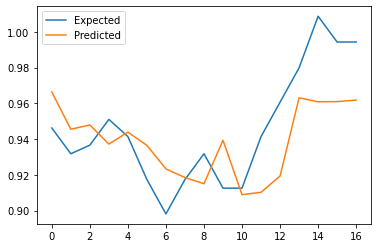

Shape of the array =  (57, 2)
>expected=0.9, predicted=1.0
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=1.0
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=0.9, predicted=0.9
>expected=1.0, predicted=0.9
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
>expected=1.0, predicted=1.0
MAE: 0.022


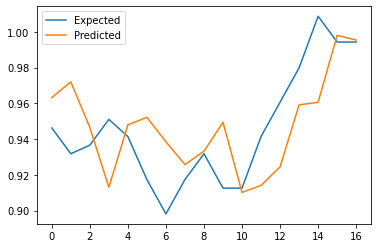

Shape of the array =  (61, 1)
>expected=1.8, predicted=1.8
>expected=1.7, predicted=1.8
>expected=1.7, predicted=1.8
>expected=1.6, predicted=1.8
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
MAE: 0.067


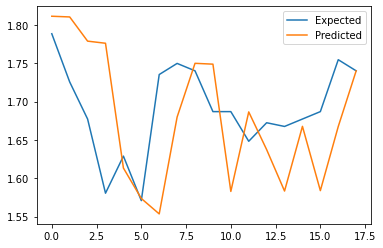

Shape of the array =  (61, 2)
>expected=1.8, predicted=1.8
>expected=1.7, predicted=1.8
>expected=1.7, predicted=1.8
>expected=1.6, predicted=1.7
>expected=1.6, predicted=1.6
>expected=1.6, predicted=1.6
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.6, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.7, predicted=1.6
>expected=1.7, predicted=1.7
>expected=1.8, predicted=1.7
>expected=1.7, predicted=1.7
MAE: 0.064


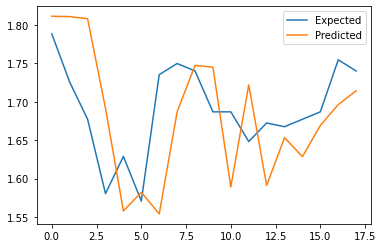

Shape of the array =  (63, 1)
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=3.3, predicted=2.8
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
MAE: 0.073


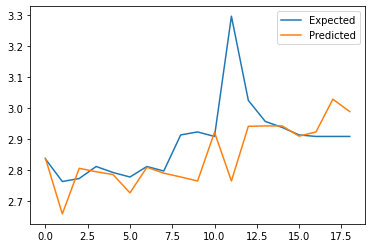

Shape of the array =  (63, 2)
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=3.3, predicted=2.8
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.8
>expected=2.9, predicted=3.3
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.1
>expected=2.9, predicted=3.1
>expected=2.9, predicted=3.1
MAE: 0.119


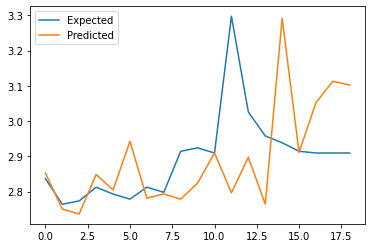

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.033


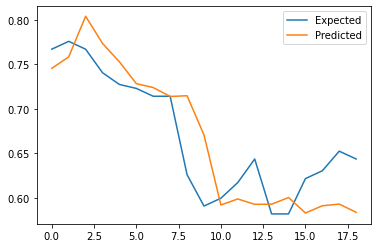

Shape of the array =  (62, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.027


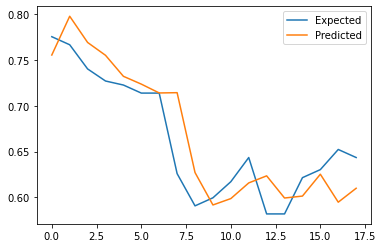

Shape of the array =  (57, 1)
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.030


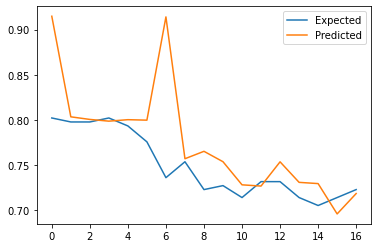

Shape of the array =  (57, 2)
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.029


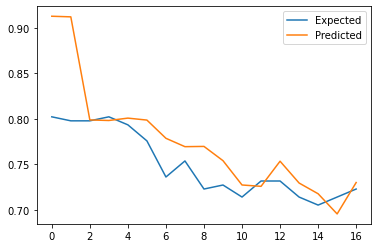

Shape of the array =  (61, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.015


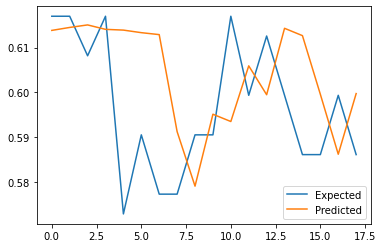

Shape of the array =  (61, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.015


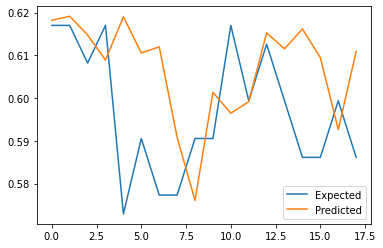

Shape of the array =  (63, 1)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.018


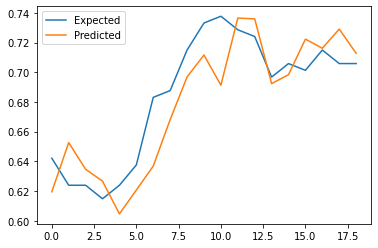

Shape of the array =  (63, 2)
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.7, predicted=0.6
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
MAE: 0.018


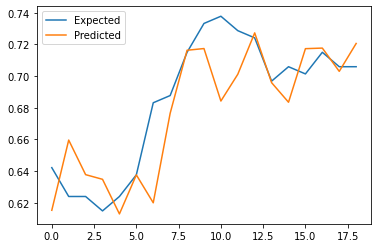

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=10.7, predicted=10.6
>expected=10.7, predicted=10.8
>expected=10.7, predicted=10.7
>expected=10.6, predicted=10.8
>expected=10.6, predicted=10.6
>expected=10.7, predicted=10.6
>expected=10.5, predicted=10.7
>expected=10.5, predicted=10.6
>expected=9.6, predicted=10.5
>expected=9.5, predicted=10.6
>expected=9.7, predicted=9.5
>expected=9.6, predicted=9.5
>expected=10.2, predicted=9.5
>expected=10.1, predicted=10.6
>expected=10.0, predicted=10.1
>expected=10.3, predicted=10.0
>expected=10.4, predicted=10.6
>expected=10.5, predicted=10.4
>expected=10.4, predicted=10.1
MAE: 0.266


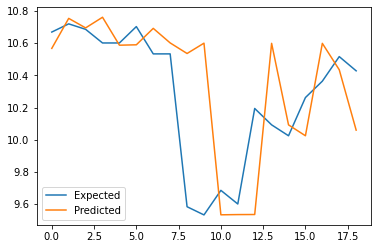

Shape of the array =  (62, 2)
>expected=10.7, predicted=10.7
>expected=10.7, predicted=10.7
>expected=10.6, predicted=10.7
>expected=10.6, predicted=10.8
>expected=10.7, predicted=10.7
>expected=10.5, predicted=10.7
>expected=10.5, predicted=10.5
>expected=9.6, predicted=10.5
>expected=9.5, predicted=10.0
>expected=9.7, predicted=9.8
>expected=9.6, predicted=9.7
>expected=10.2, predicted=9.7
>expected=10.1, predicted=10.2
>expected=10.0, predicted=10.5
>expected=10.3, predicted=10.0
>expected=10.4, predicted=10.3
>expected=10.5, predicted=10.5
>expected=10.4, predicted=10.1
MAE: 0.217


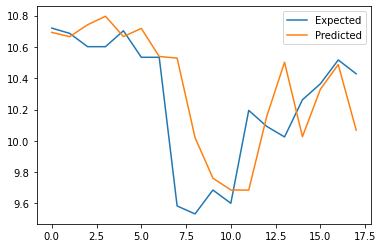

Shape of the array =  (57, 1)
>expected=10.6, predicted=10.6
>expected=10.6, predicted=10.7
>expected=10.5, predicted=10.6
>expected=10.6, predicted=10.2
>expected=10.6, predicted=10.5
>expected=10.5, predicted=10.5
>expected=10.4, predicted=10.4
>expected=10.6, predicted=10.5
>expected=10.5, predicted=10.6
>expected=10.4, predicted=10.4
>expected=10.4, predicted=10.6
>expected=10.4, predicted=10.4
>expected=10.5, predicted=10.4
>expected=10.4, predicted=10.4
>expected=10.2, predicted=10.5
>expected=10.1, predicted=10.2
>expected=10.2, predicted=10.1
MAE: 0.099


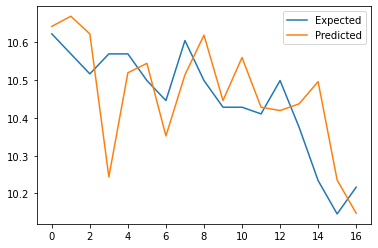

Shape of the array =  (57, 2)
>expected=10.6, predicted=10.9
>expected=10.6, predicted=10.6
>expected=10.5, predicted=10.6
>expected=10.6, predicted=10.2
>expected=10.6, predicted=10.6
>expected=10.5, predicted=10.6
>expected=10.4, predicted=10.6
>expected=10.6, predicted=10.5
>expected=10.5, predicted=10.6
>expected=10.4, predicted=10.4
>expected=10.4, predicted=10.6
>expected=10.4, predicted=10.6
>expected=10.5, predicted=10.4
>expected=10.4, predicted=10.5
>expected=10.2, predicted=10.5
>expected=10.1, predicted=10.3
>expected=10.2, predicted=10.1
MAE: 0.134


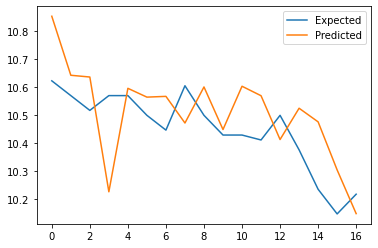

Shape of the array =  (61, 1)
>expected=9.8, predicted=10.0
>expected=9.9, predicted=9.7
>expected=9.8, predicted=9.8
>expected=10.0, predicted=9.9
>expected=9.9, predicted=10.1
>expected=10.2, predicted=9.8
>expected=10.1, predicted=10.2
>expected=9.9, predicted=10.1
>expected=9.7, predicted=10.2
>expected=9.8, predicted=9.8
>expected=9.6, predicted=9.9
>expected=9.6, predicted=9.7
>expected=9.7, predicted=9.6
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.6
>expected=9.6, predicted=9.7
MAE: 0.157


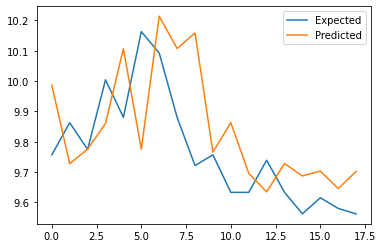

Shape of the array =  (61, 2)
>expected=9.8, predicted=9.9
>expected=9.9, predicted=9.8
>expected=9.8, predicted=9.8
>expected=10.0, predicted=9.8
>expected=9.9, predicted=9.9
>expected=10.2, predicted=9.9
>expected=10.1, predicted=9.9
>expected=9.9, predicted=10.0
>expected=9.7, predicted=10.0
>expected=9.8, predicted=9.8
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.8
>expected=9.7, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.7
>expected=9.6, predicted=9.8
>expected=9.6, predicted=9.6
MAE: 0.134


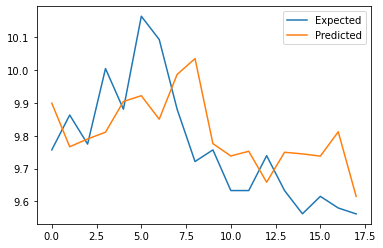

Shape of the array =  (63, 1)
>expected=9.9, predicted=9.9
>expected=9.9, predicted=9.7
>expected=9.8, predicted=9.7
>expected=9.7, predicted=9.7
>expected=9.6, predicted=9.9
>expected=9.5, predicted=9.1
>expected=9.3, predicted=9.2
>expected=9.6, predicted=9.4
>expected=9.7, predicted=9.5
>expected=9.7, predicted=9.9
>expected=9.7, predicted=9.9
>expected=9.7, predicted=9.8
>expected=9.6, predicted=9.8
>expected=9.5, predicted=9.5
>expected=9.6, predicted=9.7
>expected=9.7, predicted=9.5
>expected=9.5, predicted=9.6
>expected=9.5, predicted=9.6
>expected=9.5, predicted=9.6
MAE: 0.140


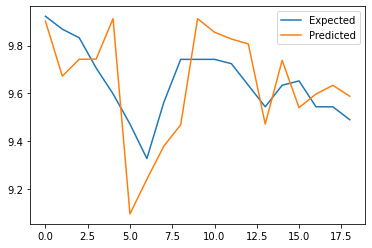

Shape of the array =  (63, 2)
>expected=9.9, predicted=9.9
>expected=9.9, predicted=9.9
>expected=9.8, predicted=9.8
>expected=9.7, predicted=9.9
>expected=9.6, predicted=9.9
>expected=9.5, predicted=9.2
>expected=9.3, predicted=9.8
>expected=9.6, predicted=9.2
>expected=9.7, predicted=9.4
>expected=9.7, predicted=9.8
>expected=9.7, predicted=9.9
>expected=9.7, predicted=9.8
>expected=9.6, predicted=9.8
>expected=9.5, predicted=9.9
>expected=9.6, predicted=9.5
>expected=9.7, predicted=9.4
>expected=9.5, predicted=9.6
>expected=9.5, predicted=9.6
>expected=9.5, predicted=10.0
MAE: 0.208


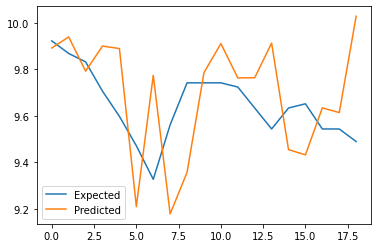

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.023


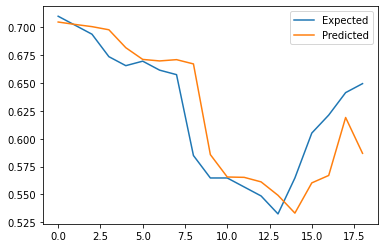

Shape of the array =  (62, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.6, predicted=0.7
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.5, predicted=0.6
>expected=0.5, predicted=0.5
>expected=0.6, predicted=0.5
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
>expected=0.6, predicted=0.6
MAE: 0.021


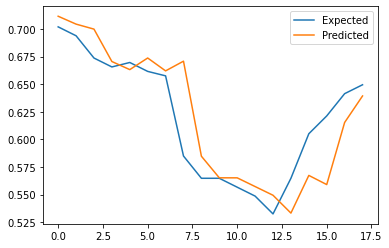

Shape of the array =  (57, 1)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
MAE: 0.014


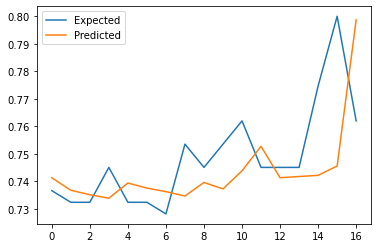

Shape of the array =  (57, 2)
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.7, predicted=0.8
>expected=0.7, predicted=0.7
>expected=0.7, predicted=0.7
>expected=0.8, predicted=0.7
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.014


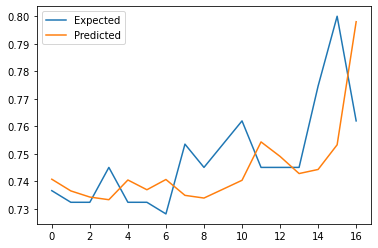

Shape of the array =  (61, 1)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.010


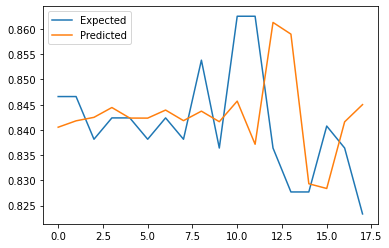

Shape of the array =  (61, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.9, predicted=0.8
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.9
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.012


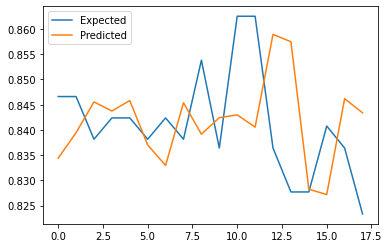

Shape of the array =  (63, 1)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.006


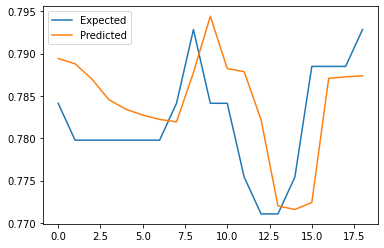

Shape of the array =  (63, 2)
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
>expected=0.8, predicted=0.8
MAE: 0.007


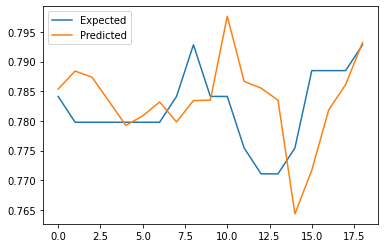

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=5.9, predicted=6.1
>expected=5.6, predicted=6.0
>expected=5.6, predicted=5.6
>expected=5.8, predicted=5.6
>expected=5.8, predicted=5.6
>expected=5.8, predicted=5.8
>expected=5.3, predicted=5.8
>expected=5.1, predicted=5.8
>expected=4.5, predicted=5.1
>expected=4.0, predicted=4.5
>expected=4.7, predicted=4.0
>expected=4.4, predicted=4.0
>expected=4.2, predicted=4.0
>expected=4.4, predicted=4.2
>expected=4.3, predicted=4.2
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
MAE: 0.255


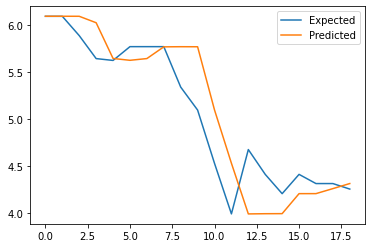

Shape of the array =  (62, 2)
>expected=6.1, predicted=6.1
>expected=5.9, predicted=6.1
>expected=5.6, predicted=6.0
>expected=5.6, predicted=5.6
>expected=5.8, predicted=5.6
>expected=5.8, predicted=5.8
>expected=5.8, predicted=5.7
>expected=5.3, predicted=5.8
>expected=5.1, predicted=5.6
>expected=4.5, predicted=5.3
>expected=4.0, predicted=4.5
>expected=4.7, predicted=4.0
>expected=4.4, predicted=4.7
>expected=4.2, predicted=4.3
>expected=4.4, predicted=4.3
>expected=4.3, predicted=4.4
>expected=4.3, predicted=4.4
>expected=4.3, predicted=4.3
MAE: 0.238


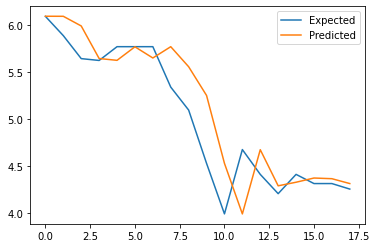

Shape of the array =  (57, 1)
>expected=5.8, predicted=5.2
>expected=5.5, predicted=5.8
>expected=6.1, predicted=5.2
>expected=6.1, predicted=5.8
>expected=5.9, predicted=6.1
>expected=5.9, predicted=6.0
>expected=5.8, predicted=5.9
>expected=5.9, predicted=5.5
>expected=5.9, predicted=5.9
>expected=5.8, predicted=5.9
>expected=5.7, predicted=5.7
>expected=5.4, predicted=5.7
>expected=5.6, predicted=6.1
>expected=5.7, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.7
>expected=5.6, predicted=5.6
MAE: 0.258


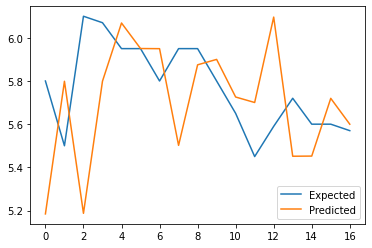

Shape of the array =  (57, 2)
>expected=5.8, predicted=5.2
>expected=5.5, predicted=5.2
>expected=6.1, predicted=5.3
>expected=6.1, predicted=5.8
>expected=5.9, predicted=5.5
>expected=5.9, predicted=5.9
>expected=5.8, predicted=5.9
>expected=5.9, predicted=5.8
>expected=5.9, predicted=6.0
>expected=5.8, predicted=5.8
>expected=5.7, predicted=5.9
>expected=5.4, predicted=6.1
>expected=5.6, predicted=6.1
>expected=5.7, predicted=5.5
>expected=5.6, predicted=5.6
>expected=5.6, predicted=5.6
>expected=5.6, predicted=5.6
MAE: 0.269


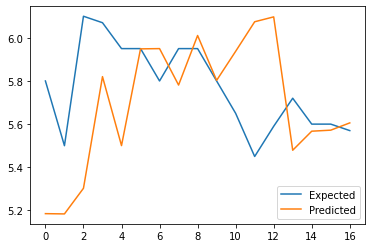

Shape of the array =  (61, 1)
>expected=5.2, predicted=5.2
>expected=5.0, predicted=5.2
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.3
>expected=5.2, predicted=5.0
>expected=5.0, predicted=5.3
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.0
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=5.1, predicted=4.8
>expected=4.9, predicted=5.0
>expected=4.8, predicted=4.9
>expected=4.8, predicted=5.0
MAE: 0.119


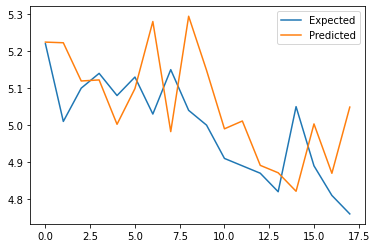

Shape of the array =  (61, 2)
>expected=5.2, predicted=5.3
>expected=5.0, predicted=5.1
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.2
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.2
>expected=5.2, predicted=5.1
>expected=5.0, predicted=5.2
>expected=5.0, predicted=5.1
>expected=4.9, predicted=5.0
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=5.1, predicted=4.8
>expected=4.9, predicted=5.1
>expected=4.8, predicted=4.8
>expected=4.8, predicted=5.0
MAE: 0.105


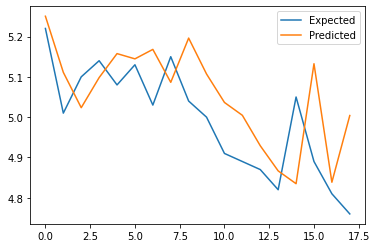

Shape of the array =  (63, 1)
>expected=5.5, predicted=5.4
>expected=5.5, predicted=5.5
>expected=5.7, predicted=5.5
>expected=5.8, predicted=5.5
>expected=5.8, predicted=5.6
>expected=5.8, predicted=5.7
>expected=5.8, predicted=5.7
>expected=6.2, predicted=5.6
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.2
>expected=6.0, predicted=6.2
>expected=5.8, predicted=6.2
>expected=5.7, predicted=5.8
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.5
>expected=6.0, predicted=5.5
>expected=5.9, predicted=5.8
>expected=5.8, predicted=5.9
MAE: 0.155


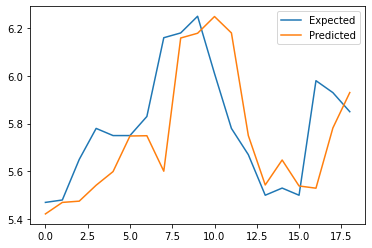

Shape of the array =  (63, 2)
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.7, predicted=5.5
>expected=5.8, predicted=5.6
>expected=5.8, predicted=5.3
>expected=5.8, predicted=5.4
>expected=5.8, predicted=5.7
>expected=6.2, predicted=5.6
>expected=6.2, predicted=5.8
>expected=6.2, predicted=6.2
>expected=6.0, predicted=6.2
>expected=5.8, predicted=6.0
>expected=5.7, predicted=5.6
>expected=5.5, predicted=5.8
>expected=5.5, predicted=5.2
>expected=5.5, predicted=5.6
>expected=6.0, predicted=5.6
>expected=5.9, predicted=6.1
>expected=5.8, predicted=6.2
MAE: 0.239


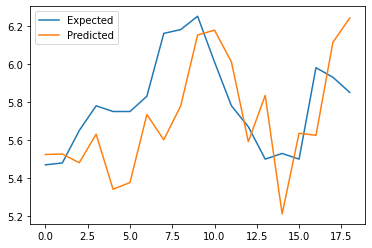

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.2, predicted=3.0
>expected=3.2, predicted=3.3
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.2, predicted=3.3
>expected=3.2, predicted=3.1
>expected=3.1, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=3.6, predicted=3.0
>expected=2.9, predicted=3.5
>expected=2.8, predicted=3.6
>expected=2.9, predicted=3.2
>expected=2.9, predicted=3.2
>expected=3.0, predicted=2.9
>expected=3.1, predicted=3.0
MAE: 0.192


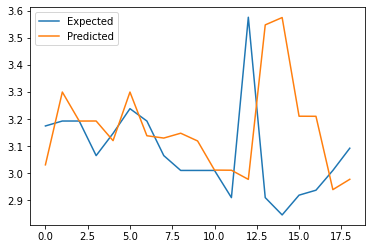

Shape of the array =  (62, 2)
>expected=3.2, predicted=3.3
>expected=3.2, predicted=3.3
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=3.6, predicted=3.0
>expected=2.9, predicted=3.4
>expected=2.8, predicted=3.9
>expected=2.9, predicted=3.3
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.1, predicted=3.0
MAE: 0.201


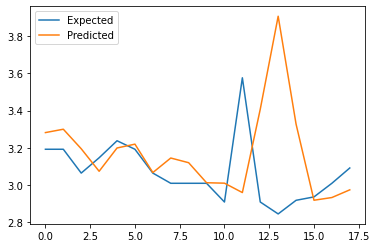

Shape of the array =  (57, 1)
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.4
>expected=3.4, predicted=3.5
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.2
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.6
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
MAE: 0.071


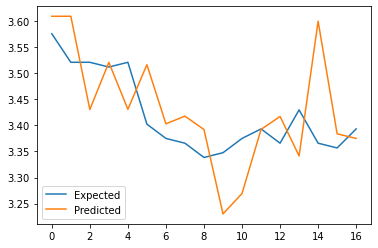

Shape of the array =  (57, 2)
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.6
>expected=3.4, predicted=3.5
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.2
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
MAE: 0.051


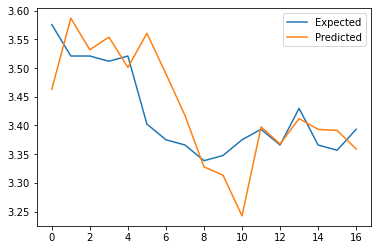

Shape of the array =  (61, 1)
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.4
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.4
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.6
MAE: 0.100


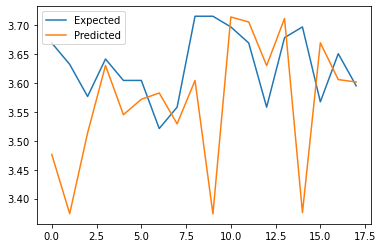

Shape of the array =  (61, 2)
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.4
>expected=3.7, predicted=3.5
>expected=3.7, predicted=3.4
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.6
MAE: 0.102


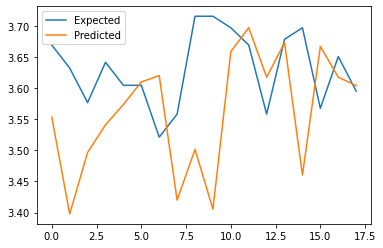

Shape of the array =  (63, 1)
>expected=4.1, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.2
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
MAE: 0.066


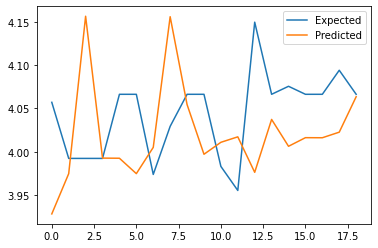

Shape of the array =  (63, 2)
>expected=4.1, predicted=3.9
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=3.9
>expected=4.1, predicted=3.9
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
MAE: 0.076


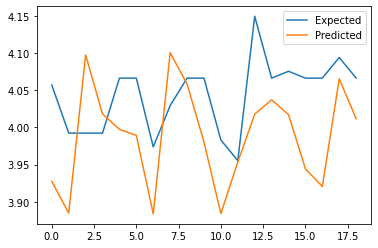

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=6.6, predicted=6.8
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=5.9, predicted=6.6
>expected=6.2, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.6, predicted=6.8
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.7, predicted=5.9
>expected=6.7, predicted=6.5
>expected=6.7, predicted=6.5
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.6
MAE: 0.176


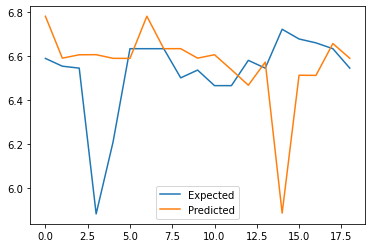

Shape of the array =  (62, 2)
>expected=6.6, predicted=6.7
>expected=6.5, predicted=6.6
>expected=5.9, predicted=6.6
>expected=6.2, predicted=6.3
>expected=6.6, predicted=6.4
>expected=6.6, predicted=6.8
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.7, predicted=6.1
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.6
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
MAE: 0.151


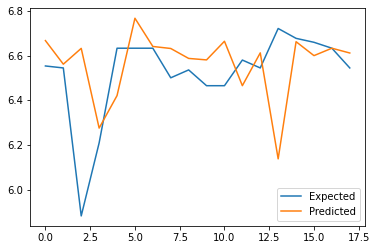

Shape of the array =  (57, 1)
>expected=7.5, predicted=7.3
>expected=7.4, predicted=7.0
>expected=7.4, predicted=7.4
>expected=7.4, predicted=7.5
>expected=7.4, predicted=7.4
>expected=7.3, predicted=7.4
>expected=7.2, predicted=7.4
>expected=7.3, predicted=7.4
>expected=7.3, predicted=7.2
>expected=7.0, predicted=7.3
>expected=6.9, predicted=7.0
>expected=7.0, predicted=7.0
>expected=6.9, predicted=6.9
>expected=7.0, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
MAE: 0.103


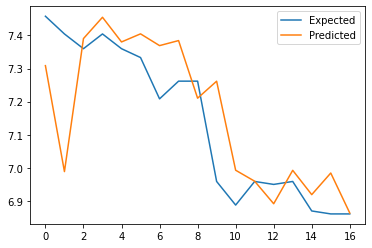

Shape of the array =  (57, 2)
>expected=7.5, predicted=7.4
>expected=7.4, predicted=7.4
>expected=7.4, predicted=7.0
>expected=7.4, predicted=7.5
>expected=7.4, predicted=7.4
>expected=7.3, predicted=7.4
>expected=7.2, predicted=7.4
>expected=7.3, predicted=7.3
>expected=7.3, predicted=7.3
>expected=7.0, predicted=7.3
>expected=6.9, predicted=7.0
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.0
>expected=7.0, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
MAE: 0.100


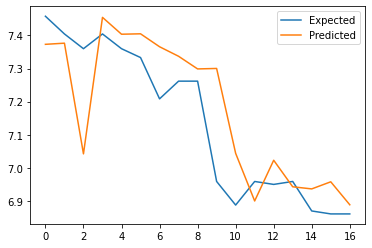

Shape of the array =  (61, 1)
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.8
>expected=6.9, predicted=6.8
>expected=6.9, predicted=7.0
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.8
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
MAE: 0.101


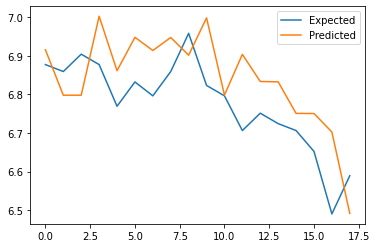

Shape of the array =  (61, 2)
>expected=6.9, predicted=7.0
>expected=6.9, predicted=6.9
>expected=6.9, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.8, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.9
>expected=6.9, predicted=6.9
>expected=7.0, predicted=6.8
>expected=6.8, predicted=7.0
>expected=6.8, predicted=6.9
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.8
>expected=6.7, predicted=6.9
>expected=6.7, predicted=6.7
>expected=6.7, predicted=6.7
>expected=6.5, predicted=6.7
>expected=6.6, predicted=6.5
MAE: 0.095


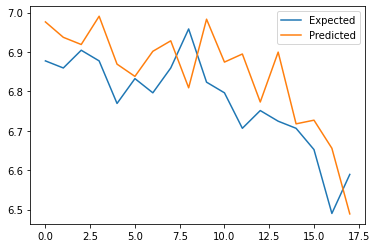

Shape of the array =  (63, 1)
>expected=6.3, predicted=6.1
>expected=6.4, predicted=6.2
>expected=6.5, predicted=6.2
>expected=6.5, predicted=6.2
>expected=6.4, predicted=6.2
>expected=6.2, predicted=6.2
>expected=6.2, predicted=6.5
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.1
>expected=5.8, predicted=5.9
>expected=5.9, predicted=5.9
>expected=5.8, predicted=5.9
>expected=5.9, predicted=5.8
>expected=5.9, predicted=5.8
>expected=6.1, predicted=6.0
>expected=6.2, predicted=6.2
>expected=6.3, predicted=6.0
MAE: 0.124


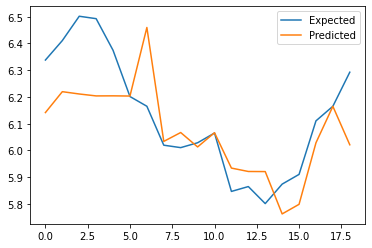

Shape of the array =  (63, 2)
>expected=6.3, predicted=6.3
>expected=6.4, predicted=6.2
>expected=6.5, predicted=6.1
>expected=6.5, predicted=6.4
>expected=6.4, predicted=6.5
>expected=6.2, predicted=6.3
>expected=6.2, predicted=6.3
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.0
>expected=5.8, predicted=6.0
>expected=5.9, predicted=5.8
>expected=5.8, predicted=5.9
>expected=5.9, predicted=5.8
>expected=5.9, predicted=6.0
>expected=6.1, predicted=5.9
>expected=6.2, predicted=6.1
>expected=6.3, predicted=6.1
MAE: 0.120


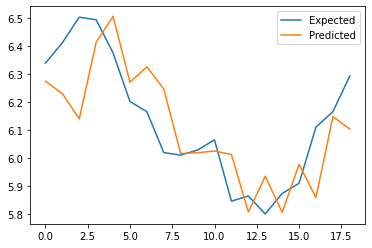

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=20.4, predicted=20.0
>expected=20.4, predicted=20.4
>expected=20.4, predicted=20.4
>expected=19.3, predicted=20.4
>expected=18.8, predicted=20.0
>expected=18.8, predicted=18.8
>expected=18.5, predicted=18.8
>expected=18.5, predicted=18.8
>expected=17.5, predicted=18.5
>expected=17.7, predicted=18.0
>expected=18.6, predicted=17.7
>expected=18.7, predicted=18.0
>expected=18.6, predicted=18.8
>expected=17.9, predicted=18.7
>expected=18.1, predicted=18.6
>expected=18.6, predicted=18.1
>expected=18.6, predicted=17.9
>expected=18.8, predicted=18.3
>expected=18.8, predicted=18.6
MAE: 0.514


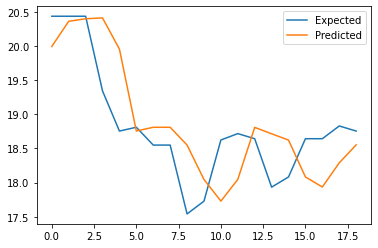

Shape of the array =  (62, 2)
>expected=20.4, predicted=20.0
>expected=20.4, predicted=20.3
>expected=19.3, predicted=20.4
>expected=18.8, predicted=19.7
>expected=18.8, predicted=18.8
>expected=18.5, predicted=18.8
>expected=18.5, predicted=18.6
>expected=17.5, predicted=18.6
>expected=17.7, predicted=17.5
>expected=18.6, predicted=17.7
>expected=18.7, predicted=18.2
>expected=18.6, predicted=18.0
>expected=17.9, predicted=18.6
>expected=18.1, predicted=18.4
>expected=18.6, predicted=18.6
>expected=18.6, predicted=18.7
>expected=18.8, predicted=18.1
>expected=18.8, predicted=18.8
MAE: 0.448


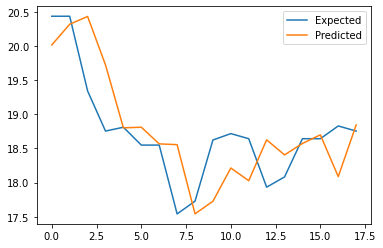

Shape of the array =  (57, 1)
>expected=20.7, predicted=19.1
>expected=20.5, predicted=20.7
>expected=21.0, predicted=19.1
>expected=20.9, predicted=20.6
>expected=20.6, predicted=20.9
>expected=20.6, predicted=21.0
>expected=19.1, predicted=20.6
>expected=19.2, predicted=18.9
>expected=19.4, predicted=18.8
>expected=19.7, predicted=19.2
>expected=20.7, predicted=19.6
>expected=20.9, predicted=20.6
>expected=21.2, predicted=20.6
>expected=20.2, predicted=20.9
>expected=19.8, predicted=19.1
>expected=19.6, predicted=19.9
>expected=19.2, predicted=19.6
MAE: 0.690


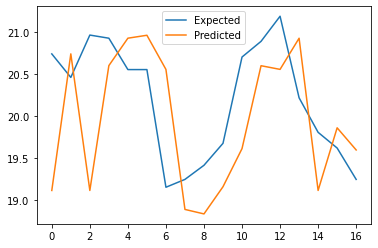

Shape of the array =  (57, 2)
>expected=20.7, predicted=20.1
>expected=20.5, predicted=20.6
>expected=21.0, predicted=20.3
>expected=20.9, predicted=20.5
>expected=20.6, predicted=20.7
>expected=20.6, predicted=21.0
>expected=19.1, predicted=20.5
>expected=19.2, predicted=18.6
>expected=19.4, predicted=19.1
>expected=19.7, predicted=19.3
>expected=20.7, predicted=19.2
>expected=20.9, predicted=19.8
>expected=21.2, predicted=20.5
>expected=20.2, predicted=20.6
>expected=19.8, predicted=20.7
>expected=19.6, predicted=19.8
>expected=19.2, predicted=19.6
MAE: 0.603


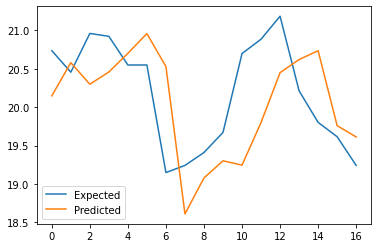

Shape of the array =  (61, 1)
>expected=19.3, predicted=19.1
>expected=19.3, predicted=19.2
>expected=19.4, predicted=19.2
>expected=20.3, predicted=19.4
>expected=19.8, predicted=20.1
>expected=19.5, predicted=19.4
>expected=19.2, predicted=19.8
>expected=19.1, predicted=19.2
>expected=19.3, predicted=19.1
>expected=19.0, predicted=19.0
>expected=19.8, predicted=19.1
>expected=19.1, predicted=19.6
>expected=19.2, predicted=19.3
>expected=18.9, predicted=19.1
>expected=18.8, predicted=19.6
>expected=18.5, predicted=18.8
>expected=18.6, predicted=19.0
>expected=18.3, predicted=18.6
MAE: 0.346


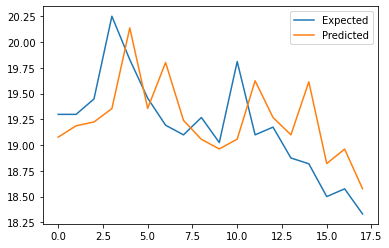

Shape of the array =  (61, 2)
>expected=19.3, predicted=19.4
>expected=19.3, predicted=19.5
>expected=19.4, predicted=19.3
>expected=20.3, predicted=19.4
>expected=19.8, predicted=20.0
>expected=19.5, predicted=19.1
>expected=19.2, predicted=19.9
>expected=19.1, predicted=19.4
>expected=19.3, predicted=19.3
>expected=19.0, predicted=19.1
>expected=19.8, predicted=19.6
>expected=19.1, predicted=19.5
>expected=19.2, predicted=19.5
>expected=18.9, predicted=19.1
>expected=18.8, predicted=19.3
>expected=18.5, predicted=19.0
>expected=18.6, predicted=18.5
>expected=18.3, predicted=18.7
MAE: 0.296


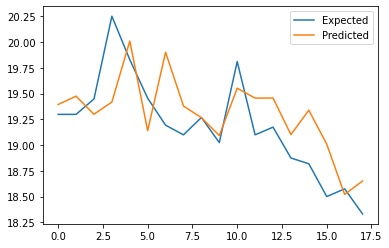

Shape of the array =  (63, 1)
>expected=20.2, predicted=20.6
>expected=19.4, predicted=20.2
>expected=19.4, predicted=19.5
>expected=19.4, predicted=19.4
>expected=19.5, predicted=19.5
>expected=19.2, predicted=20.0
>expected=19.2, predicted=19.4
>expected=19.4, predicted=19.2
>expected=19.5, predicted=19.4
>expected=19.3, predicted=19.2
>expected=18.8, predicted=19.5
>expected=20.0, predicted=18.2
>expected=19.8, predicted=20.2
>expected=19.8, predicted=20.6
>expected=19.9, predicted=19.8
>expected=20.0, predicted=20.6
>expected=20.0, predicted=19.8
>expected=20.0, predicted=20.0
>expected=20.1, predicted=19.8
MAE: 0.405


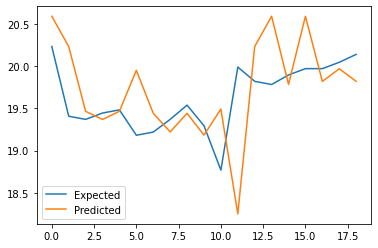

Shape of the array =  (63, 2)
>expected=20.2, predicted=20.1
>expected=19.4, predicted=20.6
>expected=19.4, predicted=19.4
>expected=19.4, predicted=19.4
>expected=19.5, predicted=19.3
>expected=19.2, predicted=20.0
>expected=19.2, predicted=19.6
>expected=19.4, predicted=19.1
>expected=19.5, predicted=19.2
>expected=19.3, predicted=20.0
>expected=18.8, predicted=19.4
>expected=20.0, predicted=18.1
>expected=19.8, predicted=19.5
>expected=19.8, predicted=19.6
>expected=19.9, predicted=20.7
>expected=20.0, predicted=20.2
>expected=20.0, predicted=20.4
>expected=20.0, predicted=19.9
>expected=20.1, predicted=19.7
MAE: 0.474


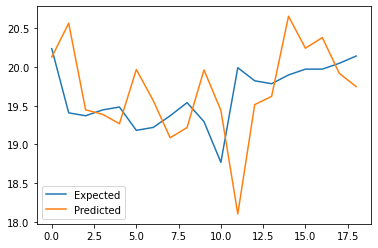

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=2.9, predicted=3.4
>expected=3.0, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.0
>expected=2.6, predicted=3.0
>expected=2.6, predicted=3.0
>expected=2.4, predicted=2.6
>expected=2.2, predicted=2.4
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.5, predicted=2.2
>expected=2.5, predicted=2.2
>expected=2.6, predicted=2.5
>expected=2.3, predicted=2.4
MAE: 0.160


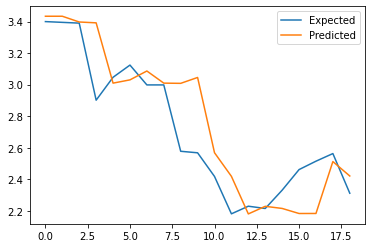

Shape of the array =  (62, 2)
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=2.9, predicted=3.4
>expected=3.0, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.2
>expected=3.0, predicted=3.0
>expected=2.6, predicted=3.0
>expected=2.6, predicted=2.9
>expected=2.4, predicted=2.6
>expected=2.2, predicted=2.4
>expected=2.2, predicted=2.2
>expected=2.2, predicted=2.2
>expected=2.3, predicted=2.2
>expected=2.5, predicted=2.2
>expected=2.5, predicted=2.3
>expected=2.6, predicted=2.4
>expected=2.3, predicted=2.6
MAE: 0.168


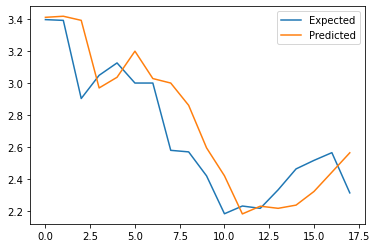

Shape of the array =  (57, 1)
>expected=2.8, predicted=2.7
>expected=2.9, predicted=2.8
>expected=3.0, predicted=2.8
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.1
>expected=3.1, predicted=3.1
>expected=2.9, predicted=3.1
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.1
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=3.0
MAE: 0.096


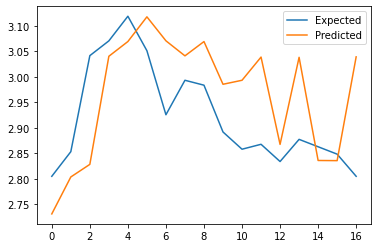

Shape of the array =  (57, 2)
>expected=2.8, predicted=2.7
>expected=2.9, predicted=2.7
>expected=3.0, predicted=2.9
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.1
>expected=3.1, predicted=3.1
>expected=2.9, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
MAE: 0.088


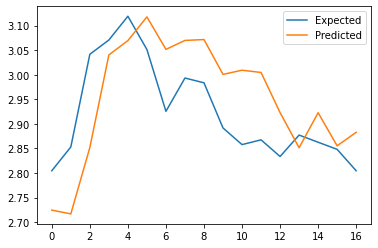

Shape of the array =  (61, 1)
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
MAE: 0.036


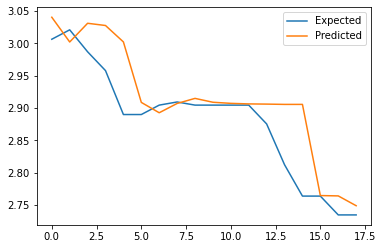

Shape of the array =  (61, 2)
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.7, predicted=2.7
MAE: 0.029


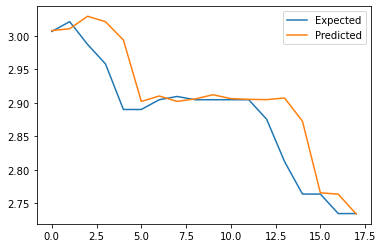

Shape of the array =  (63, 1)
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.7
>expected=2.7, predicted=2.6
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.6
>expected=2.7, predicted=2.7
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
MAE: 0.062


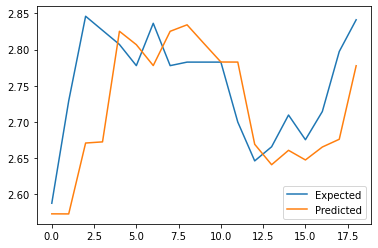

Shape of the array =  (63, 2)
>expected=2.6, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.7, predicted=2.8
>expected=2.6, predicted=2.7
>expected=2.7, predicted=2.6
>expected=2.7, predicted=2.6
>expected=2.7, predicted=2.7
>expected=2.7, predicted=2.6
>expected=2.8, predicted=2.7
>expected=2.8, predicted=2.7
MAE: 0.056


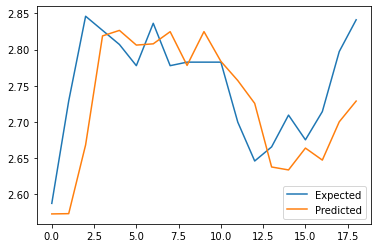

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=2.9, predicted=3.2
>expected=3.0, predicted=3.2
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.2
>expected=2.7, predicted=3.2
>expected=2.8, predicted=3.0
>expected=2.9, predicted=2.8
>expected=2.8, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.8, predicted=3.0
>expected=2.8, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=2.9, predicted=3.0
MAE: 0.130


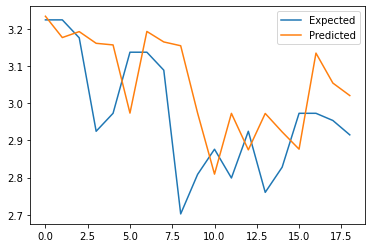

Shape of the array =  (62, 2)
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=2.9, predicted=3.2
>expected=3.0, predicted=3.2
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.2
>expected=2.7, predicted=3.1
>expected=2.8, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.8, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=3.0
>expected=3.0, predicted=2.8
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
MAE: 0.113


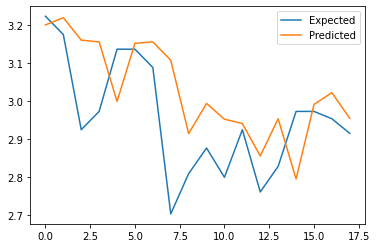

Shape of the array =  (57, 1)
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.4
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
MAE: 0.056


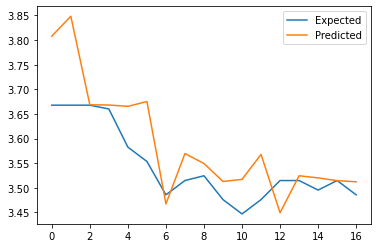

Shape of the array =  (57, 2)
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
MAE: 0.042


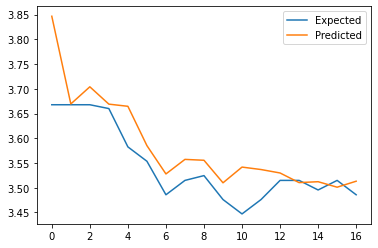

Shape of the array =  (61, 1)
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.7
MAE: 0.035


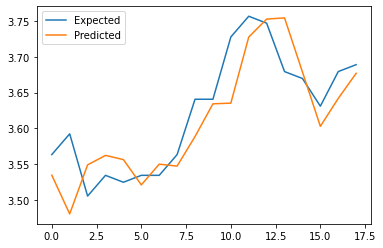

Shape of the array =  (61, 2)
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.7, predicted=3.7
MAE: 0.037


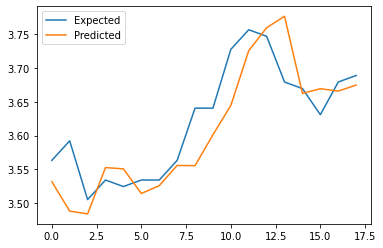

Shape of the array =  (63, 1)
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.7
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.6
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
MAE: 0.048


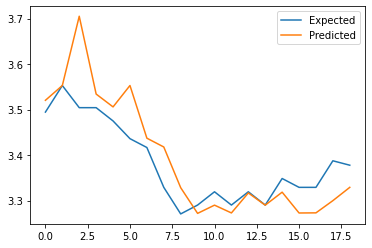

Shape of the array =  (63, 2)
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.6
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
MAE: 0.049


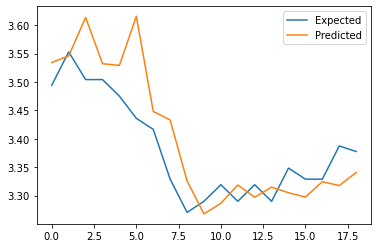

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.1, predicted=0.2
>expected=0.1, predicted=0.2
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
MAE: 0.021


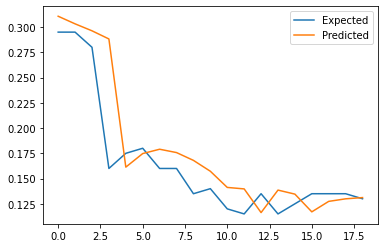

Shape of the array =  (62, 2)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.1, predicted=0.2
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
>expected=0.1, predicted=0.1
MAE: 0.020


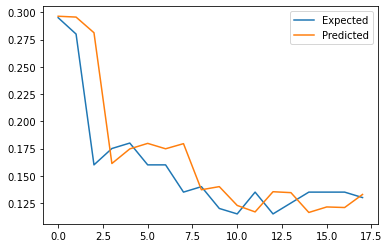

Shape of the array =  (57, 1)
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
MAE: 0.010


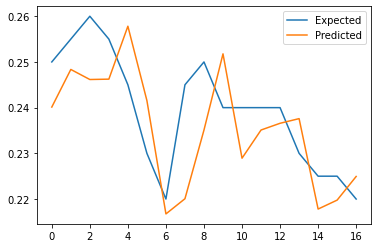

Shape of the array =  (57, 2)
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
>expected=0.2, predicted=0.2
MAE: 0.009


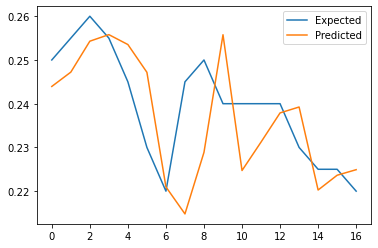

Shape of the array =  (61, 1)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.008


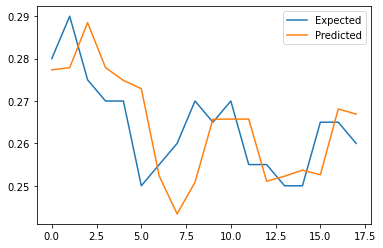

Shape of the array =  (61, 2)
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.2, predicted=0.3
>expected=0.2, predicted=0.2
>expected=0.3, predicted=0.2
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
MAE: 0.010


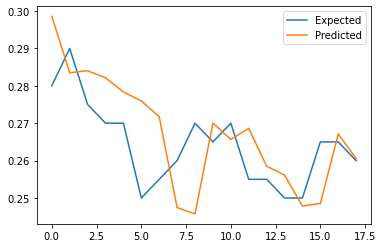

Shape of the array =  (63, 1)
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.3
>expected=0.3, predicted=0.3
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.011


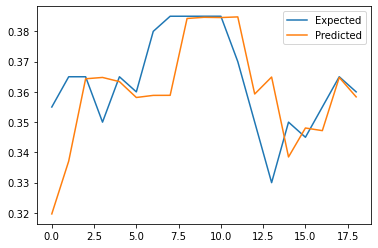

Shape of the array =  (63, 2)
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.3, predicted=0.4
>expected=0.4, predicted=0.3
>expected=0.4, predicted=0.4
>expected=0.4, predicted=0.4
MAE: 0.012


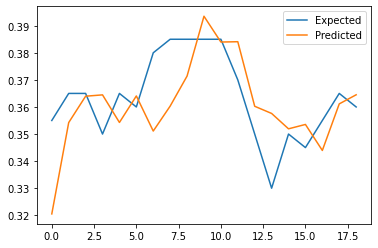

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=4.8, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.6, predicted=4.9
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.1, predicted=4.7
>expected=4.0, predicted=4.7
>expected=3.9, predicted=4.0
>expected=3.6, predicted=3.9
>expected=4.2, predicted=3.6
>expected=4.0, predicted=4.0
>expected=4.2, predicted=3.9
>expected=4.2, predicted=4.0
>expected=4.2, predicted=4.0
>expected=4.2, predicted=4.0
>expected=4.1, predicted=4.0
MAE: 0.208


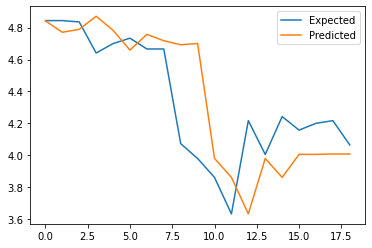

Shape of the array =  (62, 2)
>expected=4.8, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.6, predicted=4.9
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.1, predicted=4.7
>expected=4.0, predicted=4.3
>expected=3.9, predicted=4.0
>expected=3.6, predicted=3.9
>expected=4.2, predicted=3.6
>expected=4.0, predicted=4.2
>expected=4.2, predicted=3.9
>expected=4.2, predicted=3.9
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.1, predicted=4.2
MAE: 0.192


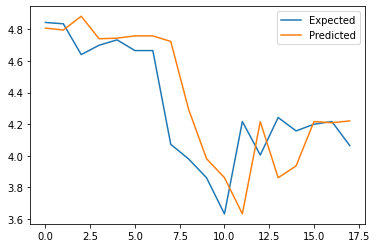

Shape of the array =  (57, 1)
>expected=4.7, predicted=4.0
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.5, predicted=4.6
>expected=4.4, predicted=4.7
>expected=4.3, predicted=4.4
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.104


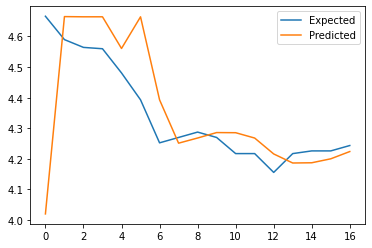

Shape of the array =  (57, 2)
>expected=4.7, predicted=4.0
>expected=4.6, predicted=4.2
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.5, predicted=4.6
>expected=4.4, predicted=4.5
>expected=4.3, predicted=4.4
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.3
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
>expected=4.2, predicted=4.2
MAE: 0.102


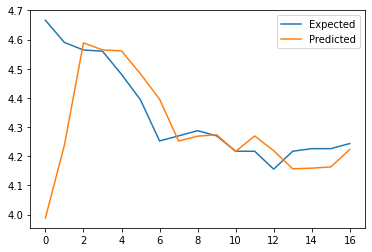

Shape of the array =  (61, 1)
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
MAE: 0.048


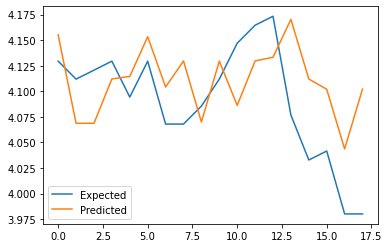

Shape of the array =  (61, 2)
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.2, predicted=4.1
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
MAE: 0.050


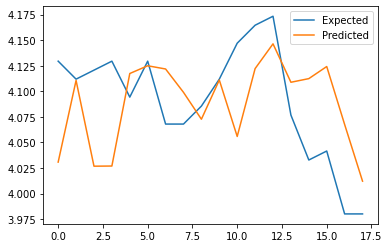

Shape of the array =  (63, 1)
>expected=5.0, predicted=4.7
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.1
>expected=5.0, predicted=4.9
>expected=4.9, predicted=5.0
>expected=4.7, predicted=4.9
>expected=4.8, predicted=5.0
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.8, predicted=4.7
>expected=4.9, predicted=4.8
>expected=4.9, predicted=4.7
>expected=4.8, predicted=4.9
MAE: 0.100


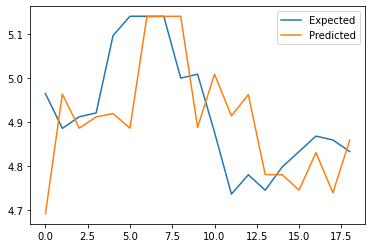

Shape of the array =  (63, 2)
>expected=5.0, predicted=4.5
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.1, predicted=4.9
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.1
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.7
>expected=4.8, predicted=4.8
>expected=4.9, predicted=4.8
>expected=4.9, predicted=4.8
>expected=4.8, predicted=5.0
MAE: 0.121


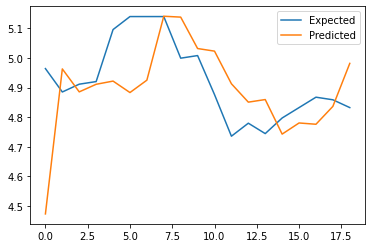

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=14.7, predicted=14.2
>expected=14.5, predicted=14.8
>expected=14.4, predicted=14.7
>expected=14.0, predicted=14.7
>expected=14.0, predicted=14.2
>expected=14.1, predicted=14.0
>expected=13.7, predicted=14.3
>expected=13.7, predicted=14.4
>expected=12.2, predicted=13.7
>expected=11.8, predicted=12.9
>expected=11.6, predicted=11.8
>expected=11.2, predicted=11.6
>expected=11.7, predicted=11.2
>expected=11.9, predicted=11.6
>expected=13.3, predicted=11.6
>expected=13.3, predicted=12.9
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=12.6, predicted=13.3
MAE: 0.536


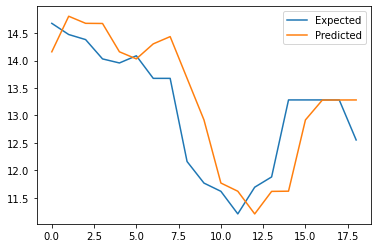

Shape of the array =  (62, 2)
>expected=14.5, predicted=14.7
>expected=14.4, predicted=14.8
>expected=14.0, predicted=14.4
>expected=14.0, predicted=14.0
>expected=14.1, predicted=14.0
>expected=13.7, predicted=14.2
>expected=13.7, predicted=14.4
>expected=12.2, predicted=13.7
>expected=11.8, predicted=12.2
>expected=11.6, predicted=11.8
>expected=11.2, predicted=11.6
>expected=11.7, predicted=11.2
>expected=11.9, predicted=11.7
>expected=13.3, predicted=11.5
>expected=13.3, predicted=12.2
>expected=13.3, predicted=12.2
>expected=13.3, predicted=13.3
>expected=12.6, predicted=13.3
MAE: 0.565


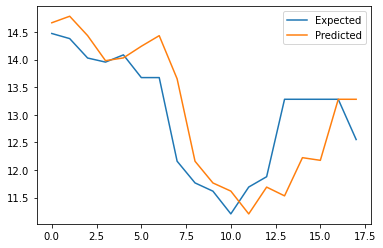

Shape of the array =  (57, 1)
>expected=14.3, predicted=12.6
>expected=14.1, predicted=14.3
>expected=14.1, predicted=14.3
>expected=14.3, predicted=14.1
>expected=14.1, predicted=14.1
>expected=14.3, predicted=14.2
>expected=13.8, predicted=14.1
>expected=13.8, predicted=14.3
>expected=13.8, predicted=13.8
>expected=13.6, predicted=13.8
>expected=13.5, predicted=13.6
>expected=13.3, predicted=13.5
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.2, predicted=13.3
MAE: 0.217


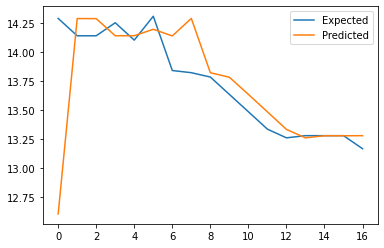

Shape of the array =  (57, 2)
>expected=14.3, predicted=12.8
>expected=14.1, predicted=13.0
>expected=14.1, predicted=14.1
>expected=14.3, predicted=14.1
>expected=14.1, predicted=14.2
>expected=14.3, predicted=14.1
>expected=13.8, predicted=14.1
>expected=13.8, predicted=14.2
>expected=13.8, predicted=14.0
>expected=13.6, predicted=13.8
>expected=13.5, predicted=13.6
>expected=13.3, predicted=13.5
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.3, predicted=13.3
>expected=13.2, predicted=13.3
MAE: 0.262


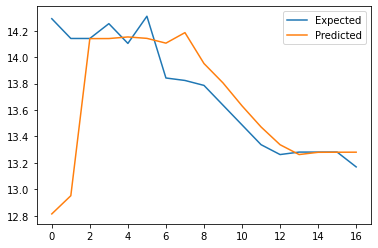

Shape of the array =  (61, 1)
>expected=13.8, predicted=13.8
>expected=13.9, predicted=13.7
>expected=13.9, predicted=13.8
>expected=13.8, predicted=13.8
>expected=13.8, predicted=14.2
>expected=13.8, predicted=13.8
>expected=13.8, predicted=14.0
>expected=13.8, predicted=14.0
>expected=13.8, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.8
>expected=13.9, predicted=14.0
>expected=13.9, predicted=13.8
>expected=13.9, predicted=13.9
>expected=14.0, predicted=14.0
>expected=14.0, predicted=14.0
MAE: 0.103


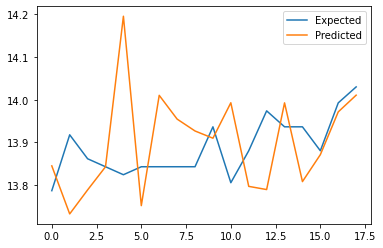

Shape of the array =  (61, 2)
>expected=13.8, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.9, predicted=13.9
>expected=13.8, predicted=14.0
>expected=13.8, predicted=14.0
>expected=13.8, predicted=13.7
>expected=13.8, predicted=13.8
>expected=13.8, predicted=13.8
>expected=13.8, predicted=13.9
>expected=13.9, predicted=14.1
>expected=13.8, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.9
>expected=13.9, predicted=14.0
>expected=13.9, predicted=14.0
>expected=13.9, predicted=13.8
>expected=14.0, predicted=13.9
>expected=14.0, predicted=14.0
MAE: 0.085


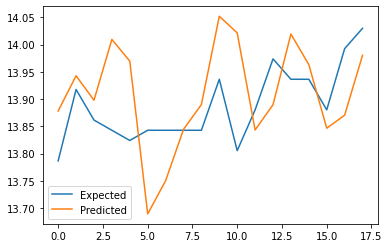

Shape of the array =  (63, 1)
>expected=17.4, predicted=17.0
>expected=17.2, predicted=17.4
>expected=17.4, predicted=17.4
>expected=17.3, predicted=17.2
>expected=17.9, predicted=17.2
>expected=17.9, predicted=17.2
>expected=18.0, predicted=17.9
>expected=17.6, predicted=18.0
>expected=17.9, predicted=17.9
>expected=17.7, predicted=17.9
>expected=17.7, predicted=17.9
>expected=17.6, predicted=17.7
>expected=17.6, predicted=17.9
>expected=17.5, predicted=17.6
>expected=17.6, predicted=17.6
>expected=17.5, predicted=17.6
>expected=17.6, predicted=17.6
>expected=17.5, predicted=17.9
>expected=17.6, predicted=17.6
MAE: 0.199


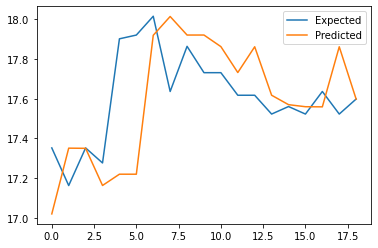

Shape of the array =  (63, 2)
>expected=17.4, predicted=15.9
>expected=17.2, predicted=17.4
>expected=17.4, predicted=17.2
>expected=17.3, predicted=17.2
>expected=17.9, predicted=17.2
>expected=17.9, predicted=17.8
>expected=18.0, predicted=17.9
>expected=17.6, predicted=18.0
>expected=17.9, predicted=17.6
>expected=17.7, predicted=18.0
>expected=17.7, predicted=17.9
>expected=17.6, predicted=17.7
>expected=17.6, predicted=17.7
>expected=17.5, predicted=18.3
>expected=17.6, predicted=17.6
>expected=17.5, predicted=17.6
>expected=17.6, predicted=17.6
>expected=17.5, predicted=17.7
>expected=17.6, predicted=17.6
MAE: 0.279


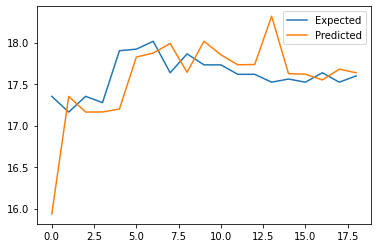

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.3
>expected=3.0, predicted=3.1
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=2.6, predicted=3.0
>expected=2.5, predicted=2.8
>expected=2.4, predicted=2.5
>expected=2.3, predicted=2.4
>expected=2.6, predicted=2.3
>expected=2.5, predicted=2.4
>expected=2.8, predicted=2.4
>expected=2.9, predicted=2.5
>expected=2.8, predicted=2.8
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.8
MAE: 0.144


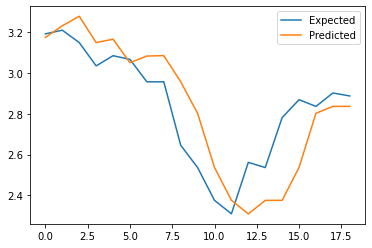

Shape of the array =  (62, 2)
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.0, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.0, predicted=3.1
>expected=3.0, predicted=3.1
>expected=2.6, predicted=3.0
>expected=2.5, predicted=2.6
>expected=2.4, predicted=2.5
>expected=2.3, predicted=2.4
>expected=2.6, predicted=2.3
>expected=2.5, predicted=2.6
>expected=2.8, predicted=2.3
>expected=2.9, predicted=2.5
>expected=2.8, predicted=2.6
>expected=2.9, predicted=2.7
>expected=2.9, predicted=2.9
MAE: 0.168


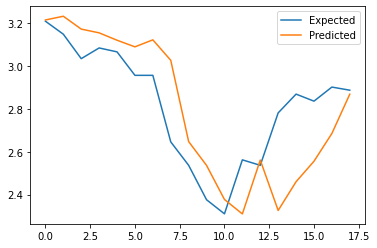

Shape of the array =  (57, 1)
>expected=3.2, predicted=2.9
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.1
MAE: 0.072


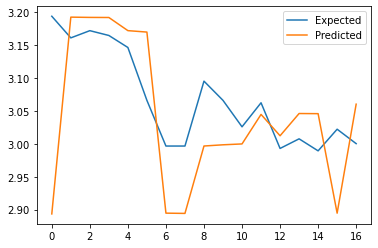

Shape of the array =  (57, 2)
>expected=3.2, predicted=3.2
>expected=3.2, predicted=2.9
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.1, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
MAE: 0.061


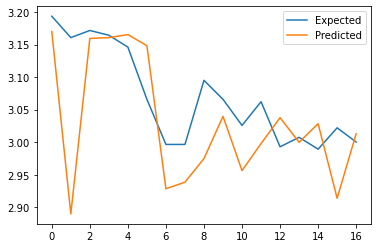

Shape of the array =  (61, 1)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.1
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
MAE: 0.043


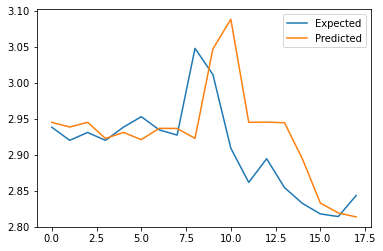

Shape of the array =  (61, 2)
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.1
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
MAE: 0.042


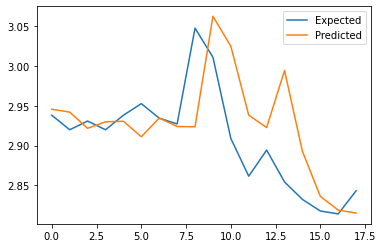

Shape of the array =  (63, 1)
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.2
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.6, predicted=3.4
>expected=3.7, predicted=3.4
>expected=4.0, predicted=3.7
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.8, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.7
MAE: 0.120


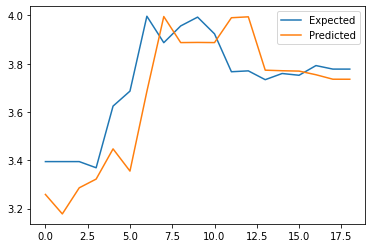

Shape of the array =  (63, 2)
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.6, predicted=3.4
>expected=3.7, predicted=3.4
>expected=4.0, predicted=3.6
>expected=3.9, predicted=4.0
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.8, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.7, predicted=4.0
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.8
MAE: 0.111


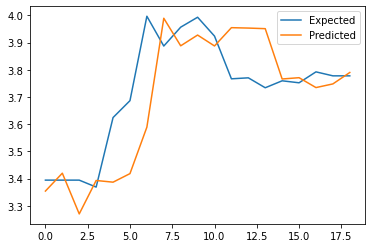

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=6.8, predicted=6.6
>expected=6.9, predicted=6.8
>expected=6.9, predicted=6.8
>expected=6.7, predicted=6.9
>expected=6.8, predicted=6.7
>expected=6.8, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.7
>expected=5.9, predicted=6.7
>expected=5.9, predicted=6.7
>expected=5.9, predicted=5.9
>expected=5.7, predicted=5.9
>expected=6.1, predicted=5.7
>expected=5.7, predicted=5.9
>expected=5.9, predicted=6.1
>expected=5.9, predicted=5.9
>expected=5.9, predicted=5.9
>expected=6.0, predicted=5.7
>expected=5.9, predicted=5.9
MAE: 0.188


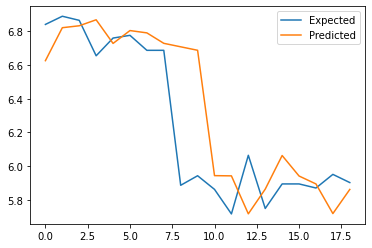

Shape of the array =  (62, 2)
>expected=6.9, predicted=6.7
>expected=6.9, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.8, predicted=6.8
>expected=6.8, predicted=6.8
>expected=6.7, predicted=6.8
>expected=6.7, predicted=6.8
>expected=5.9, predicted=6.7
>expected=5.9, predicted=5.9
>expected=5.9, predicted=6.1
>expected=5.7, predicted=5.9
>expected=6.1, predicted=5.7
>expected=5.7, predicted=6.1
>expected=5.9, predicted=5.9
>expected=5.9, predicted=5.7
>expected=5.9, predicted=5.9
>expected=6.0, predicted=5.8
>expected=5.9, predicted=5.9
MAE: 0.169


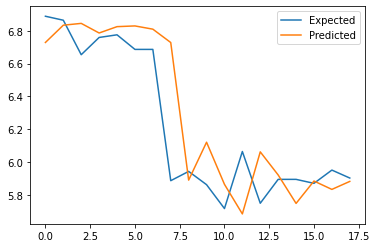

Shape of the array =  (57, 1)
>expected=7.0, predicted=6.5
>expected=6.9, predicted=7.0
>expected=7.0, predicted=7.0
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.7, predicted=7.0
>expected=6.5, predicted=7.0
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
MAE: 0.106


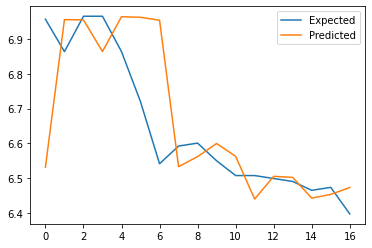

Shape of the array =  (57, 2)
>expected=7.0, predicted=6.5
>expected=6.9, predicted=7.0
>expected=7.0, predicted=6.9
>expected=7.0, predicted=6.9
>expected=6.9, predicted=7.0
>expected=6.7, predicted=6.9
>expected=6.5, predicted=7.0
>expected=6.6, predicted=6.5
>expected=6.6, predicted=6.5
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.6
>expected=6.5, predicted=6.4
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.5, predicted=6.5
>expected=6.4, predicted=6.5
MAE: 0.110


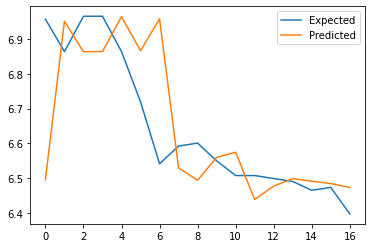

Shape of the array =  (61, 1)
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.2, predicted=6.1
>expected=6.4, predicted=6.1
>expected=6.3, predicted=6.4
>expected=6.4, predicted=6.3
>expected=6.3, predicted=6.4
>expected=6.2, predicted=6.4
>expected=6.4, predicted=6.4
>expected=6.3, predicted=6.4
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.1, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.2
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.0
MAE: 0.070


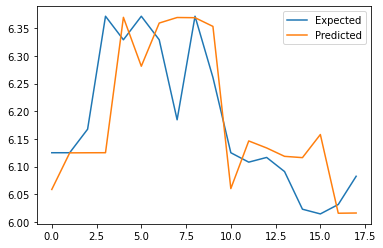

Shape of the array =  (61, 2)
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.2, predicted=6.1
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.2
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.2, predicted=6.4
>expected=6.4, predicted=6.2
>expected=6.3, predicted=6.3
>expected=6.1, predicted=6.3
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.1, predicted=6.2
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.1
>expected=6.0, predicted=6.0
>expected=6.1, predicted=6.0
MAE: 0.092


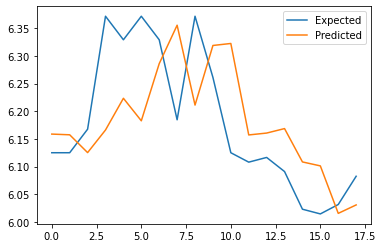

Shape of the array =  (63, 1)
>expected=7.1, predicted=6.7
>expected=7.0, predicted=7.0
>expected=7.0, predicted=7.0
>expected=7.0, predicted=7.0
>expected=7.1, predicted=6.9
>expected=7.1, predicted=7.0
>expected=7.6, predicted=7.1
>expected=7.6, predicted=7.3
>expected=7.5, predicted=7.6
>expected=7.5, predicted=7.5
>expected=7.5, predicted=7.5
>expected=7.3, predicted=7.5
>expected=7.3, predicted=7.3
>expected=7.2, predicted=7.3
>expected=7.3, predicted=7.3
>expected=7.3, predicted=7.2
>expected=7.4, predicted=7.3
>expected=7.4, predicted=7.3
>expected=7.4, predicted=7.4
MAE: 0.109


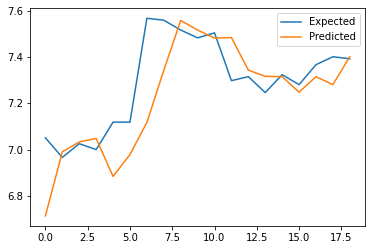

Shape of the array =  (63, 2)
>expected=7.1, predicted=6.7
>expected=7.0, predicted=6.7
>expected=7.0, predicted=6.9
>expected=7.0, predicted=7.0
>expected=7.1, predicted=6.9
>expected=7.1, predicted=6.9
>expected=7.6, predicted=6.9
>expected=7.6, predicted=7.5
>expected=7.5, predicted=7.5
>expected=7.5, predicted=7.6
>expected=7.5, predicted=7.5
>expected=7.3, predicted=7.5
>expected=7.3, predicted=7.5
>expected=7.2, predicted=7.6
>expected=7.3, predicted=7.3
>expected=7.3, predicted=7.3
>expected=7.4, predicted=7.2
>expected=7.4, predicted=7.3
>expected=7.4, predicted=7.3
MAE: 0.164


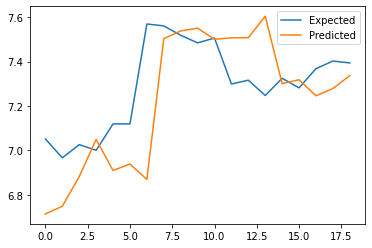

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.6
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.4, predicted=5.5
>expected=5.2, predicted=5.4
>expected=4.9, predicted=5.4
>expected=4.6, predicted=4.9
>expected=4.7, predicted=4.6
>expected=5.0, predicted=4.7
>expected=5.0, predicted=4.6
>expected=4.7, predicted=5.0
>expected=4.8, predicted=5.0
>expected=5.0, predicted=4.6
>expected=5.2, predicted=5.0
>expected=5.2, predicted=4.9
>expected=5.1, predicted=5.0
MAE: 0.201


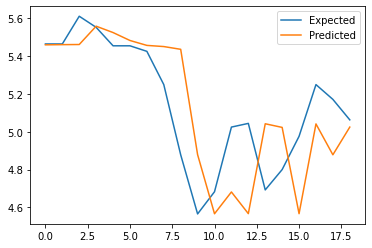

Shape of the array =  (62, 2)
>expected=5.5, predicted=5.4
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.6
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.5
>expected=5.4, predicted=5.5
>expected=5.2, predicted=5.4
>expected=4.9, predicted=5.4
>expected=4.6, predicted=4.9
>expected=4.7, predicted=4.6
>expected=5.0, predicted=4.7
>expected=5.0, predicted=5.0
>expected=4.7, predicted=5.0
>expected=4.8, predicted=4.6
>expected=5.0, predicted=5.0
>expected=5.2, predicted=4.7
>expected=5.2, predicted=4.7
>expected=5.1, predicted=4.7
MAE: 0.212


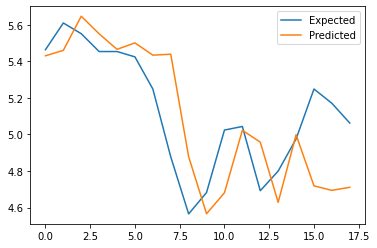

Shape of the array =  (57, 1)
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.4, predicted=5.5
>expected=5.3, predicted=5.5
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.3, predicted=5.5
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.3
>expected=5.5, predicted=5.4
MAE: 0.077


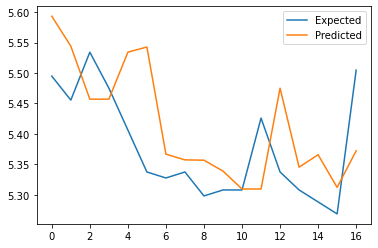

Shape of the array =  (57, 2)
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.4, predicted=5.5
>expected=5.3, predicted=5.5
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.5
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.3, predicted=5.5
>expected=5.3, predicted=5.3
>expected=5.3, predicted=5.4
>expected=5.3, predicted=5.4
>expected=5.5, predicted=5.3
MAE: 0.096


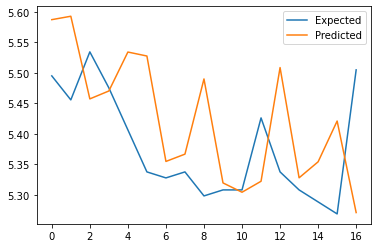

Shape of the array =  (61, 1)
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.6, predicted=5.3
>expected=5.3, predicted=5.4
>expected=5.4, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.1, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.1, predicted=5.2
MAE: 0.092


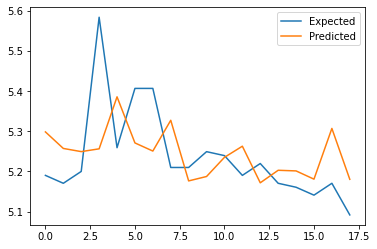

Shape of the array =  (61, 2)
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.6, predicted=5.3
>expected=5.3, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.3
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.3
>expected=5.1, predicted=5.6
>expected=5.2, predicted=5.1
>expected=5.1, predicted=5.2
MAE: 0.100


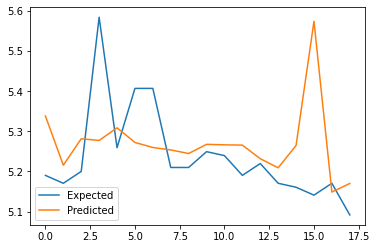

Shape of the array =  (63, 1)
>expected=5.4, predicted=5.5
>expected=5.4, predicted=5.3
>expected=5.4, predicted=5.4
>expected=5.5, predicted=5.4
>expected=5.5, predicted=5.4
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.4
>expected=5.6, predicted=5.6
>expected=5.7, predicted=5.6
>expected=5.7, predicted=5.7
>expected=5.7, predicted=5.7
>expected=5.6, predicted=5.7
>expected=5.6, predicted=5.4
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.6
>expected=5.6, predicted=5.7
MAE: 0.073


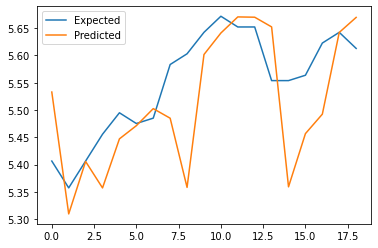

Shape of the array =  (63, 2)
>expected=5.4, predicted=5.5
>expected=5.4, predicted=5.4
>expected=5.4, predicted=5.4
>expected=5.5, predicted=5.4
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.6
>expected=5.5, predicted=5.4
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.7, predicted=5.6
>expected=5.7, predicted=5.7
>expected=5.7, predicted=5.7
>expected=5.6, predicted=5.7
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.6
>expected=5.6, predicted=5.6
>expected=5.6, predicted=5.7
MAE: 0.059


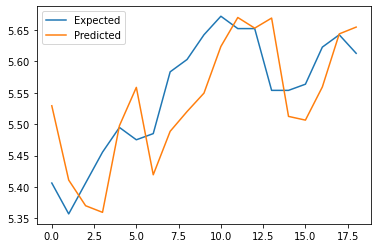

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=5.2, predicted=5.2
>expected=5.2, predicted=5.0
>expected=5.3, predicted=5.0
>expected=5.3, predicted=5.0
>expected=5.3, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.5, predicted=5.3
>expected=5.0, predicted=5.5
>expected=5.0, predicted=5.0
>expected=5.1, predicted=5.2
>expected=5.1, predicted=5.0
>expected=5.3, predicted=5.0
>expected=5.5, predicted=5.4
>expected=5.5, predicted=5.0
>expected=5.5, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.8, predicted=5.6
>expected=5.6, predicted=5.8
MAE: 0.158


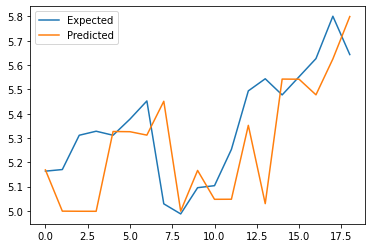

Shape of the array =  (62, 2)
>expected=5.2, predicted=5.0
>expected=5.3, predicted=5.0
>expected=5.3, predicted=5.0
>expected=5.3, predicted=5.3
>expected=5.4, predicted=5.3
>expected=5.5, predicted=5.3
>expected=5.0, predicted=5.5
>expected=5.0, predicted=4.9
>expected=5.1, predicted=5.2
>expected=5.1, predicted=5.1
>expected=5.3, predicted=5.1
>expected=5.5, predicted=5.3
>expected=5.5, predicted=5.5
>expected=5.5, predicted=5.1
>expected=5.6, predicted=5.5
>expected=5.6, predicted=5.5
>expected=5.8, predicted=5.6
>expected=5.6, predicted=5.8
MAE: 0.171


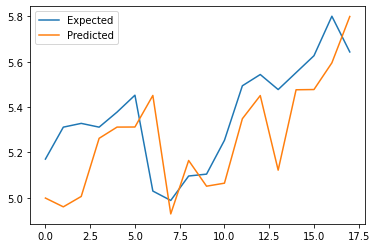

Shape of the array =  (57, 1)
>expected=9.8, predicted=10.4
>expected=10.1, predicted=9.8
>expected=10.4, predicted=9.9
>expected=10.4, predicted=9.9
>expected=10.3, predicted=10.4
>expected=10.4, predicted=10.3
>expected=9.7, predicted=9.9
>expected=10.0, predicted=10.1
>expected=9.9, predicted=10.4
>expected=9.6, predicted=9.9
>expected=10.0, predicted=10.0
>expected=10.0, predicted=9.9
>expected=10.0, predicted=9.6
>expected=10.1, predicted=10.0
>expected=10.1, predicted=10.0
>expected=9.9, predicted=10.1
>expected=10.4, predicted=9.6
MAE: 0.285


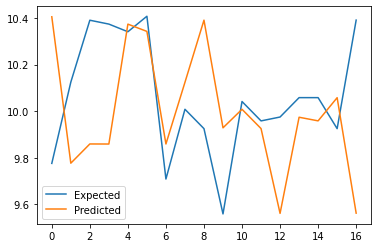

Shape of the array =  (57, 2)
>expected=9.8, predicted=10.2
>expected=10.1, predicted=10.2
>expected=10.4, predicted=10.1
>expected=10.4, predicted=9.9
>expected=10.3, predicted=9.8
>expected=10.4, predicted=10.3
>expected=9.7, predicted=10.4
>expected=10.0, predicted=9.7
>expected=9.9, predicted=10.4
>expected=9.6, predicted=10.3
>expected=10.0, predicted=10.3
>expected=10.0, predicted=10.2
>expected=10.0, predicted=10.1
>expected=10.1, predicted=10.0
>expected=10.1, predicted=10.0
>expected=9.9, predicted=10.1
>expected=10.4, predicted=10.0
MAE: 0.308


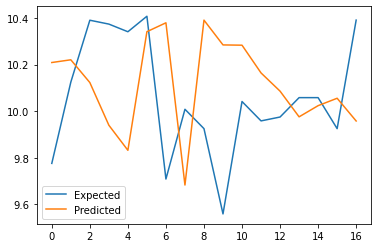

Shape of the array =  (61, 1)
>expected=11.5, predicted=14.6
>expected=11.6, predicted=12.5
>expected=11.6, predicted=11.6
>expected=11.3, predicted=11.6
>expected=10.8, predicted=11.6
>expected=9.9, predicted=10.8
>expected=10.3, predicted=9.9
>expected=10.8, predicted=9.9
>expected=11.7, predicted=9.9
>expected=11.7, predicted=11.5
>expected=11.8, predicted=11.7
>expected=11.6, predicted=11.7
>expected=11.7, predicted=11.5
>expected=12.1, predicted=11.7
>expected=13.2, predicted=12.5
>expected=14.1, predicted=13.7
>expected=14.5, predicted=13.0
>expected=14.1, predicted=15.0
MAE: 0.760


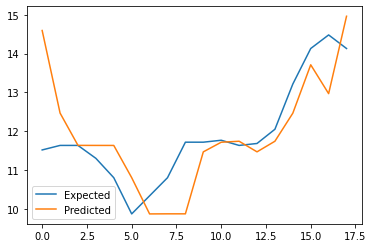

Shape of the array =  (61, 2)
>expected=11.5, predicted=14.6
>expected=11.6, predicted=13.5
>expected=11.6, predicted=11.7
>expected=11.3, predicted=11.6
>expected=10.8, predicted=11.3
>expected=9.9, predicted=10.9
>expected=10.3, predicted=9.8
>expected=10.8, predicted=9.7
>expected=11.7, predicted=10.5
>expected=11.7, predicted=11.8
>expected=11.8, predicted=11.6
>expected=11.6, predicted=11.8
>expected=11.7, predicted=11.5
>expected=12.1, predicted=11.8
>expected=13.2, predicted=11.6
>expected=14.1, predicted=13.7
>expected=14.5, predicted=13.9
>expected=14.1, predicted=14.9
MAE: 0.778


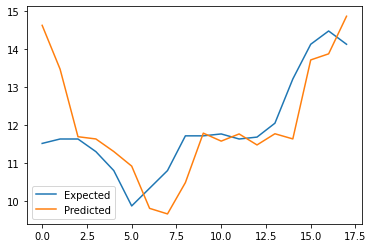

Shape of the array =  (63, 1)
>expected=12.2, predicted=12.0
>expected=12.1, predicted=12.1
>expected=12.1, predicted=12.2
>expected=12.2, predicted=12.0
>expected=12.2, predicted=12.1
>expected=12.0, predicted=12.2
>expected=11.5, predicted=12.1
>expected=10.0, predicted=12.0
>expected=10.0, predicted=10.0
>expected=10.4, predicted=10.0
>expected=10.3, predicted=10.4
>expected=10.3, predicted=10.3
>expected=10.4, predicted=10.3
>expected=10.5, predicted=10.3
>expected=10.6, predicted=10.5
>expected=10.5, predicted=10.6
>expected=10.4, predicted=10.6
>expected=10.0, predicted=10.3
>expected=10.2, predicted=10.0
MAE: 0.282


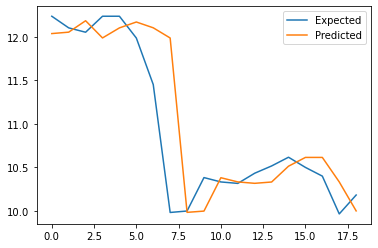

Shape of the array =  (63, 2)
>expected=12.2, predicted=12.0
>expected=12.1, predicted=12.0
>expected=12.1, predicted=12.0
>expected=12.2, predicted=11.9
>expected=12.2, predicted=12.1
>expected=12.0, predicted=12.1
>expected=11.5, predicted=12.0
>expected=10.0, predicted=12.1
>expected=10.0, predicted=10.0
>expected=10.4, predicted=9.8
>expected=10.3, predicted=10.2
>expected=10.3, predicted=10.3
>expected=10.4, predicted=10.5
>expected=10.5, predicted=10.3
>expected=10.6, predicted=10.4
>expected=10.5, predicted=10.5
>expected=10.4, predicted=10.6
>expected=10.0, predicted=10.4
>expected=10.2, predicted=10.1
MAE: 0.279


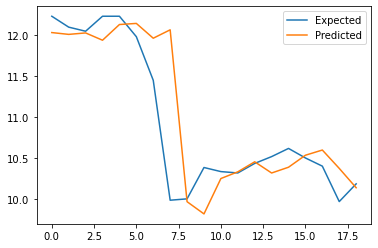

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.2, predicted=3.4
>expected=3.3, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.2, predicted=3.3
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.2
>expected=3.2, predicted=3.1
>expected=3.0, predicted=3.2
>expected=3.3, predicted=3.1
>expected=3.2, predicted=3.2
>expected=3.3, predicted=3.0
>expected=3.2, predicted=3.2
>expected=3.3, predicted=3.0
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
MAE: 0.085


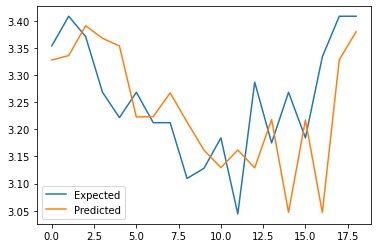

Shape of the array =  (62, 2)
>expected=3.4, predicted=3.4
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.2, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.2, predicted=3.3
>expected=3.2, predicted=3.3
>expected=3.1, predicted=3.2
>expected=3.1, predicted=3.1
>expected=3.2, predicted=3.1
>expected=3.0, predicted=3.2
>expected=3.3, predicted=3.1
>expected=3.2, predicted=3.1
>expected=3.3, predicted=3.2
>expected=3.2, predicted=3.2
>expected=3.3, predicted=3.2
>expected=3.4, predicted=3.3
>expected=3.4, predicted=3.4
MAE: 0.069


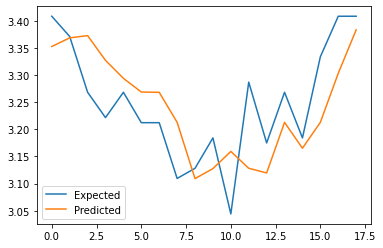

Shape of the array =  (57, 1)
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.8, predicted=4.0
>expected=3.9, predicted=3.8
>expected=3.9, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.7, predicted=3.9
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.9
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.9
MAE: 0.086


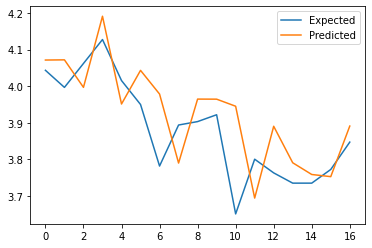

Shape of the array =  (57, 2)
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.2
>expected=4.0, predicted=4.1
>expected=3.9, predicted=4.1
>expected=3.8, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.7, predicted=4.0
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.9
>expected=3.7, predicted=3.8
>expected=3.8, predicted=3.7
>expected=3.8, predicted=3.9
MAE: 0.080


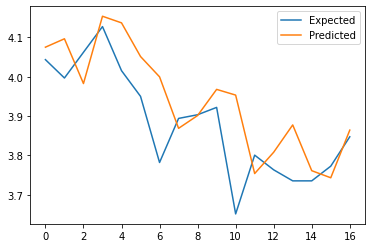

Shape of the array =  (61, 1)
>expected=4.0, predicted=3.9
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=4.0, predicted=3.8
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
MAE: 0.047


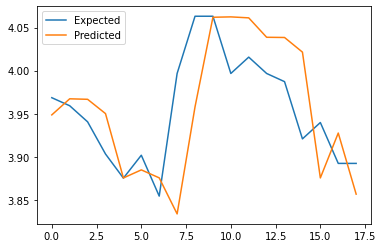

Shape of the array =  (61, 2)
>expected=4.0, predicted=3.9
>expected=4.0, predicted=3.9
>expected=3.9, predicted=4.0
>expected=3.9, predicted=4.0
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=4.0, predicted=3.8
>expected=4.1, predicted=4.0
>expected=4.1, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=4.0, predicted=4.1
>expected=4.0, predicted=4.0
>expected=3.9, predicted=4.1
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
>expected=3.9, predicted=3.9
MAE: 0.056


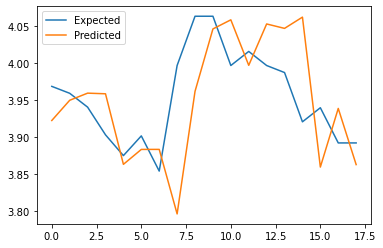

Shape of the array =  (63, 1)
>expected=5.1, predicted=4.8
>expected=5.0, predicted=4.8
>expected=5.0, predicted=5.0
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.8
>expected=4.9, predicted=4.9
>expected=4.9, predicted=5.0
>expected=5.0, predicted=4.9
>expected=5.2, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.0, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.2, predicted=5.0
>expected=5.2, predicted=5.1
MAE: 0.106


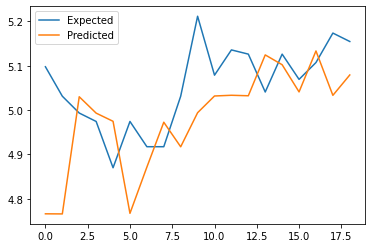

Shape of the array =  (63, 2)
>expected=5.1, predicted=4.8
>expected=5.0, predicted=4.8
>expected=5.0, predicted=5.0
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=5.0, predicted=5.0
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=5.0, predicted=5.0
>expected=5.2, predicted=4.9
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.0, predicted=5.1
>expected=5.1, predicted=5.0
>expected=5.1, predicted=5.1
>expected=5.1, predicted=5.1
>expected=5.2, predicted=5.1
>expected=5.2, predicted=5.1
MAE: 0.093


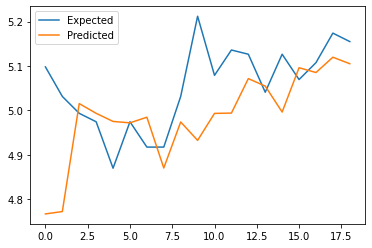

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.4, predicted=3.7
>expected=3.2, predicted=3.4
>expected=3.0, predicted=3.2
>expected=2.9, predicted=3.0
>expected=3.0, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.1, predicted=3.0
>expected=3.2, predicted=2.9
>expected=3.2, predicted=3.0
>expected=3.2, predicted=3.0
>expected=3.0, predicted=3.1
MAE: 0.101


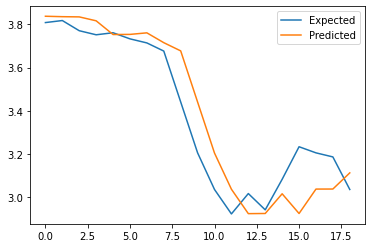

Shape of the array =  (62, 2)
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.8, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.8
>expected=3.7, predicted=3.7
>expected=3.4, predicted=3.7
>expected=3.2, predicted=3.4
>expected=3.0, predicted=3.2
>expected=2.9, predicted=3.0
>expected=3.0, predicted=2.9
>expected=2.9, predicted=3.0
>expected=3.1, predicted=3.0
>expected=3.2, predicted=2.9
>expected=3.2, predicted=3.1
>expected=3.2, predicted=3.1
>expected=3.0, predicted=3.1
MAE: 0.099


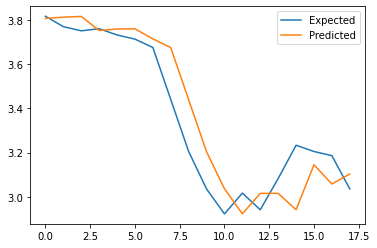

Shape of the array =  (57, 1)
>expected=3.5, predicted=3.7
>expected=3.5, predicted=3.6
>expected=3.4, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.5
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.5
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.2, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.4, predicted=3.3
MAE: 0.058


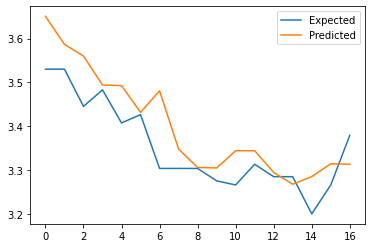

Shape of the array =  (57, 2)
>expected=3.5, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.4, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.4, predicted=3.5
>expected=3.4, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.4
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.3, predicted=3.3
>expected=3.2, predicted=3.3
>expected=3.3, predicted=3.2
>expected=3.4, predicted=3.3
MAE: 0.058


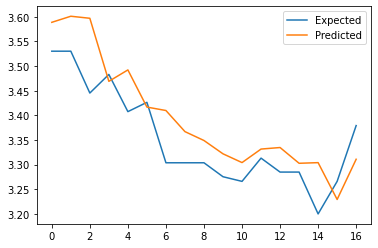

Shape of the array =  (61, 1)
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=2.9, predicted=3.1
>expected=3.0, predicted=2.9
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
MAE: 0.051


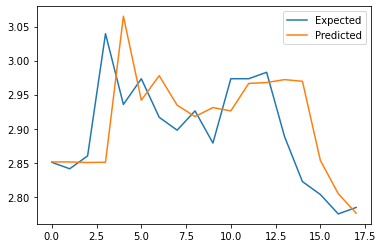

Shape of the array =  (61, 2)
>expected=2.9, predicted=2.9
>expected=2.8, predicted=2.9
>expected=2.9, predicted=2.8
>expected=3.0, predicted=2.9
>expected=2.9, predicted=3.0
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.9, predicted=2.8
>expected=2.9, predicted=2.9
>expected=2.9, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=2.9
>expected=3.0, predicted=3.0
>expected=2.9, predicted=3.0
>expected=2.8, predicted=2.9
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
>expected=2.8, predicted=2.8
MAE: 0.056


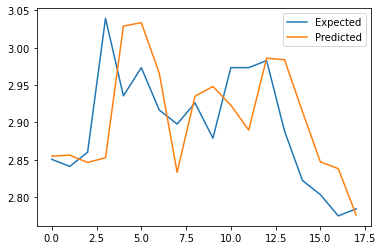

Shape of the array =  (63, 1)
>expected=3.6, predicted=3.4
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.4
>expected=3.7, predicted=3.6
>expected=3.6, predicted=3.7
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.7
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.7
>expected=3.5, predicted=3.7
>expected=3.6, predicted=3.4
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.6
MAE: 0.090


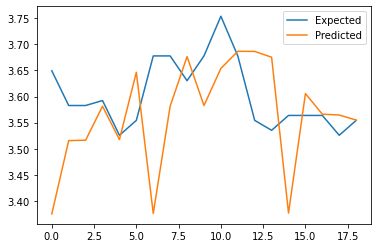

Shape of the array =  (63, 2)
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.7, predicted=3.5
>expected=3.6, predicted=3.6
>expected=3.7, predicted=3.6
>expected=3.8, predicted=3.6
>expected=3.7, predicted=3.7
>expected=3.6, predicted=3.6
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.6
>expected=3.6, predicted=3.5
>expected=3.5, predicted=3.6
>expected=3.6, predicted=3.6
MAE: 0.060


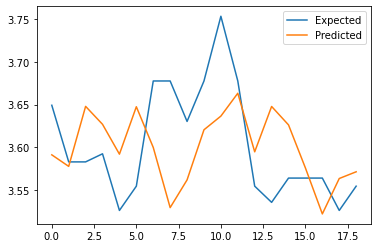

In [135]:
quotes = ['4707.KL','7084.KL','3689.KL','1961.KL','2291.KL','5211.KL','8664.KL','8206.KL','5200.KL','5235SS.KL','5227.KL',
          '5212.KL','7161.KL','8877.KL','9261.KL','0166.KL','7204.KL','0138.KL','0097.KL','5005.KL','4677.KL','5347.KL',
          '5264.KL','5014.KL','5246.KL','3816.KL','5681.KL','7293.KL','7277.KL','5210.KL','1066.KL','5819.KL','1295.KL',
          '1155.KL','5225.KL','5168.KL','4863.KL','6888.KL']
process_prediction(quotes)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Shape of the array =  (62, 1)
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.3, predicted=4.7
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.7, predicted=4.3
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.9, predicted=4.7
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.9
MAE: 0.097


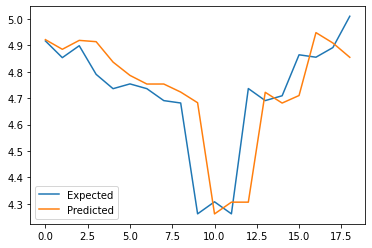

Shape of the array =  (62, 2)
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.3, predicted=4.7
>expected=4.3, predicted=4.3
>expected=4.3, predicted=4.3
>expected=4.7, predicted=4.3
>expected=4.7, predicted=4.3
>expected=4.7, predicted=4.7
>expected=4.9, predicted=4.6
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.8
>expected=5.0, predicted=4.8
MAE: 0.135


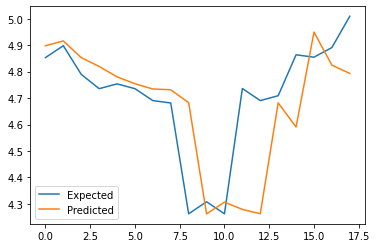

Shape of the array =  (57, 1)
>expected=4.9, predicted=4.8
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.9, predicted=4.8
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.8
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.8
>expected=4.9, predicted=4.9
>expected=4.9, predicted=5.0
>expected=4.9, predicted=4.8
>expected=4.9, predicted=4.8
MAE: 0.072


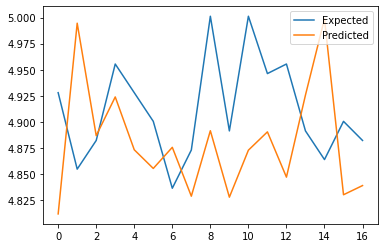

Shape of the array =  (57, 2)
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.8, predicted=4.9
>expected=4.9, predicted=4.8
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.9
>expected=5.0, predicted=4.7
>expected=4.9, predicted=4.8
>expected=5.0, predicted=4.9
>expected=4.9, predicted=4.8
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
>expected=4.9, predicted=4.9
MAE: 0.062


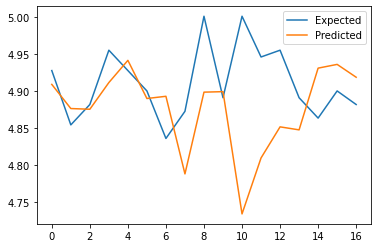

Shape of the array =  (61, 1)
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.9
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.9
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
MAE: 0.058


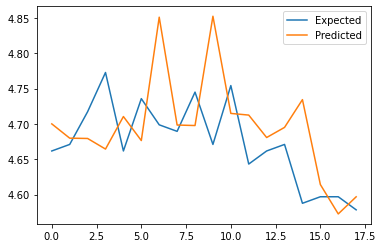

Shape of the array =  (61, 2)
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.8, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.6, predicted=4.7
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
>expected=4.6, predicted=4.6
MAE: 0.056


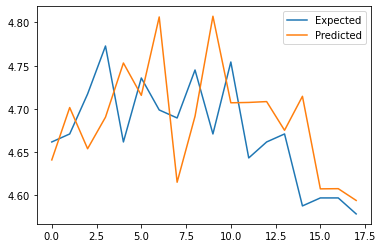

Shape of the array =  (63, 1)
>expected=4.7, predicted=4.5
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.7
MAE: 0.042


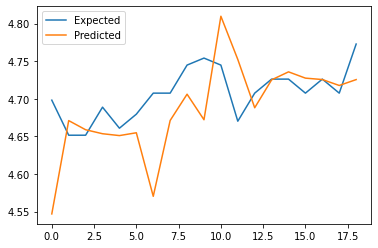

Shape of the array =  (63, 2)
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.6
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.7
>expected=4.7, predicted=4.8
>expected=4.7, predicted=4.7
>expected=4.8, predicted=4.8
MAE: 0.045


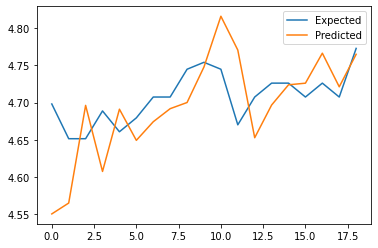

In [136]:
quotes = ['6012.KL']
process_prediction(quotes)